# 📊 Deep Research — Batch Report Evaluation for the domain `NLP`

This notebook evaluates **multiple** Deep Research `.md` reports using **YESciEval rubrics**.

### Steps
1. **Read** all `.md` report files in a given folder
2. For each report, **read the research question** from the domain CSV 
3. **Run the YESciEval judge** across all rubrics for every report
4. **Aggregate** rubric scores → category scores (0–1) per report
5. **Accumulate** scores across reports → config-level mean ± std
6. Display a **per-report score table** and a **6-panel batch quality plot**
7. Save:
   - `batch_reports.csv` — one row per report
   - `batch_config_summary.csv` — one row per config with mean/std
   - `batch_quality_dimensions.png` — 6-panel plot
   - `<stem>_scores.json` — full rubric detail per report
   - `raw_output_{DOMAIN}_{model_slug}_{timestamp}.json` — raw judge output for every rubric call

---
**Prerequisites:** `pip install yescieval python-dotenv matplotlib numpy`

## 1 — Imports & Setup

In [1]:
# ── Path configuration ───────────────────────────────────────────────────────
PROJECT_ROOT  = "/nfs/home/gillm/deep-research"
REPORTS_DIR   = f"{PROJECT_ROOT}/data/nlp/reports/orkg-ask/o3-mini"
QUESTIONS_CSV = f"{PROJECT_ROOT}/data/nlp/49-questions-nlp.csv"
OUTPUT_DIR    = f"{PROJECT_ROOT}/scripts/LLMJ-Out-Batch/nlp"

In [2]:
!pip install yescieval python-dotenv matplotlib torch -q

In [3]:
import re, json, csv
import os 
from pathlib import Path
from typing import Dict, Tuple, List, Any
import ast
from collections import defaultdict
import numpy as np
import matplotlib.pyplot as plt
import torch, gc
from datetime import datetime, timezone
from IPython.display import display, Markdown
from dotenv import load_dotenv
load_dotenv()

print(f"Directory exists: {os.path.exists(REPORTS_DIR)}")

print("✅ Core imports loaded")

Directory exists: True
✅ Core imports loaded


In [4]:
from yescieval import CustomAutoJudge, VocabularyInjector, ExampleInjector
from yescieval.rubric.pointwise.depth      import TemporalPrecision, CausalReasoning, MechanisticUnderstanding
from yescieval.rubric.pointwise.breadth    import ContextCoverage, ScopeCoverage, DimensionCoverage, ScaleCoverage, MethodCoverage
from yescieval.rubric.pointwise.rigor      import EpistemicCalibration, ExplicitUncertainty, QuantitativeEvidenceAndUncertainty
from yescieval.rubric.pointwise.innovation import StateOfTheArtAndNovelty
from yescieval.rubric.pointwise.gap        import GapIdentification
print("✅ YESciEval imports loaded")

/nfs/home/gillm/miniconda3/envs/py312/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


✅ YESciEval imports loaded


## 2 — Configuration

In [5]:
# ── USER CONFIGURATION ────────────────────────────────────────────────────────

DOMAIN         = "nlp"
MODEL_ID       = "Qwen/Qwen3-1.7B"
DEVICE         = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(DEVICE)                                     
HF_TOKEN       = "your_hugging_face_token"
MAX_NEW_TOKENS = 2048
REPORT_GLOB    = "*.md"
ALL_CONFIGS    = ['d1_b1', 'd1_b4', 'd4_b1', 'd4_b4']

# Category -> list of (RubricClass, weight) tuples
CATEGORIES: Dict[str, List[Tuple[type, float]]] = {
    "depth": [
        (TemporalPrecision,         1/3),
        (CausalReasoning,           1/3),
        (MechanisticUnderstanding,  1/3),
    ],
    "breadth": [
        (ContextCoverage,   1/5),
        (ScopeCoverage,     1/5),
        (DimensionCoverage, 1/5),
        (MethodCoverage,    1/5),
        (ScaleCoverage,     1/5),
    ],
    "rigor": [
        (EpistemicCalibration,               1/3),
        (ExplicitUncertainty,                1/3),
        (QuantitativeEvidenceAndUncertainty, 1/3),
    ],
    "innovation": [
        (StateOfTheArtAndNovelty, 1.0),
    ],
    "gap": [
        (GapIdentification, 1.0),
    ],
}

CAT_NAMES  = list(CATEGORIES.keys())   # ['depth','breadth','rigor','innovation','gap']
SCORE_COLS = CAT_NAMES + ['overall']   # category scores + overall

print(f"Reports dir    : {REPORTS_DIR}")
print(f"Questions      : {QUESTIONS_CSV}")
print(f"Model          : {MODEL_ID}")
print(f"Categories     : {CAT_NAMES}")
print(f"All configs    : {ALL_CONFIGS}")

cuda
Reports dir    : /nfs/home/gillm/deep-research/data/nlp/reports/orkg-ask/o3-mini
Questions      : /nfs/home/gillm/deep-research/data/nlp/49-questions-nlp.csv
Model          : Qwen/Qwen3-1.7B
Categories     : ['depth', 'breadth', 'rigor', 'innovation', 'gap']
All configs    : ['d1_b1', 'd1_b4', 'd4_b1', 'd4_b4']


## 3 — Helper Functions

In [6]:
def parse_config(stem: str) -> str:
    """Extracts dX_bY from filename, e.g. '1_o3-mini_orkg_d1_b1' -> 'd1_b1'."""
    m = re.search(r'd(\d+)_b(\d+)', stem)
    return f"d{m.group(1)}_b{m.group(2)}" if m else 'unknown'


def parse_report_number(stem: str) -> int:
    """Extracts the leading integer from a filename, e.g. '1_o3-mini' -> 1."""
    m = re.match(r'(\d+)[_\-]', stem)
    return int(m.group(1)) if m else -1


def load_question_from_csv(csv_path: str, report_number: int) -> str:
    encodings_to_try = ['cp1252', 'utf-8', 'utf-8-sig', 'latin-1']
    for encoding in encodings_to_try:
        try:
            with open(csv_path, newline='', encoding=encoding) as f:
                reader = csv.DictReader(f)
                for row_num, row in enumerate(reader, start=1):
                    if row_num == report_number:
                        normalised = {k.strip().lower(): v.strip() for k, v in row.items()}
                        return normalised.get('title', '')
            raise ValueError(f'Row {report_number} not found in CSV: {csv_path}')
        except UnicodeDecodeError:
            continue
    raise ValueError(f'Could not open {csv_path} with any known encoding')

def parse_judge_result(result: Any, rubric_name: str) -> Tuple[int, str]:

    def extract(obj):

        # ---------- STRING ----------
        if isinstance(obj, str):

            # Remove think tags
            obj = re.sub(r"<think>.*?</think>", "", obj, flags=re.DOTALL).strip()

            # Try parsing JSON / Python dict string
            for parser in (json.loads, ast.literal_eval):
                try:
                    parsed = parser(obj)
                    return extract(parsed)
                except:
                    pass

            # Regex fallback
            m = re.search(r'["\']rating["\']\s*:\s*["\']?([1-5])', obj)
            if m:
                return int(m.group(1)), obj

            # Plain number
            if obj.isdigit():
                return int(obj), ""

            return 0, obj

        # ---------- DICT ----------
        if isinstance(obj, dict):

            # Direct rating
            if "rating" in obj:
                rating = int(obj.get("rating", 0))
                rationale = str(obj.get("rationale", ""))

                # Check nested rationale
                nested_rating, nested_rationale = extract(rationale)

                return (
                    (nested_rating, nested_rationale)
                    if nested_rating > 0
                    else (rating, rationale)
                )

            # Rubric lookup
            if rubric_name in obj:
                return extract(obj[rubric_name])

            # Search recursively
            for value in obj.values():
                rating, rationale = extract(value)
                if rating > 0:
                    return rating, rationale

            return 0, str(obj)

        # ---------- LIST ----------
        if isinstance(obj, list):
            for item in obj:
                rating, rationale = extract(item)
                if rating > 0:
                    return rating, rationale

        return 0, str(obj)

    rating, rationale = extract(result)

    # Default fallback
    rating = max(1, min(5, rating)) if rating else 1

    return rating, rationale

def compute_category_score(rubric_scores: List[Tuple[float, float]]) -> float:
    """
    Weighted mean of (score, weight) pairs, normalized from 1-5 to 0-1.
    Formula: (weighted_mean - 1) / (5 - 1)
    """
    total_w = sum(w for _, w in rubric_scores)
    if not total_w:
        return 0.0
    weighted_mean = sum(s * w for s, w in rubric_scores) / total_w
    return round((weighted_mean - 1) / 4, 4)


def discover_reports(reports_dir: str, glob_pattern: str) -> List[Path]:
    """Returns matching files sorted by their leading report number."""
    return sorted(
        Path(reports_dir).glob(glob_pattern),
        key=lambda p: parse_report_number(p.stem)
    )


print("✅ Helpers defined")

✅ Helpers defined


## 4 — Discover Reports

In [7]:
report_paths = discover_reports(REPORTS_DIR, REPORT_GLOB)

if not report_paths:
    raise FileNotFoundError(
        f"No files matching '{REPORT_GLOB}' found in: {REPORTS_DIR}\n"
        "Check REPORTS_DIR and REPORT_GLOB in the configuration cell."
    )

print(f"Found {len(report_paths)} report(s) in '{REPORTS_DIR}':")
for i, p in enumerate(report_paths, 1):
    cfg  = parse_config(p.stem)
    rnum = parse_report_number(p.stem)
    print(f"  [{i:>3}] {p.name}   config={cfg}  report#={rnum}")

Found 196 report(s) in '/nfs/home/gillm/deep-research/data/nlp/reports/orkg-ask/o3-mini':
  [  1] 1_o3-mini_orkg_d1_b4.md   config=d1_b4  report#=1
  [  2] 1_o3-mini_orkg_d4_b1.md   config=d4_b1  report#=1
  [  3] 1_o3-mini_orkg_d4_b4.md   config=d4_b4  report#=1
  [  4] 1_o3-mini_orkg_d1_b1.md   config=d1_b1  report#=1
  [  5] 2_o3-mini_orkg_d1_b4.md   config=d1_b4  report#=2
  [  6] 2_o3-mini_orkg_d1_b1.md   config=d1_b1  report#=2
  [  7] 2_o3-mini_orkg_d4_b4.md   config=d4_b4  report#=2
  [  8] 2_o3-mini_orkg_d4_b1.md   config=d4_b1  report#=2
  [  9] 3_o3-mini_orkg_d1_b1.md   config=d1_b1  report#=3
  [ 10] 3_o3-mini_orkg_d1_b4.md   config=d1_b4  report#=3
  [ 11] 3_o3-mini_orkg_d4_b1.md   config=d4_b1  report#=3
  [ 12] 3_o3-mini_orkg_d4_b4.md   config=d4_b4  report#=3
  [ 13] 4_o3-mini_orkg_d1_b1.md   config=d1_b1  report#=4
  [ 14] 4_o3-mini_orkg_d4_b4.md   config=d4_b4  report#=4
  [ 15] 4_o3-mini_orkg_d1_b4.md   config=d1_b4  report#=4
  [ 16] 4_o3-mini_orkg_d4_b1.md   config

## 5 — Initialise the YESciEval Judge

The model is loaded **once** and reused across the entire batch.

In [8]:
print(f"Loading {MODEL_ID} on {DEVICE} ...")
judge = CustomAutoJudge()
judge.from_pretrained(model_id=MODEL_ID, device=DEVICE, token=HF_TOKEN or None)
print("Judge ready")
EVAL_START_TIME = datetime.now(timezone.utc)
print(f"🕐 Evaluation start (UTC): {EVAL_START_TIME.isoformat()}")


Loading Qwen/Qwen3-1.7B on cuda ...


`torch_dtype` is deprecated! Use `dtype` instead!
Loading weights: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 311/311 [00:34<00:00,  8.90it/s]
The tied weights mapping and config for this model specifies to tie model.embed_tokens.weight to lm_head.weight, but both are present in the checkpoints, so we will NOT tie them. You should update the config with `tie_word_embeddings=False` to silence this warning


Judge ready
🕐 Evaluation start (UTC): 2026-05-11T12:00:22.280200+00:00


## 6 — Batch Evaluation Loop

Each report is scored across all rubrics. 

In [9]:
all_results: List[Dict] = []
raw_logs:    List[Dict] = []   # ← collects raw judge output for every rubric call
papers = {}  # no paper context needed — only question + answer

for report_idx, report_path in enumerate(report_paths, 1):
    stem       = report_path.stem
    config_str = parse_config(stem)
    report_num = parse_report_number(stem)

    print(f"\n{'='*64}")
    print(f"[{report_idx}/{len(report_paths)}]  {report_path.name}")
    print(f"   config={config_str}  report#={report_num}")

    report_md = report_path.read_text(encoding='utf-8', errors='ignore')
    question  = load_question_from_csv(QUESTIONS_CSV, report_num)
    print(f"   question: {question[:110]}{'...' if len(question) > 110 else ''}")

    # ── Score all categories ──────────────────────────────────────────────────
    rubric_raw:      Dict[str, dict]  = {}
    category_scores: Dict[str, float] = {}

    for cat_name, rubric_list in CATEGORIES.items():
        print(f"\n   Category: {cat_name.upper()}")
        cat_rubric_scores: List[Tuple[float, float]] = []

        for RubricClass, weight in rubric_list:
            rname = RubricClass.__name__
            print(f"      [{rname}] w={weight:.3f} ...", end=' ', flush=True)
            rubric = RubricClass(
                papers=papers, question=question,
                answer=report_md, domain=DOMAIN,
                vocabulary=VocabularyInjector(), example=ExampleInjector(),
            )
            raw               = judge.judge(rubric=rubric, max_new_tokens=MAX_NEW_TOKENS)
            rating, rationale = parse_judge_result(raw, rname)

            # ── Collect raw output for the log ────────────────────────────────
            raw_logs.append({
                'report':   stem,
                'category': cat_name,
                'rubric':   rname,
                'rating':   rating,
                'raw':      raw if isinstance(raw, str) else repr(raw),
            })
            # ─────────────────────────────────────────────────────────────────

            rubric_raw[rname] = {'rating': rating, 'rationale': rationale}
            print(f"rating={rating}/5")
            cat_rubric_scores.append((float(rating), weight))

        cat_score = compute_category_score(cat_rubric_scores)
        category_scores[cat_name] = cat_score
        print(f"   {cat_name} score = {cat_score:.4f}")

    overall = round(sum(category_scores.values()) / len(category_scores), 4)
    print(f"\n   Overall = {overall:.4f}")

    # Store flat row
    all_results.append({
        'report_stem':   stem,
        'config':        config_str,
        'depth':         category_scores.get('depth', 0.0),
        'breadth':       category_scores.get('breadth', 0.0),
        'rigor':         category_scores.get('rigor', 0.0),
        'innovation':    category_scores.get('innovation', 0.0),
        'gap':           category_scores.get('gap', 0.0),
        'overall':       overall,
        'report_path':   str(report_path),
        # extra detail (used for per-report JSON only)
        'report_number': report_num,
        'domain':        DOMAIN,
        'question':      question,
        'model':         MODEL_ID,
        'rubric_scores': rubric_raw,
    })

    # ── Flush GPU memory after each report ────────────────────────────────────
    try:
        torch.cuda.empty_cache()
        gc.collect()
    except Exception:
        pass

print(f"\n{'='*64}")
print(f"Batch complete — {len(all_results)} report(s) evaluated.")
print(f"Raw log entries: {len(raw_logs)} ({sum(1 for e in raw_logs if e['rating'] == 0)} parse failures)")


[1/196]  1_o3-mini_orkg_d1_b4.md
   config=d1_b4  report#=1
   question: Robust Defenses against Many-Shot Jailbreaking

   Category: DEPTH
      [TemporalPrecision] w=0.333 ... rating=4/5
      [CausalReasoning] w=0.333 ... rating=5/5
      [MechanisticUnderstanding] w=0.333 ... rating=5/5
   depth score = 0.9167

   Category: BREADTH
      [ContextCoverage] w=0.200 ... rating=5/5
      [ScopeCoverage] w=0.200 ... rating=5/5
      [DimensionCoverage] w=0.200 ... rating=5/5
      [MethodCoverage] w=0.200 ... rating=5/5
      [ScaleCoverage] w=0.200 ... rating=5/5
   breadth score = 1.0000

   Category: RIGOR
      [EpistemicCalibration] w=0.333 ... rating=2/5
      [ExplicitUncertainty] w=0.333 ... rating=1/5
      [QuantitativeEvidenceAndUncertainty] w=0.333 ... rating=3/5
   rigor score = 0.2500

   Category: INNOVATION
      [StateOfTheArtAndNovelty] w=1.000 ... rating=5/5
   innovation score = 1.0000

   Category: GAP
      [GapIdentification] w=1.000 ... rating=1/5
   gap score =

## 7 — Score Accumulation

Group scores by config → compute **mean ± std** per category.

In [10]:
# Group per-report scores by config
config_buckets: Dict[str, Dict[str, List[float]]] = defaultdict(lambda: defaultdict(list))
for r in all_results:
    for col in SCORE_COLS:
        config_buckets[r['config']][col].append(r[col])

# Build config summary (ALL_CONFIGS order, zeros for missing configs)
# Columns: config, n_docs, depth_mean, depth_std, breadth_mean, ..., overall_std
config_summary_rows = []
for cfg in ALL_CONFIGS:
    bucket = config_buckets.get(cfg, {})
    n = len(bucket.get('overall', []))
    row = {'config': cfg, 'n_docs': n}
    for col in SCORE_COLS:
        vals = bucket.get(col, [])
        row[f'{col}_mean'] = round(float(np.mean(vals)), 4) if vals else 0.0
        row[f'{col}_std']  = round(float(np.std(vals)),  4) if len(vals) > 1 else 0.0
    config_summary_rows.append(row)

# ── Display per-report table ──────────────────────────────────────────────────
display(Markdown('### Per-Report Scores'))
rpt_cols = ['report_stem', 'config'] + SCORE_COLS
cw = 24
print(' | '.join(h.ljust(cw) for h in rpt_cols))
print('-' * (cw * len(rpt_cols) + 3 * (len(rpt_cols)-1)))
for r in all_results:
    print(' | '.join(str(r.get(h, '')).ljust(cw) for h in rpt_cols))

# ── Display config summary table ──────────────────────────────────────────────
print()
display(Markdown('### Config Summary (mean ± std)'))
sum_cols = ['config', 'n_docs'] + [f'{c}_mean' for c in SCORE_COLS] + [f'{c}_std' for c in SCORE_COLS]
sw = 16
print(' | '.join(h.ljust(sw) for h in sum_cols))
print('-' * (sw * len(sum_cols) + 3 * (len(sum_cols)-1)))
for row in config_summary_rows:
    print(' | '.join(str(row.get(h, '')).ljust(sw) for h in sum_cols))

### Per-Report Scores

report_stem              | config                   | depth                    | breadth                  | rigor                    | innovation               | gap                      | overall                 
---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1_o3-mini_orkg_d1_b4     | d1_b4                    | 0.9167                   | 1.0                      | 0.25                     | 1.0                      | 0.0                      | 0.6333                  
1_o3-mini_orkg_d4_b1     | d4_b1                    | 1.0                      | 1.0                      | 0.6667                   | 0.75                     | 0.0                      | 0.6833                  
1_o3-mini_orkg_d4_b4     | d4_b4                    | 0.6667                   | 1.0                      | 0.5833                   | 1.0      

### Config Summary (mean ± std)

config           | n_docs           | depth_mean       | breadth_mean     | rigor_mean       | innovation_mean  | gap_mean         | overall_mean     | depth_std        | breadth_std      | rigor_std        | innovation_std   | gap_std          | overall_std     
-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
d1_b1            | 49               | 0.716            | 0.9592           | 0.5153           | 0.7602           | 0.3878           | 0.6677           | 0.164            | 0.036            | 0.1698           | 0.2855           | 0.3353           | 0.1131          
d1_b4            | 49               | 0.767            | 0.951            | 0.5017           | 0.8367           | 0.3878           | 0.6888           | 0.1448           | 0.0422           | 0.1654           |

## 8 — Raw Rubric Scores Plot (1–5)

For each **individual rubric** (TemporalPrecision, CausalReasoning, MechanisticUnderstanding, etc.)
we plot the **mean raw 1–5 judge rating** per config across all evaluated reports.
One panel per rubric.


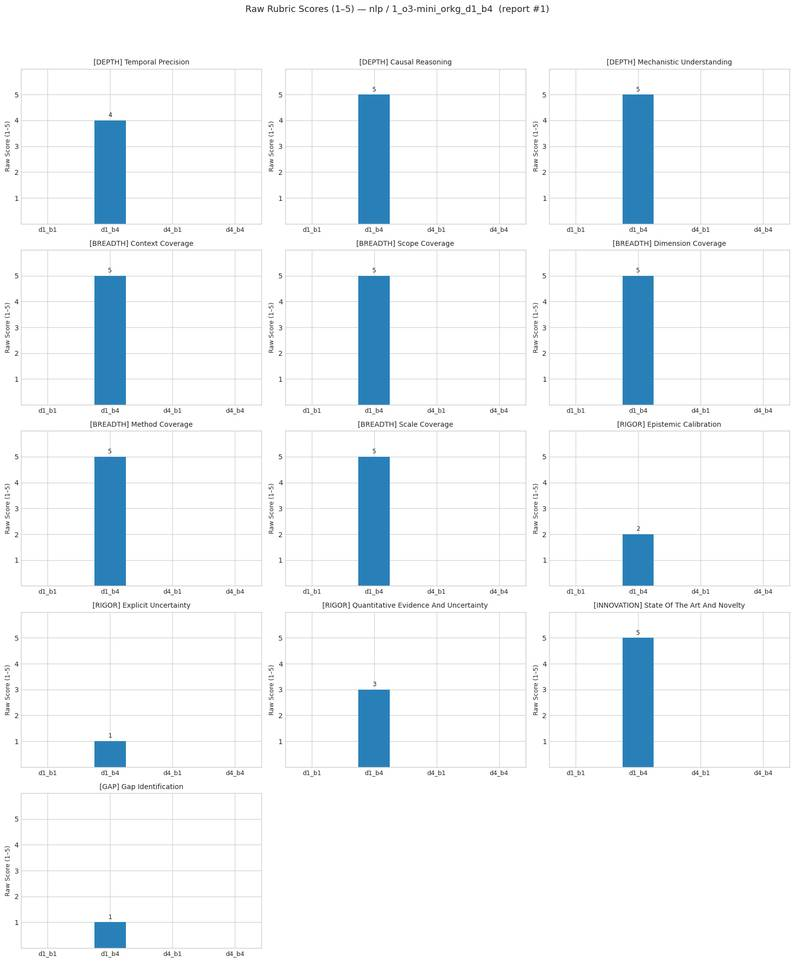

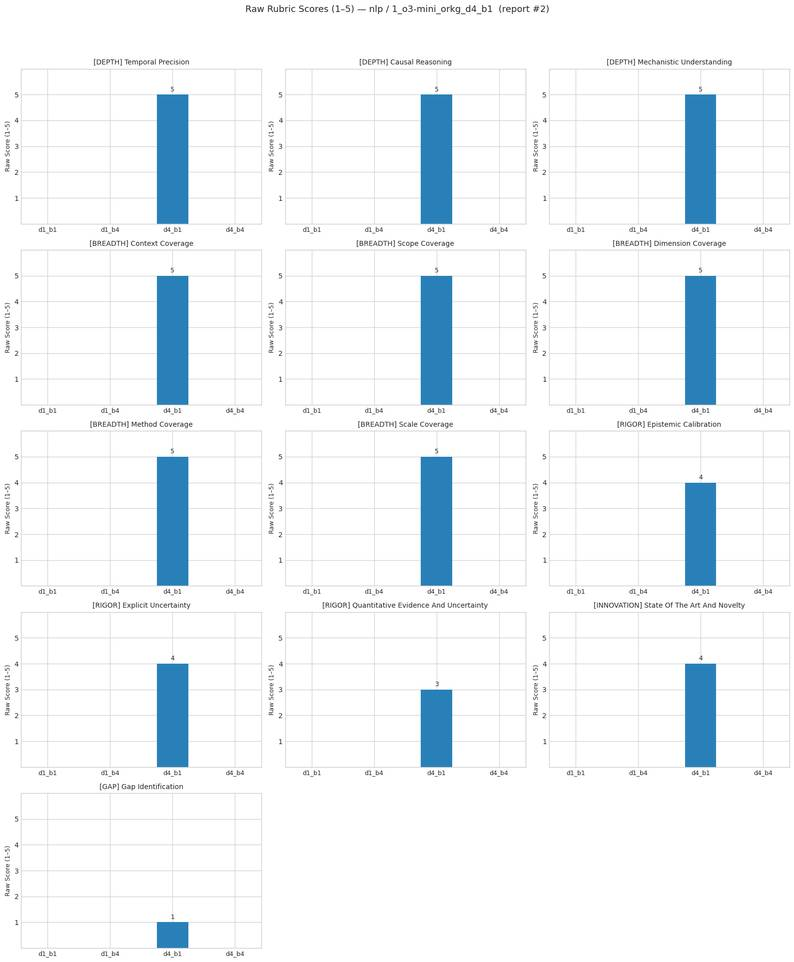

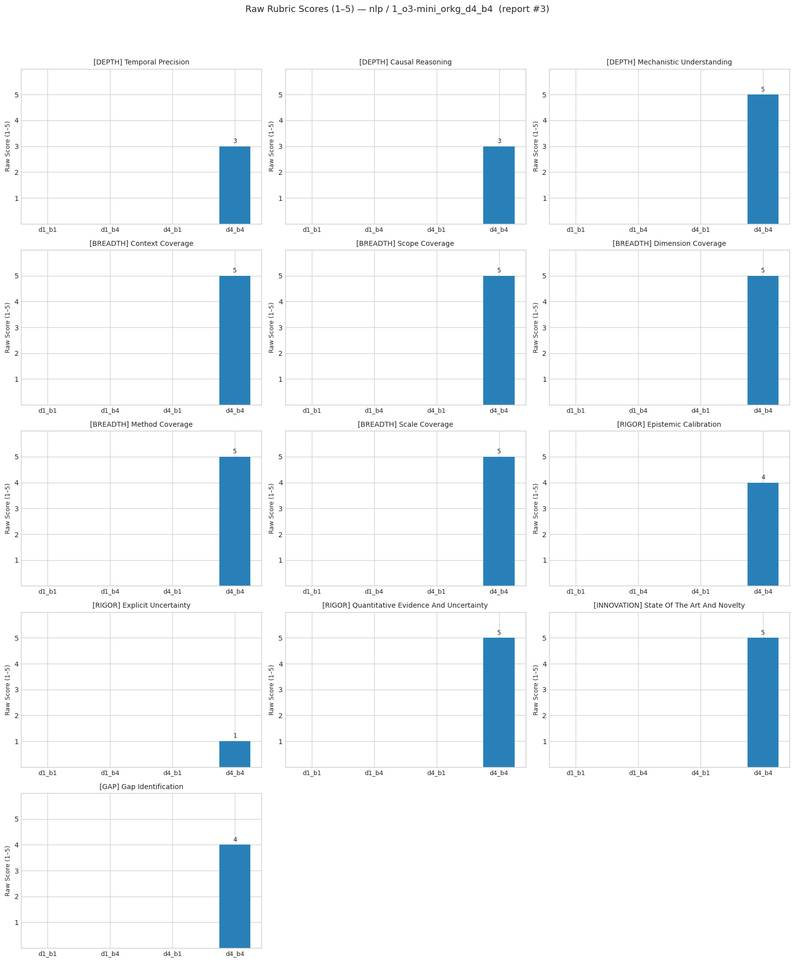

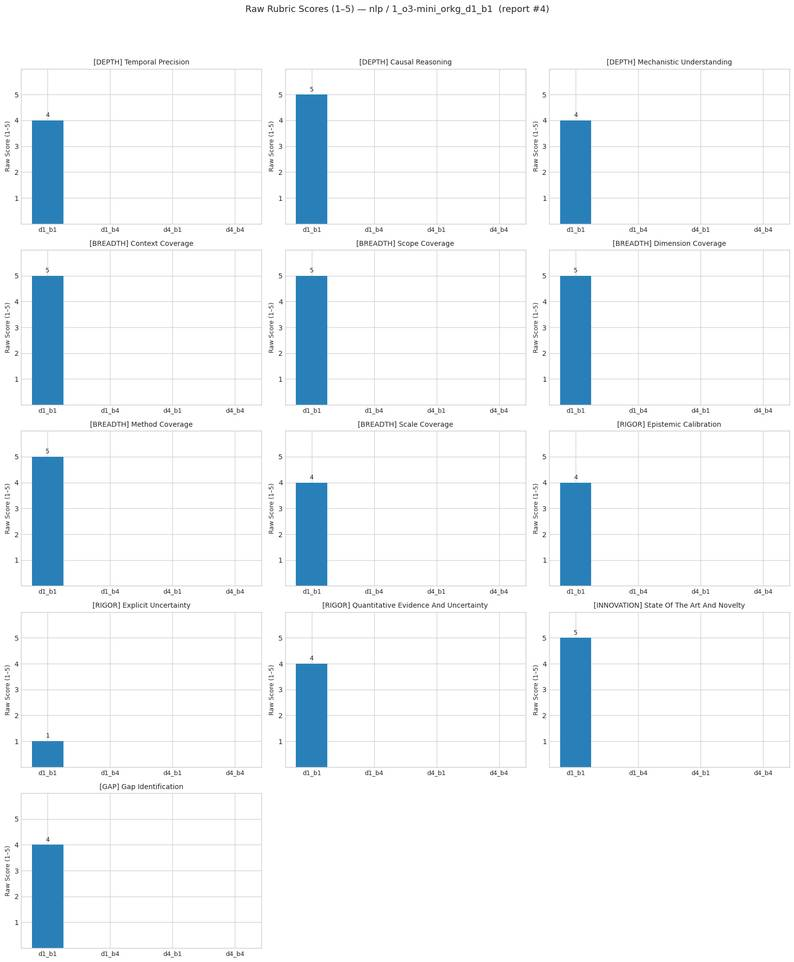

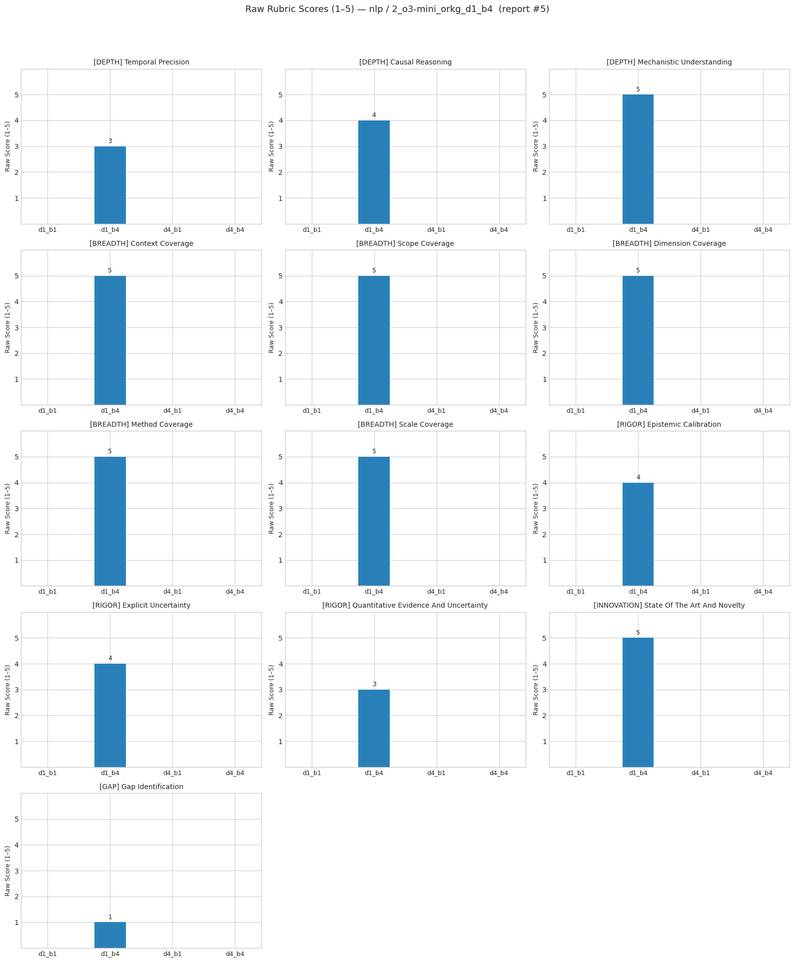

...

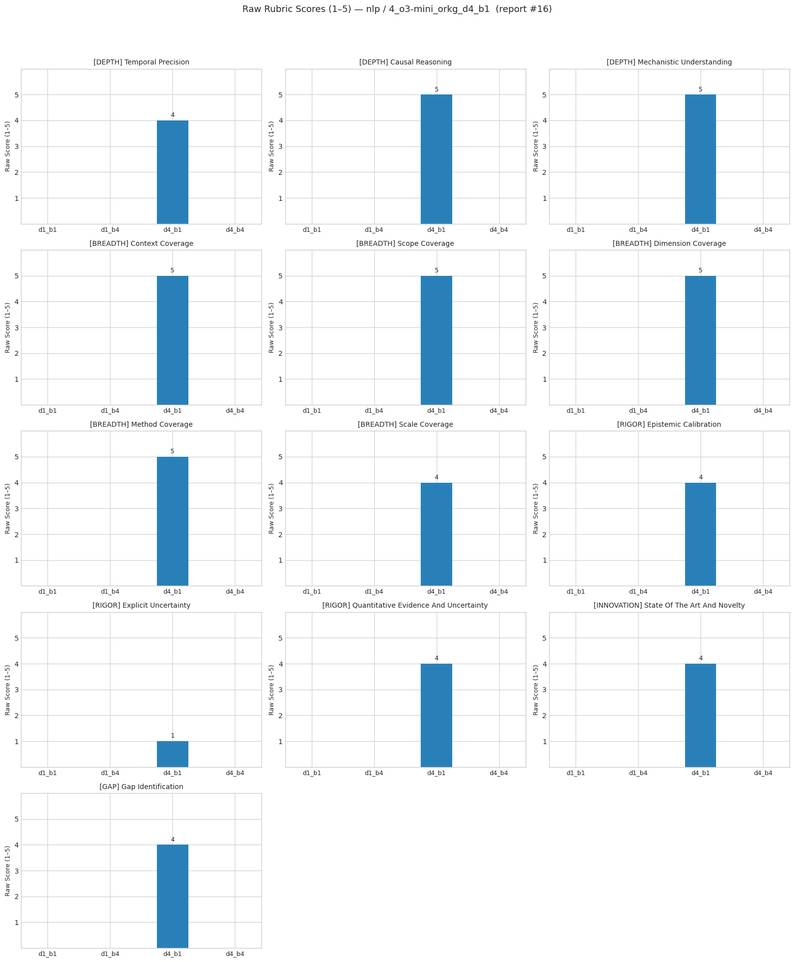

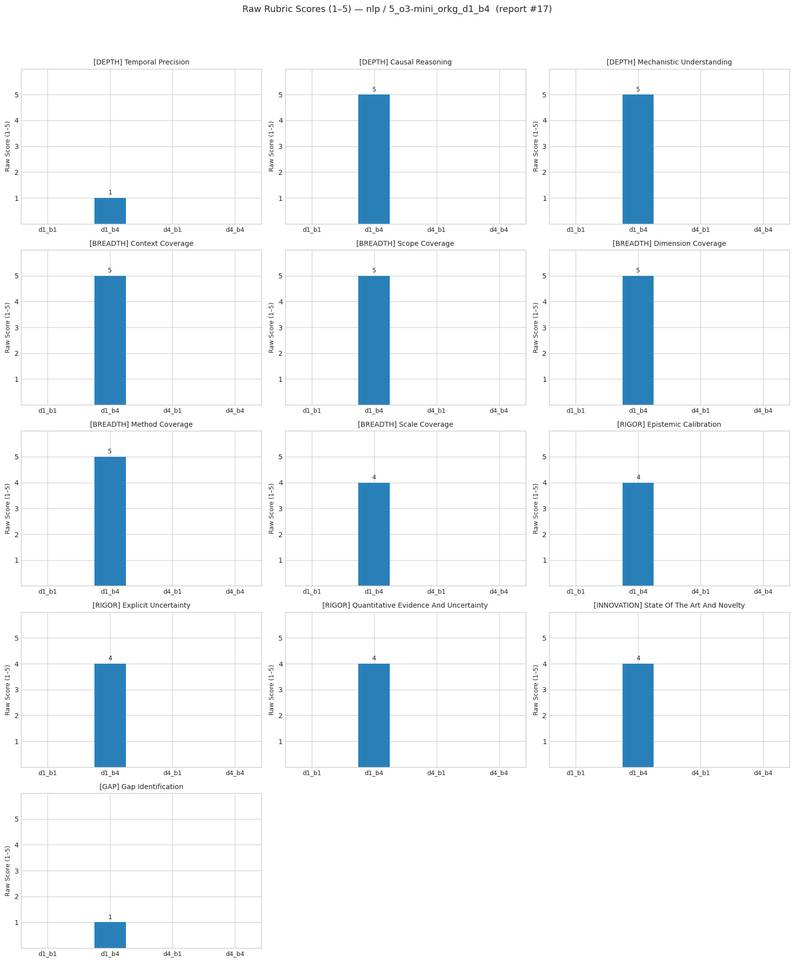

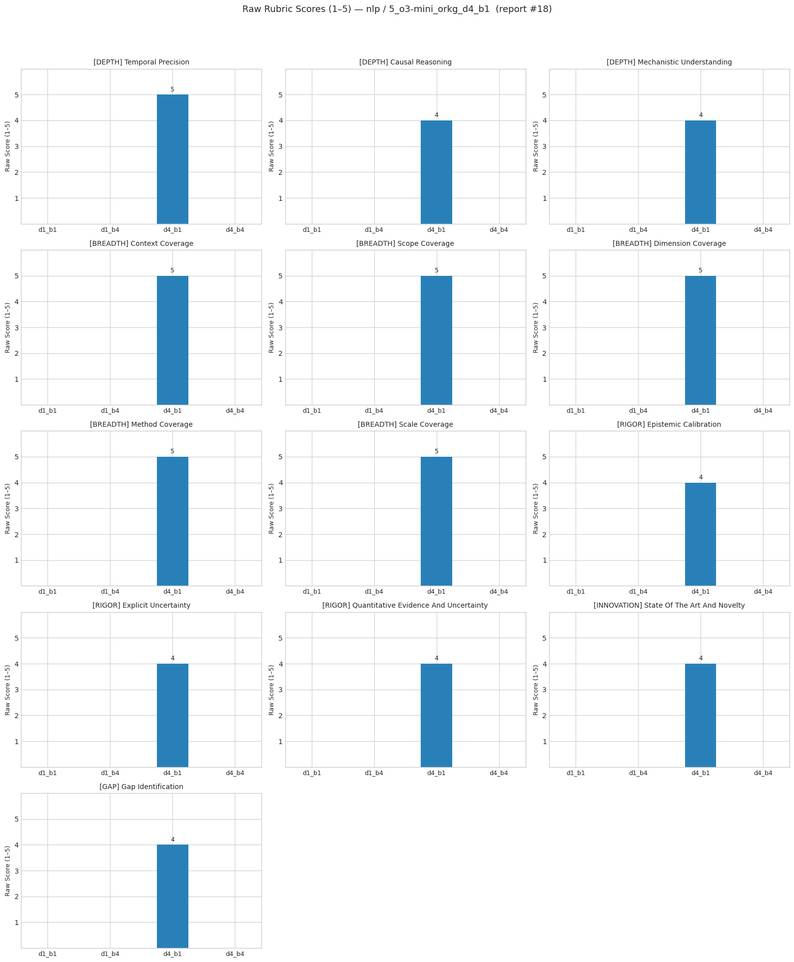

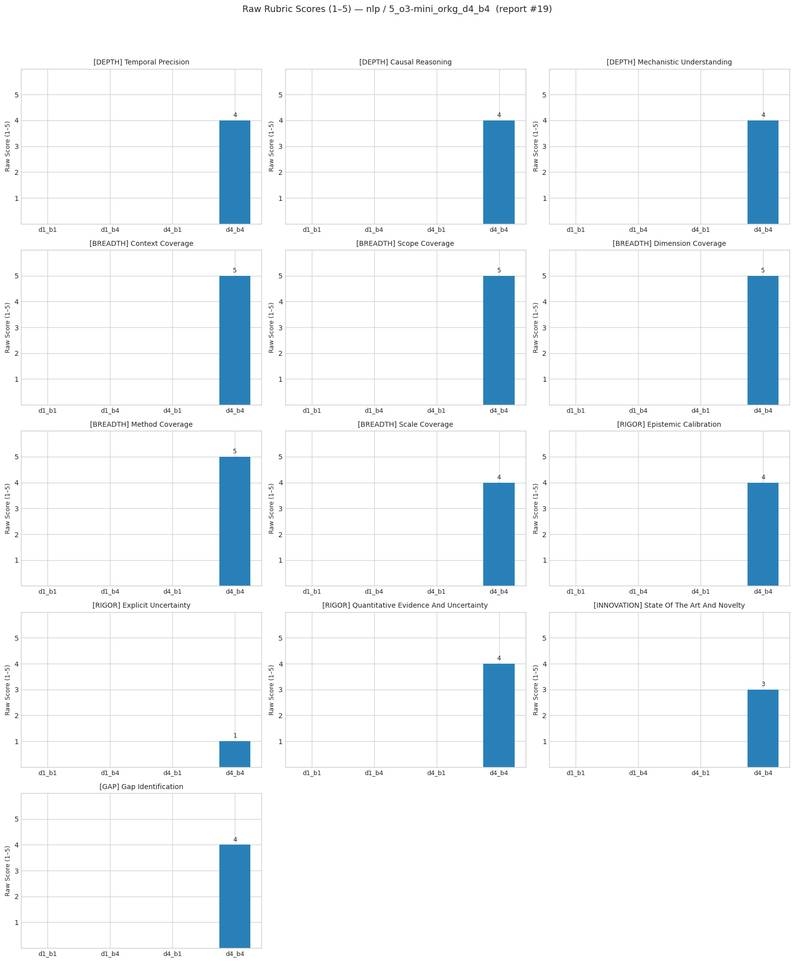

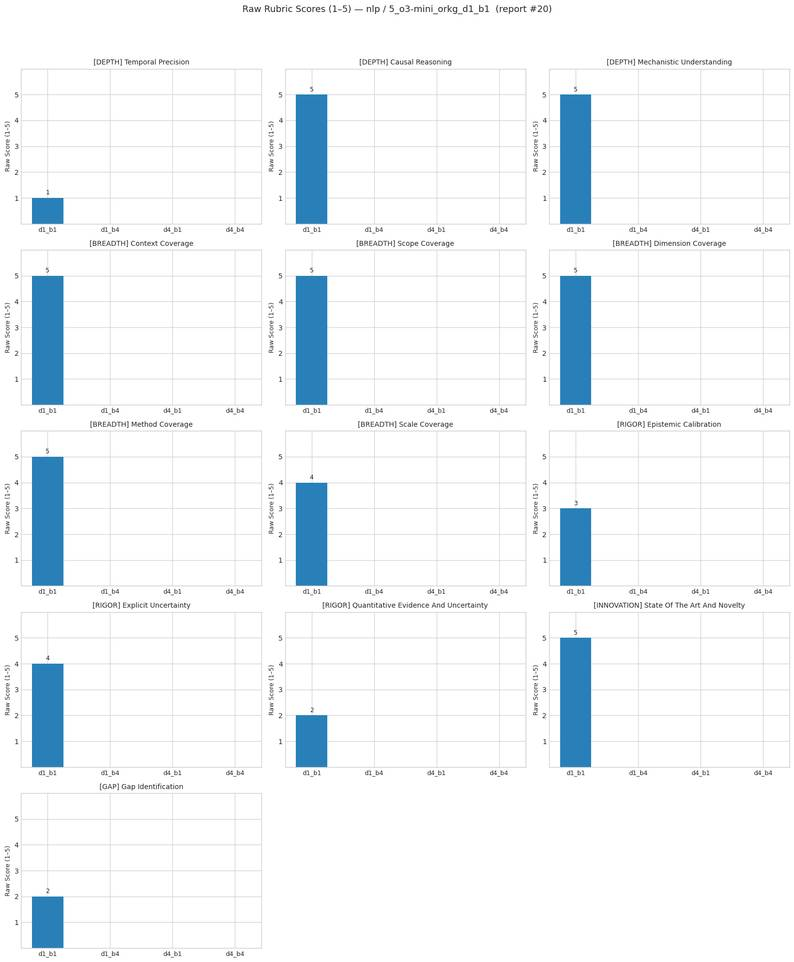

  … 20/196 reports plotted


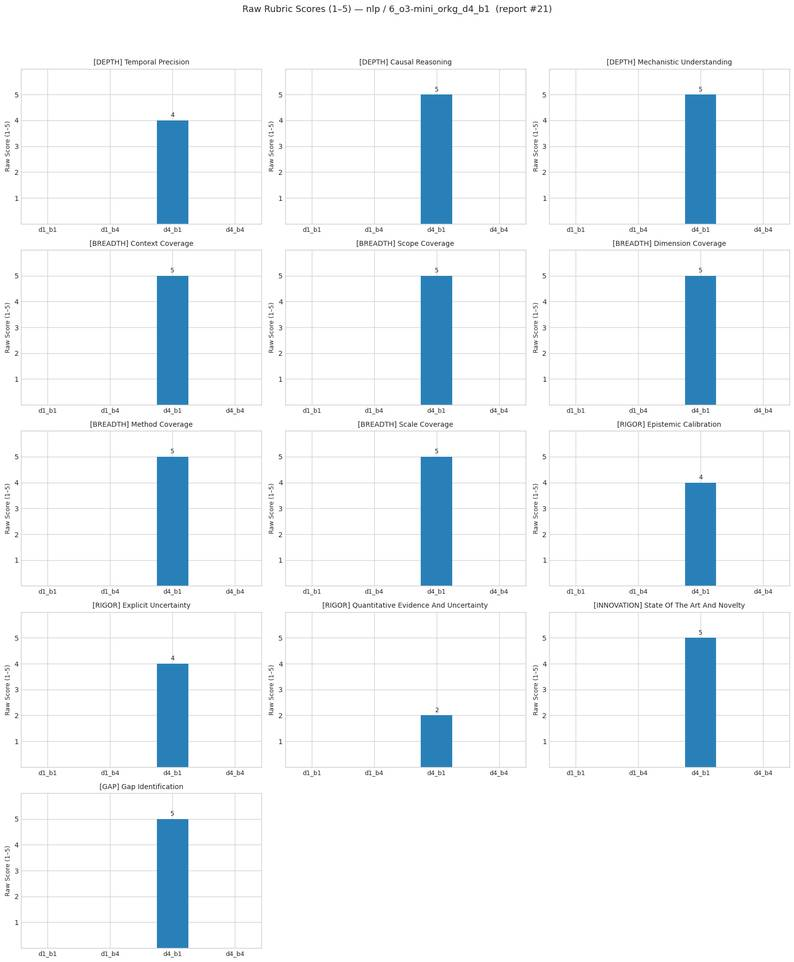

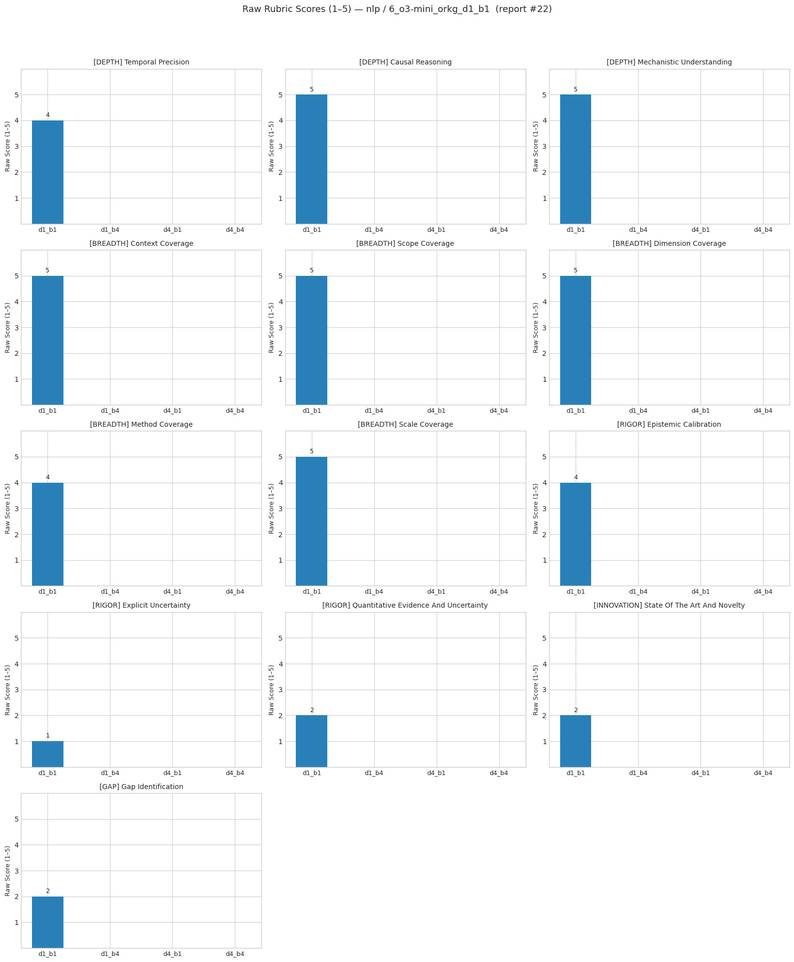

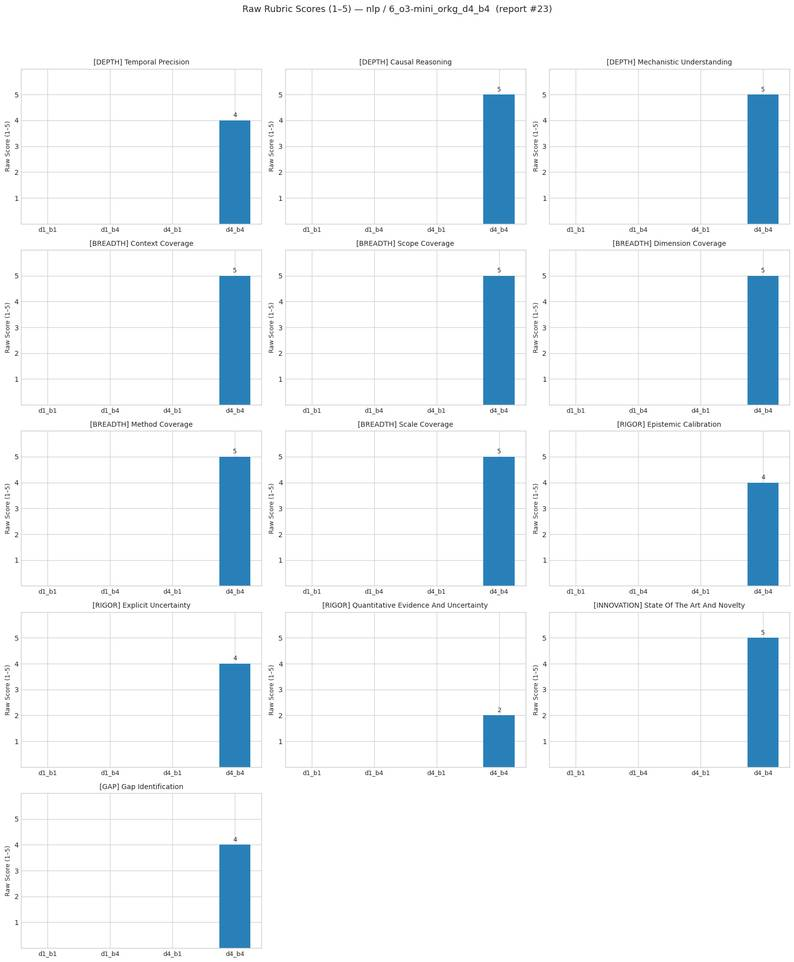

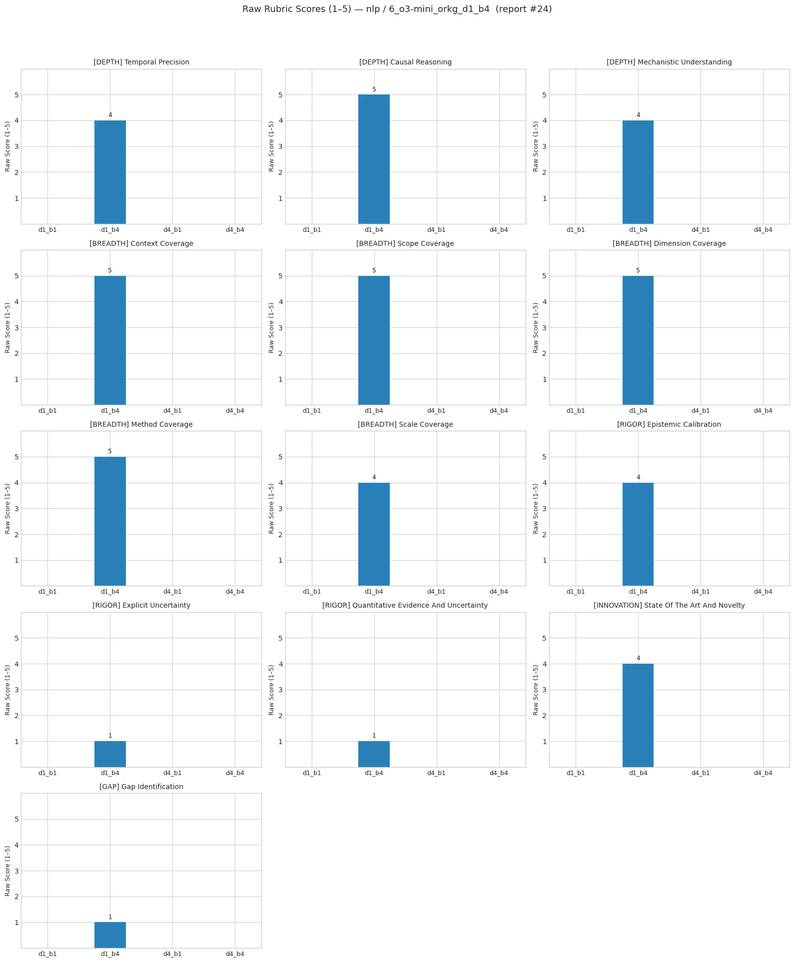

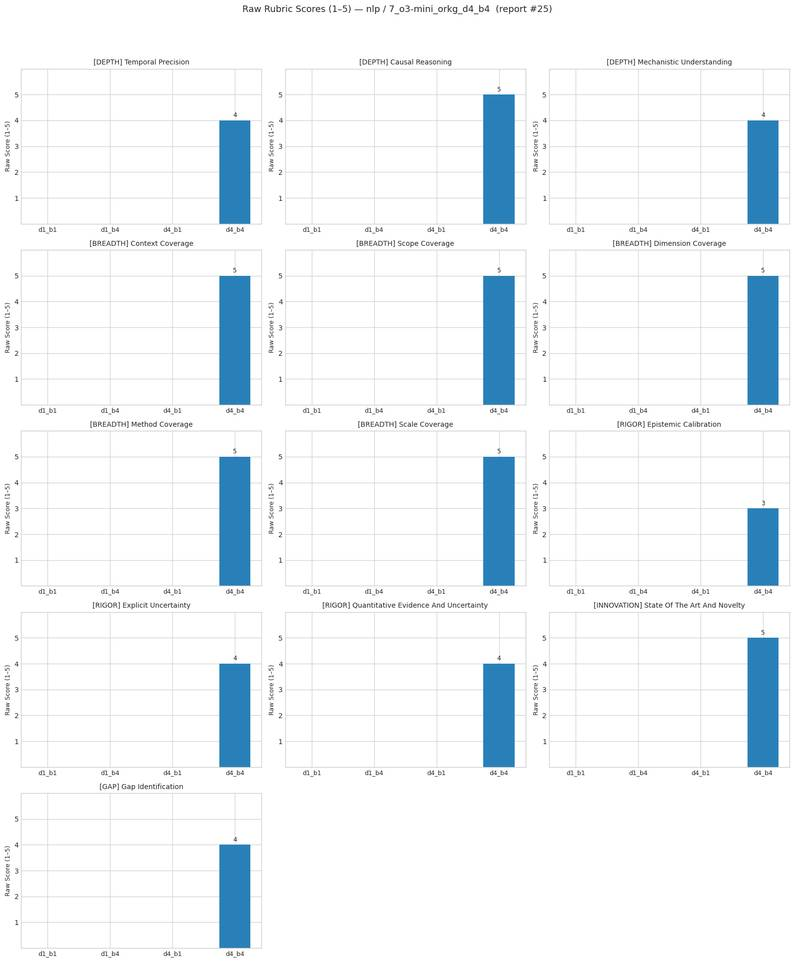

...

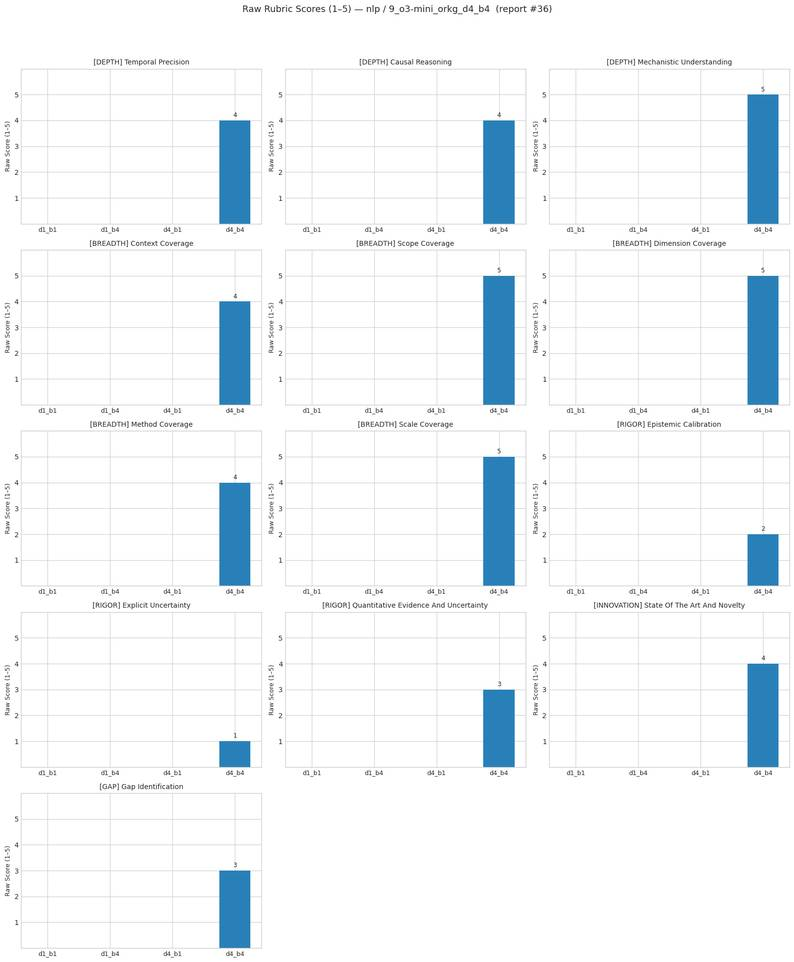

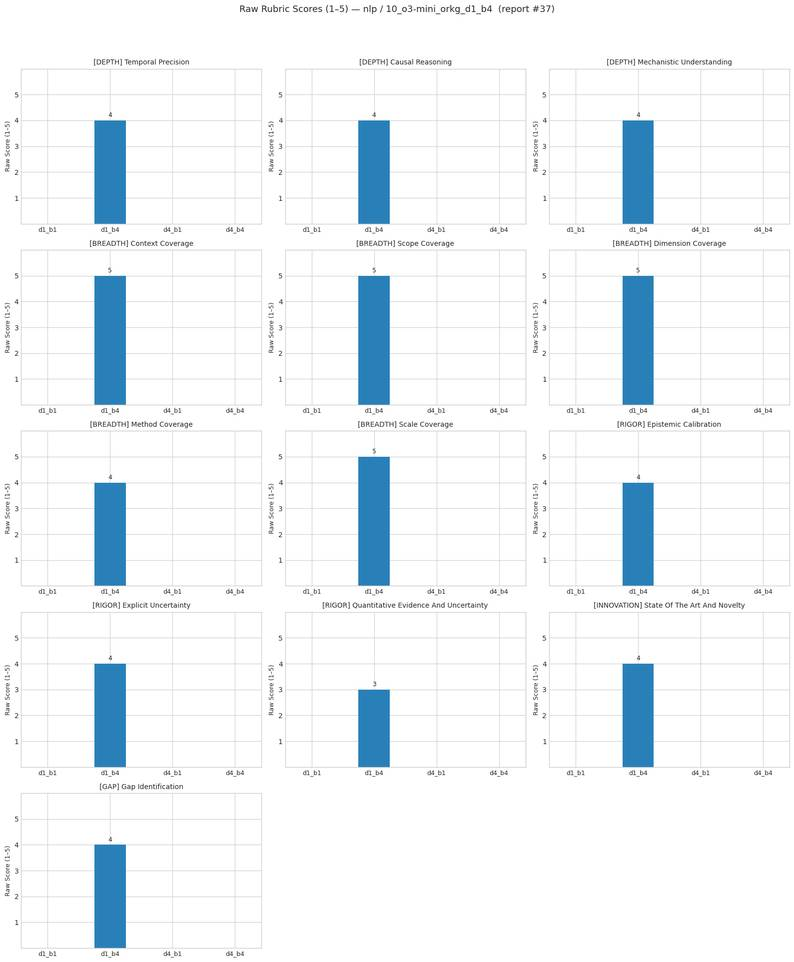

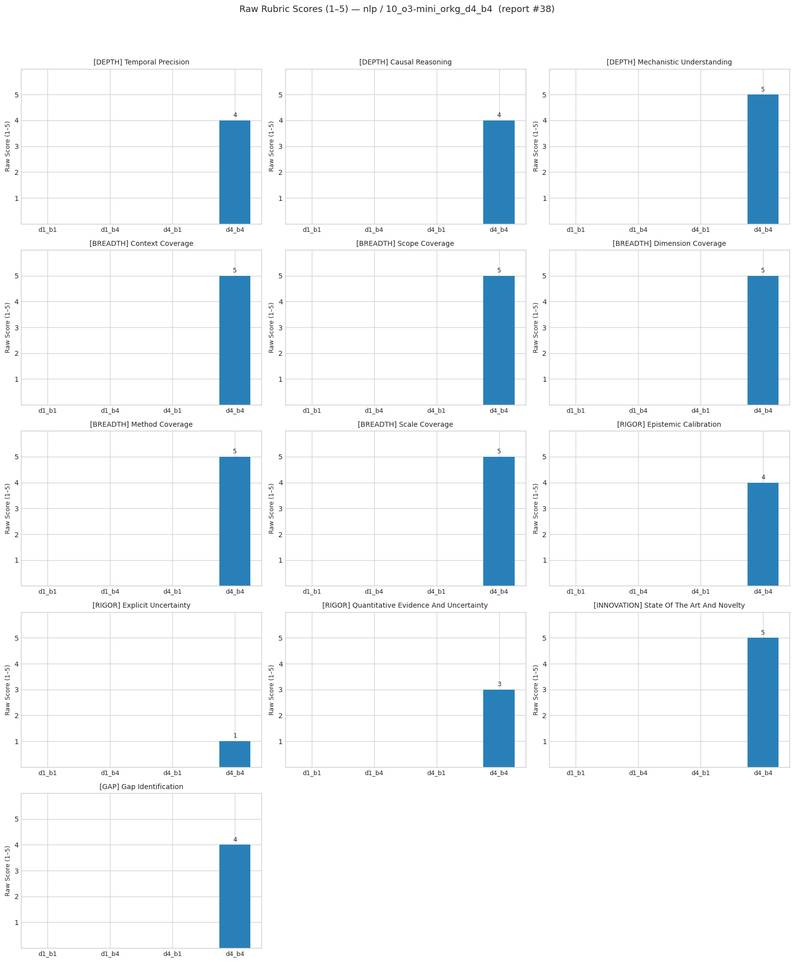

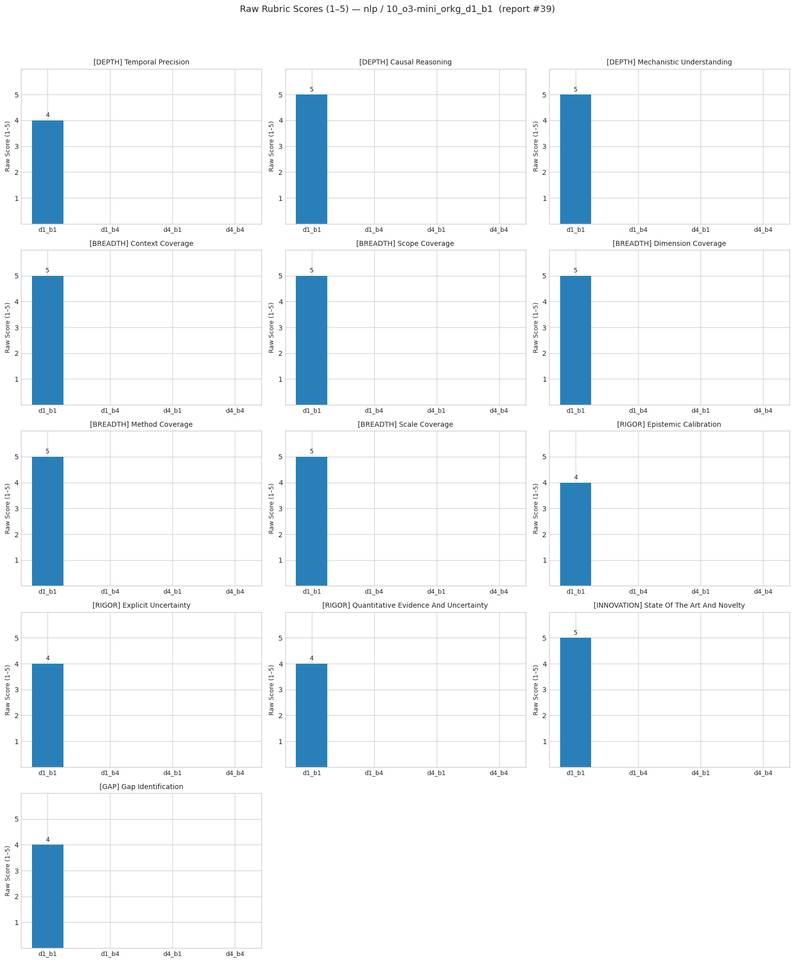

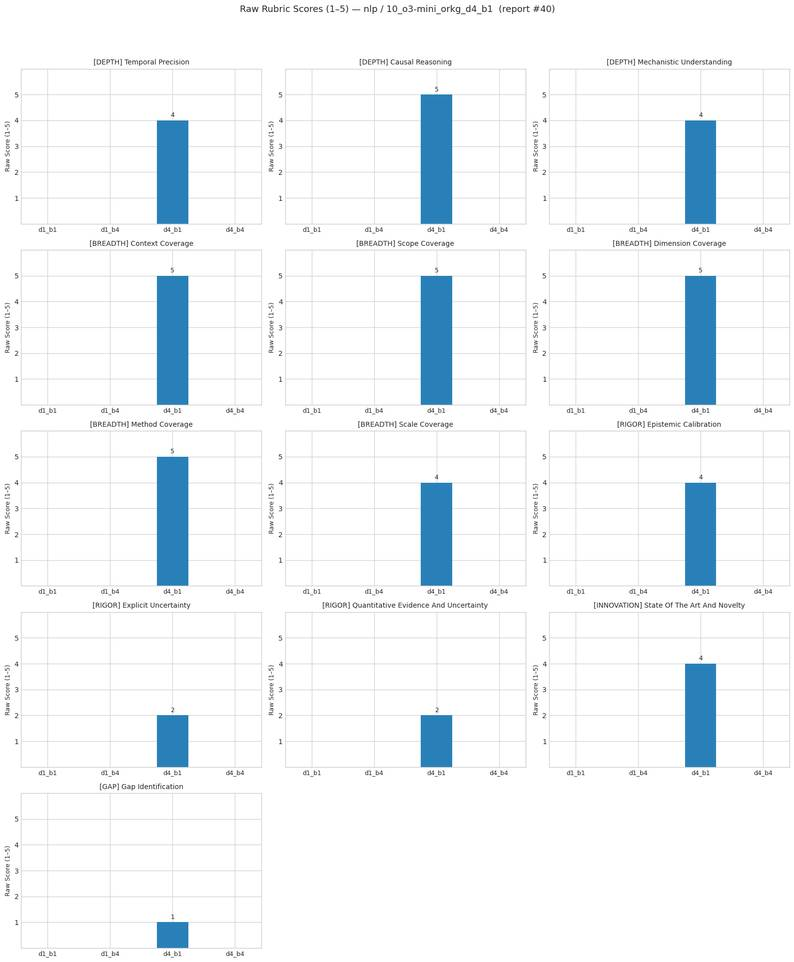

  … 40/196 reports plotted


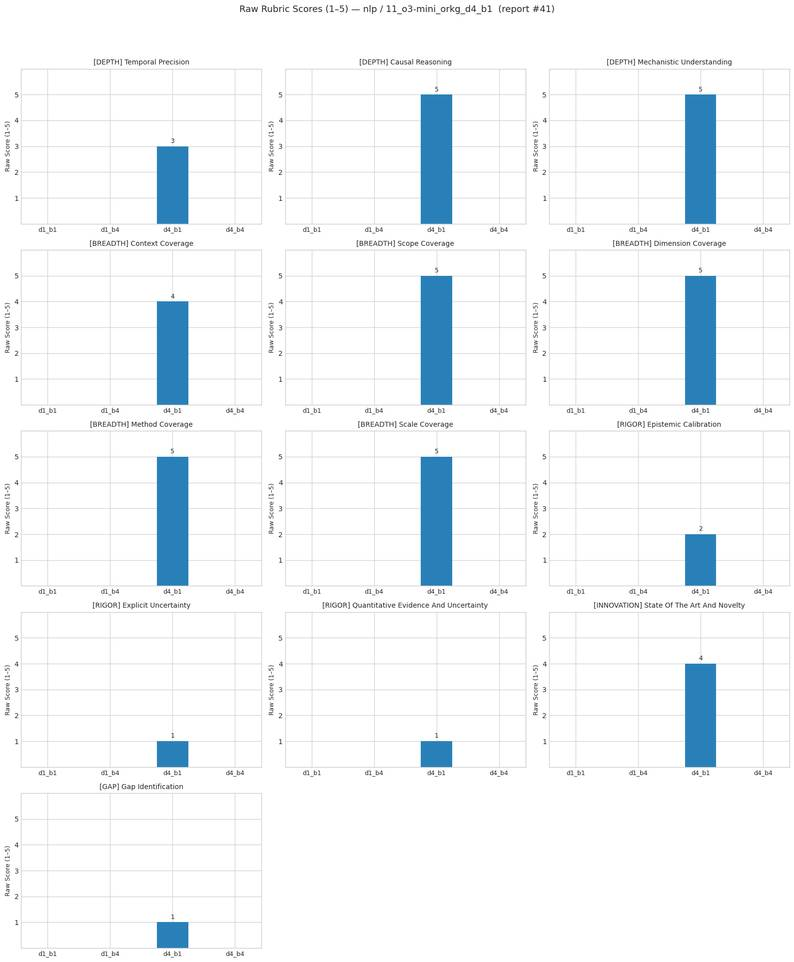

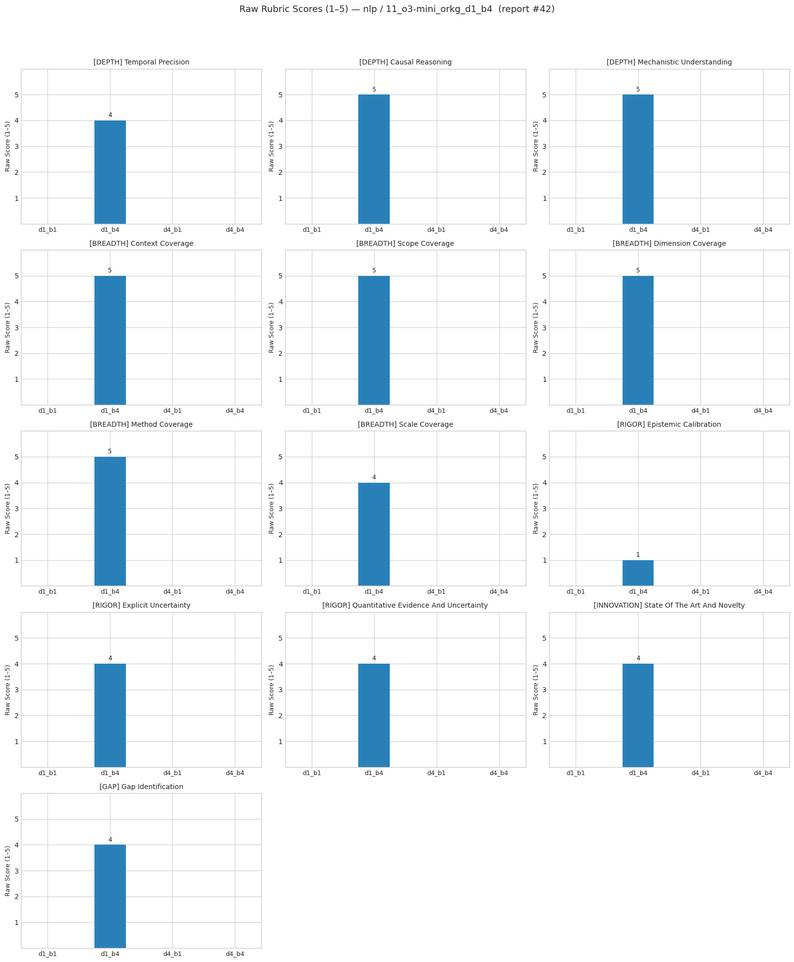

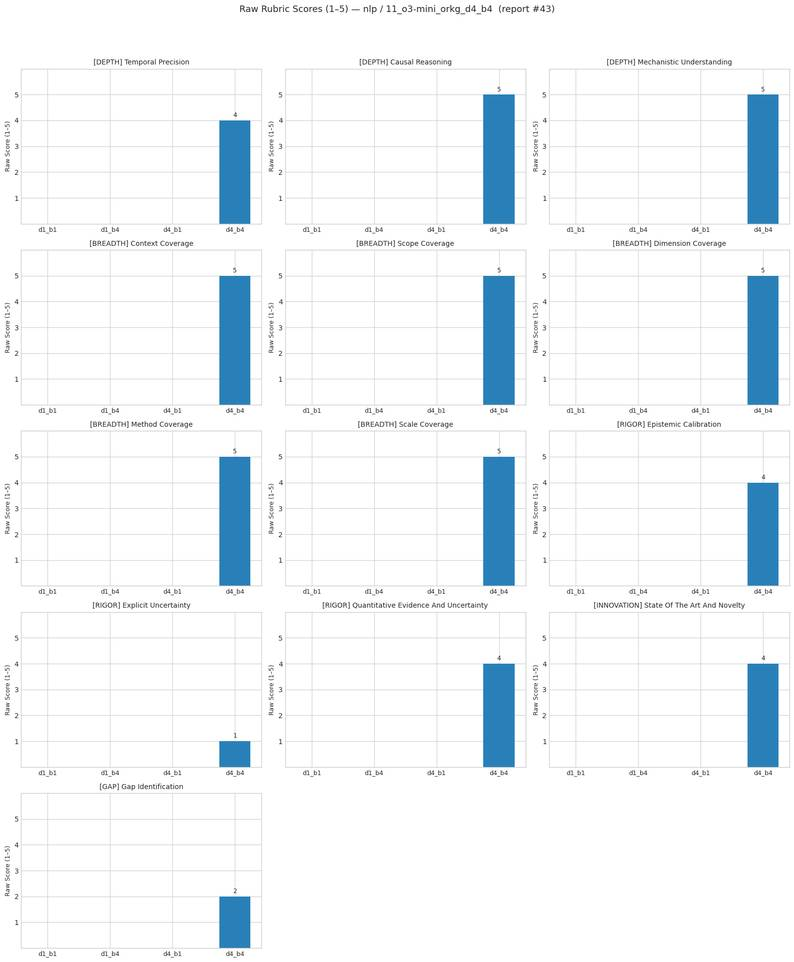

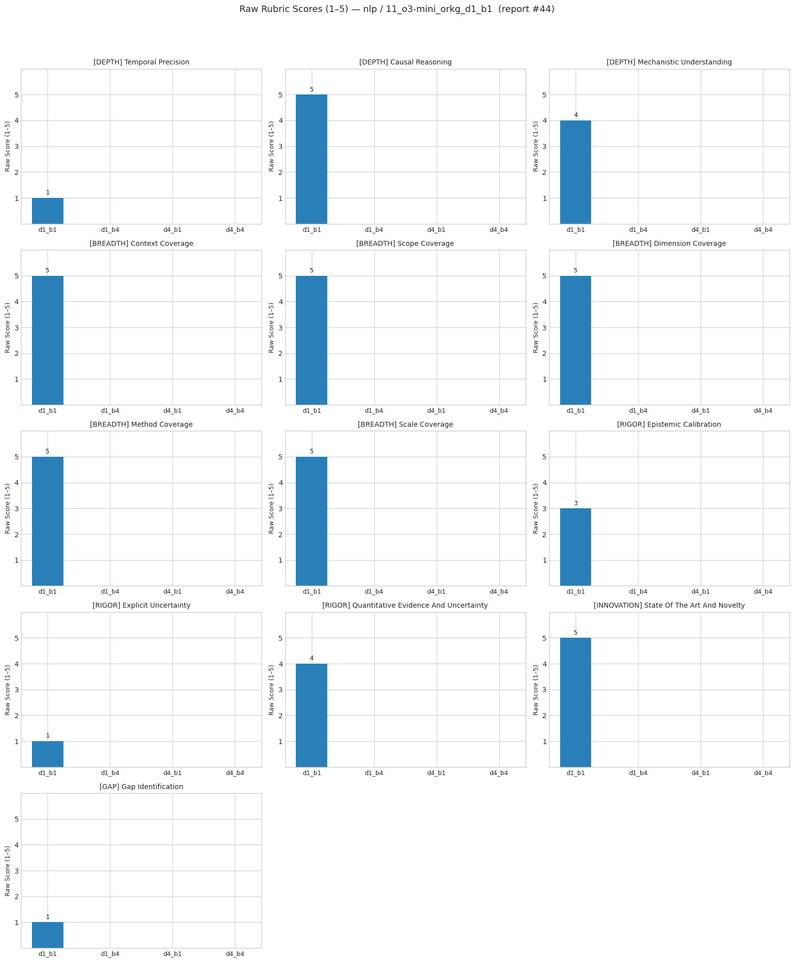

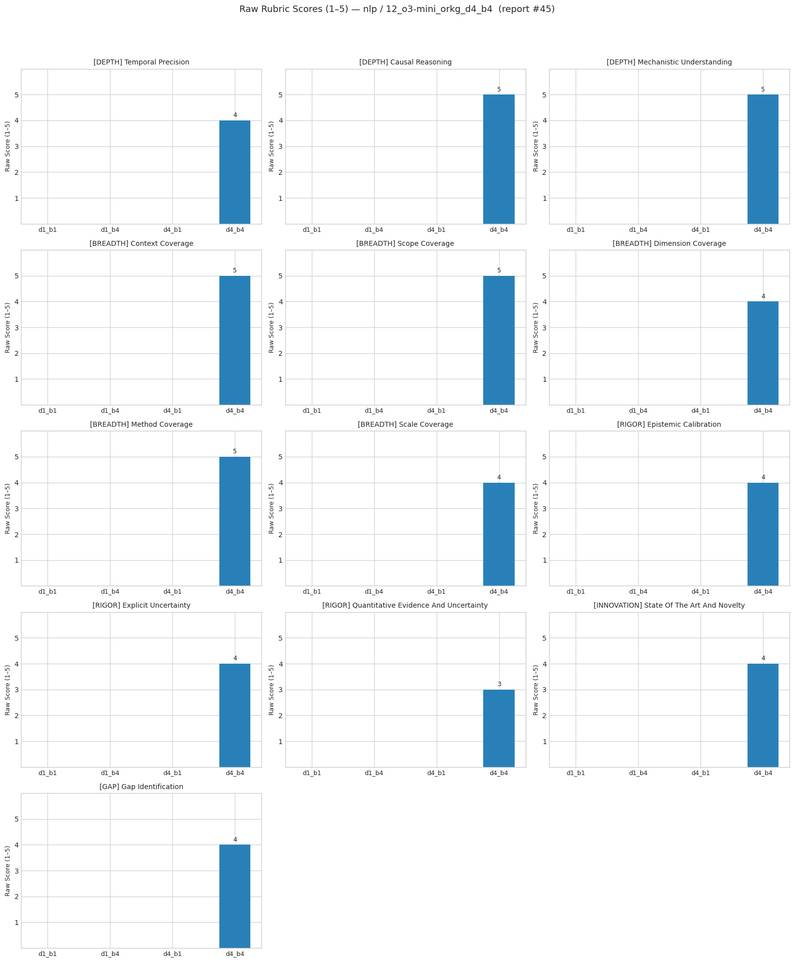

...

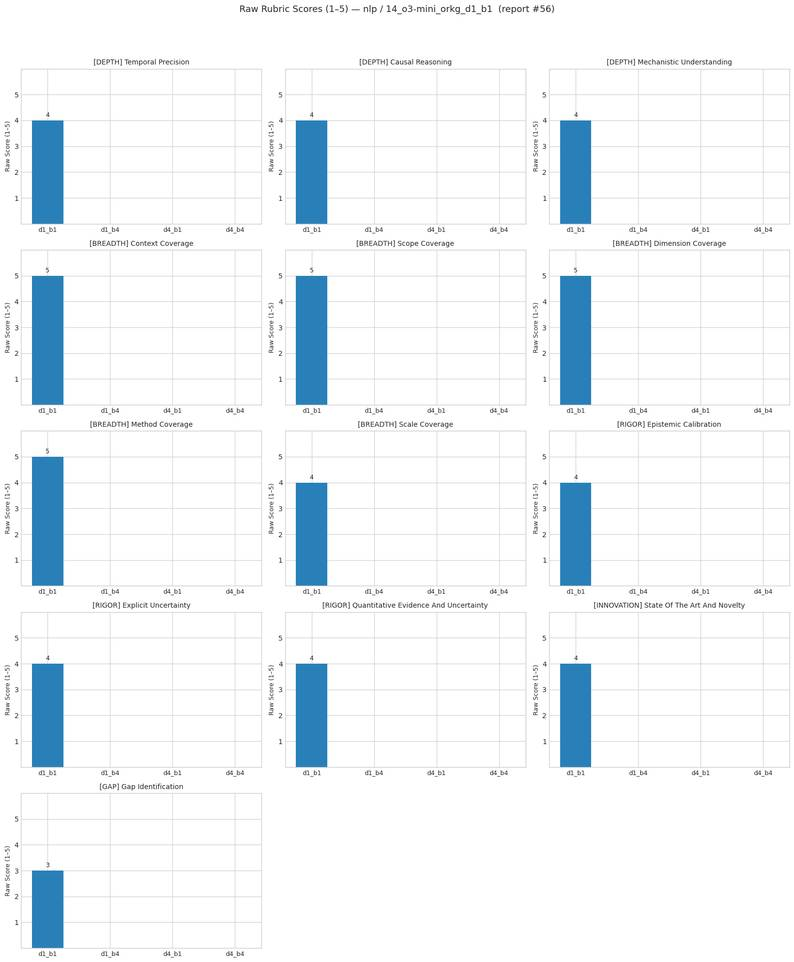

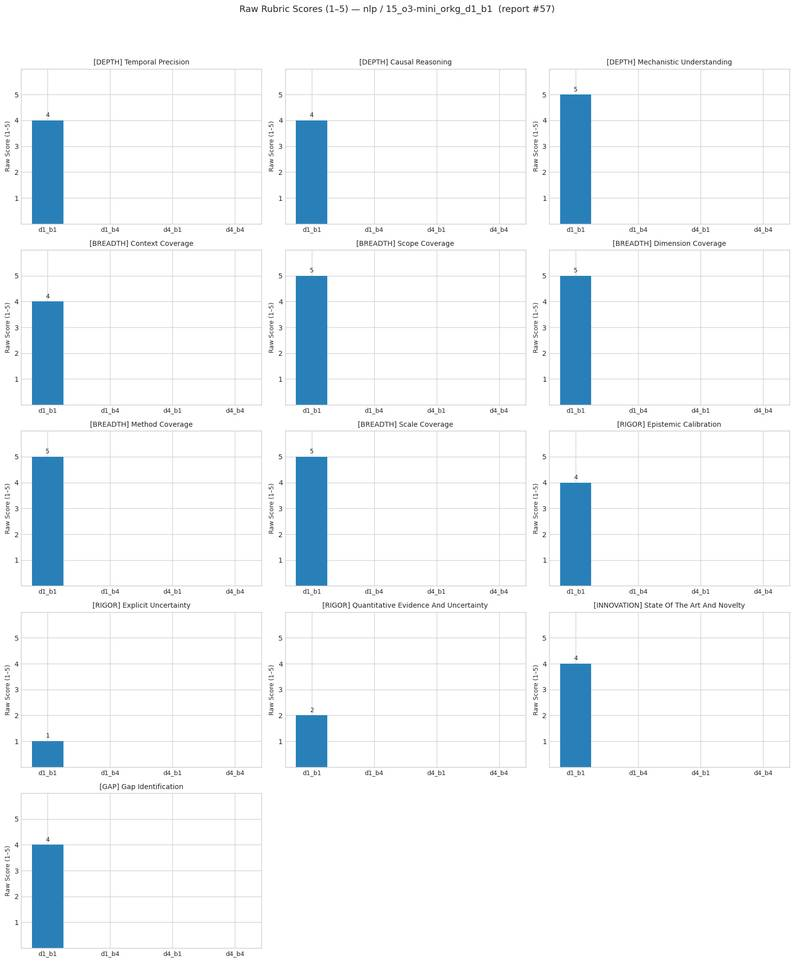

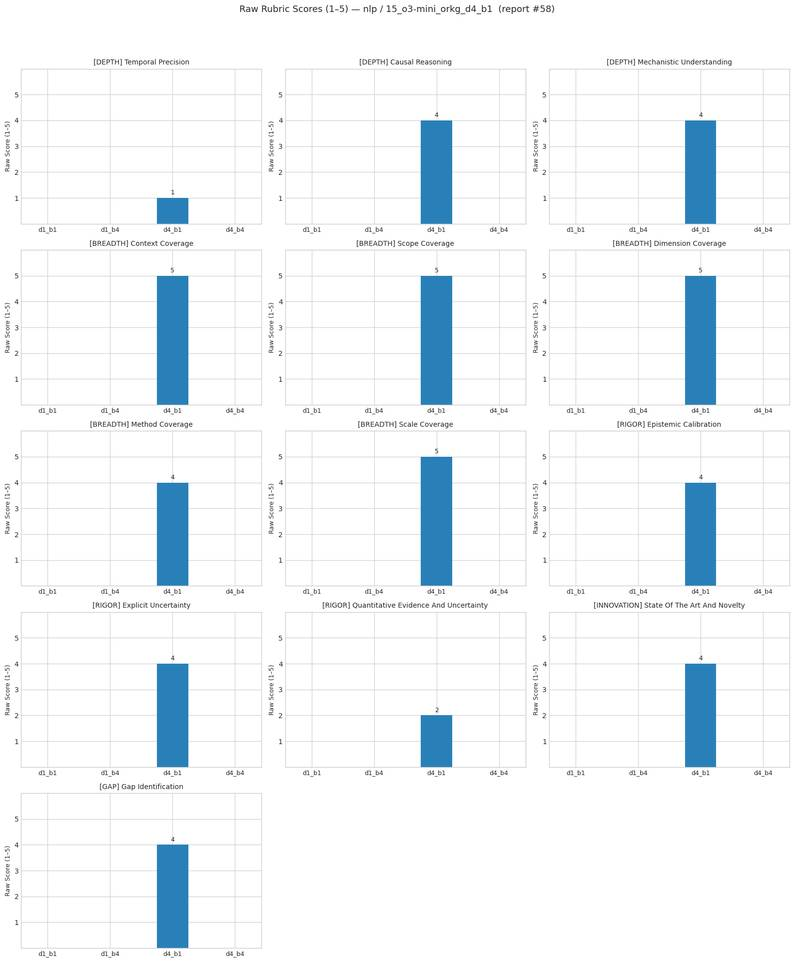

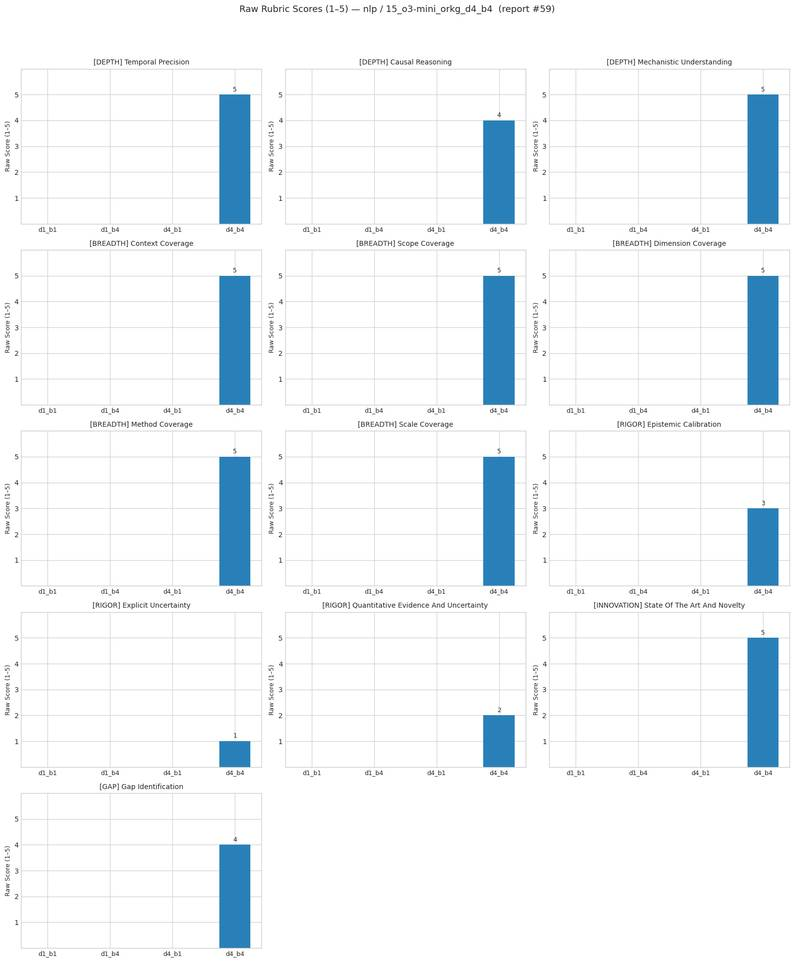

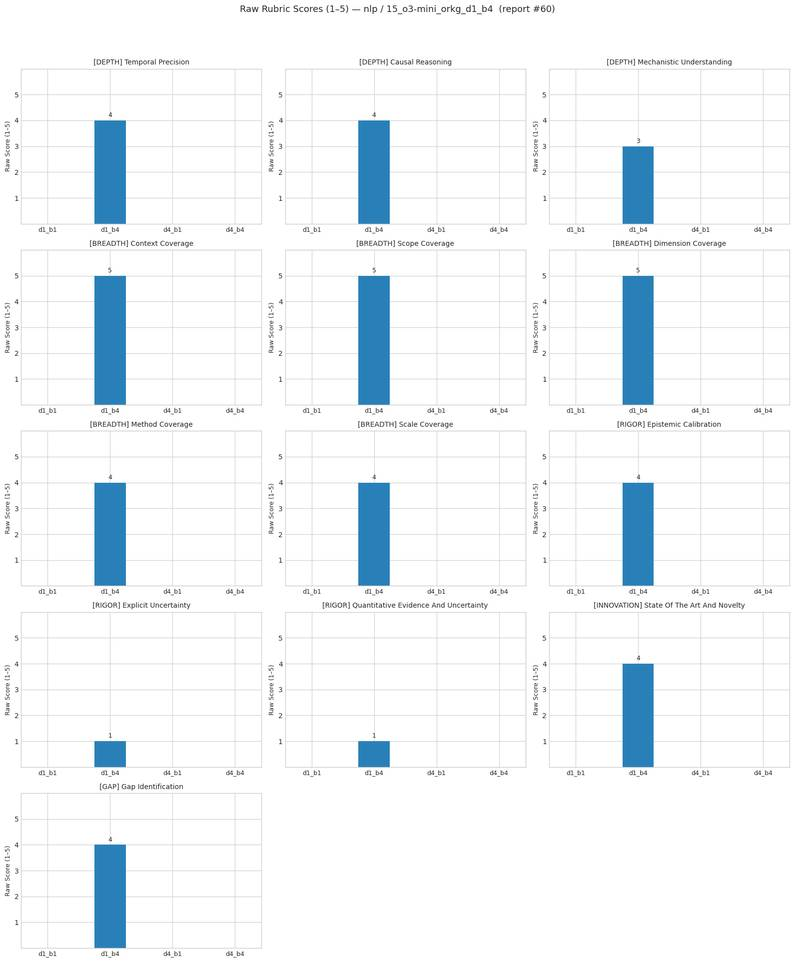

  … 60/196 reports plotted


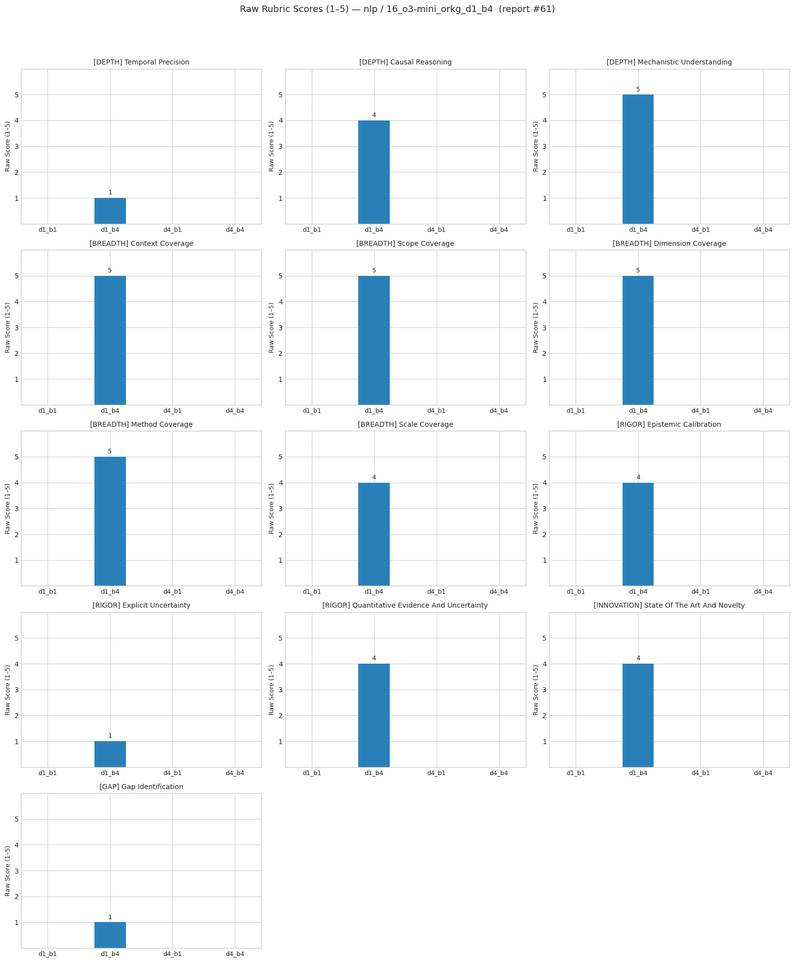

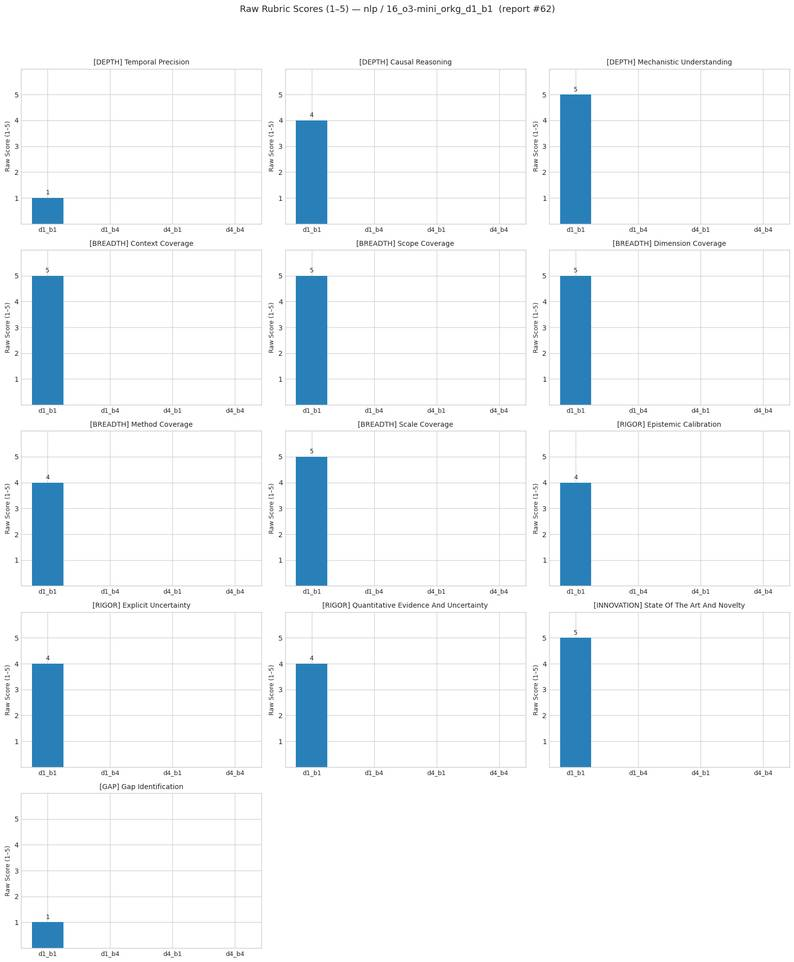

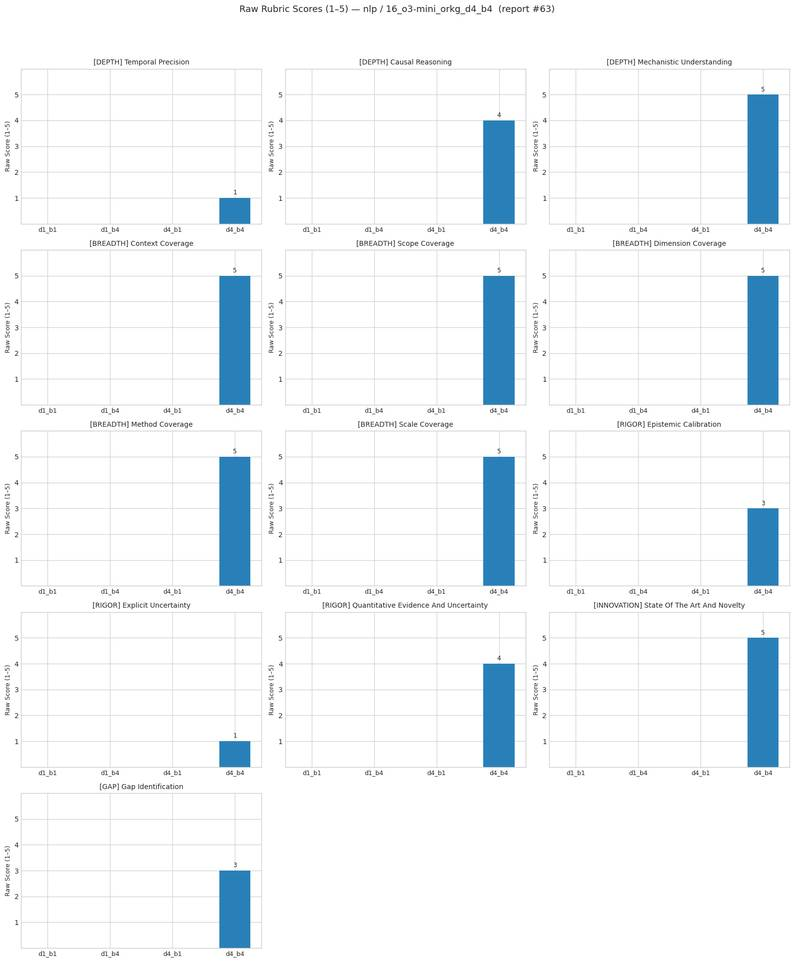

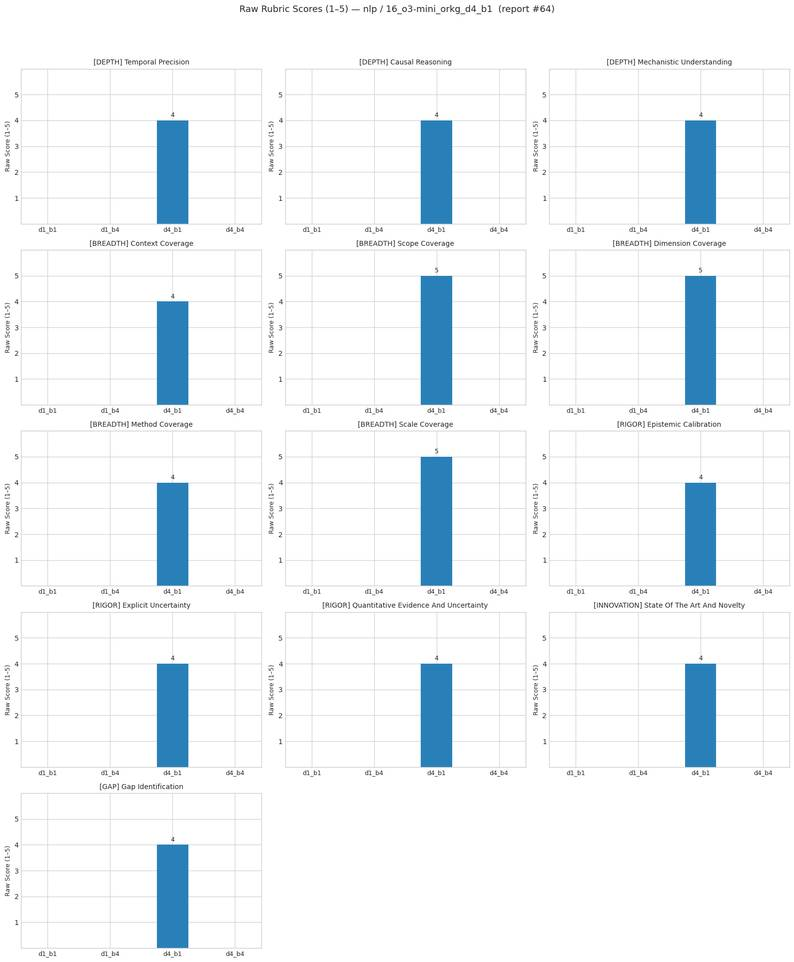

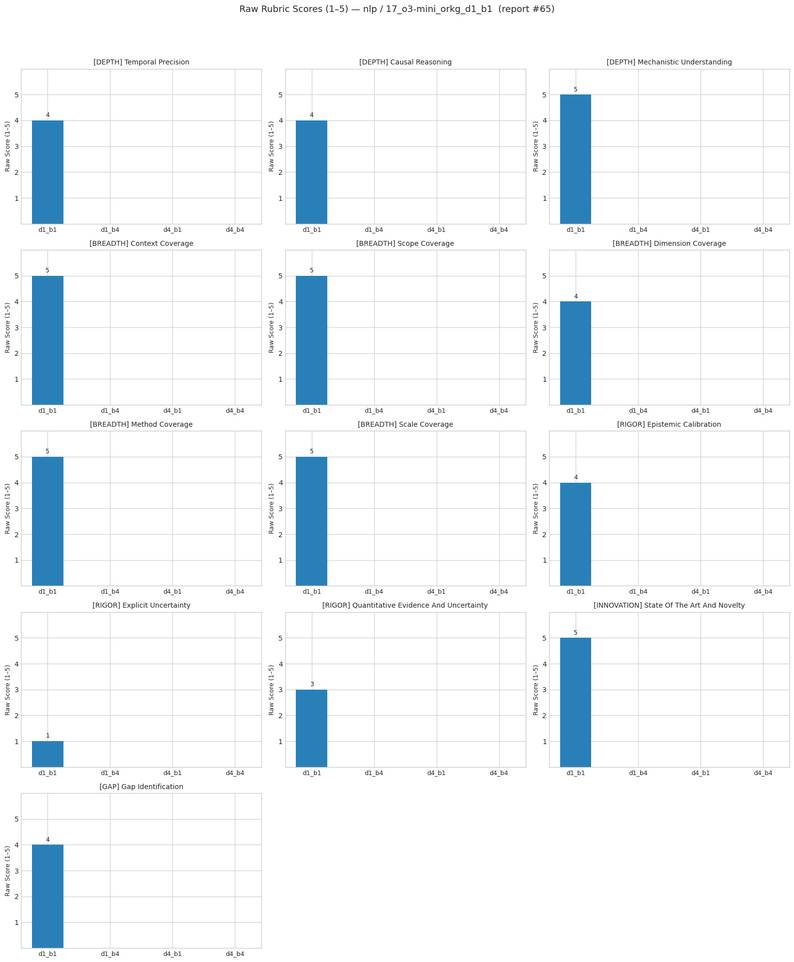

...

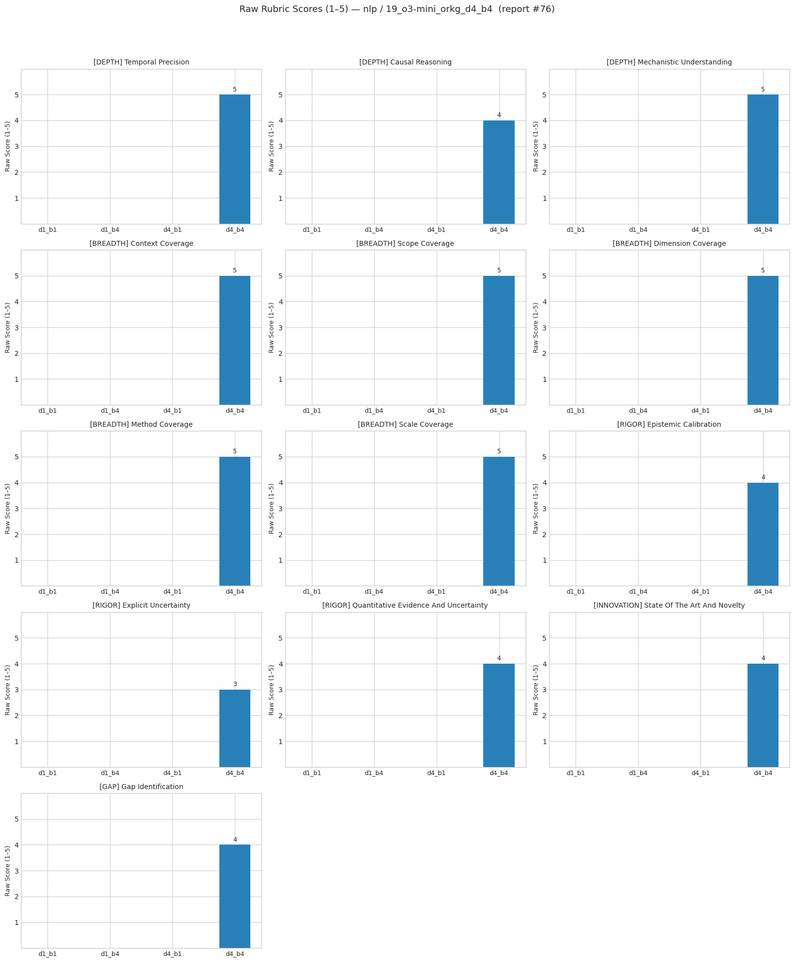

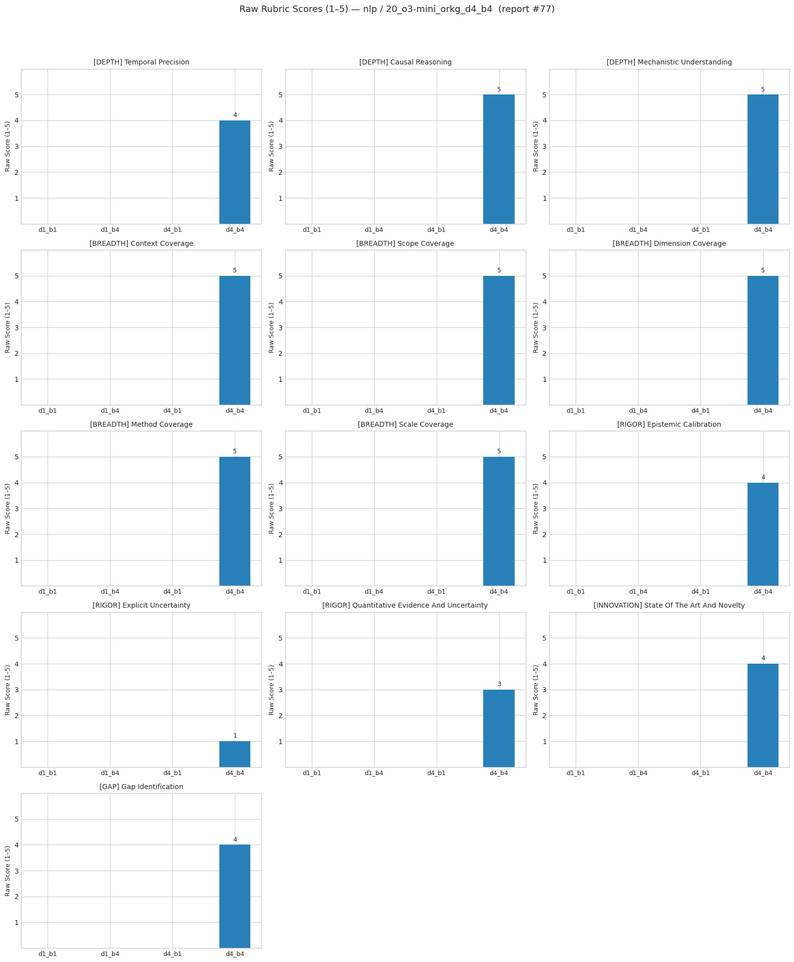

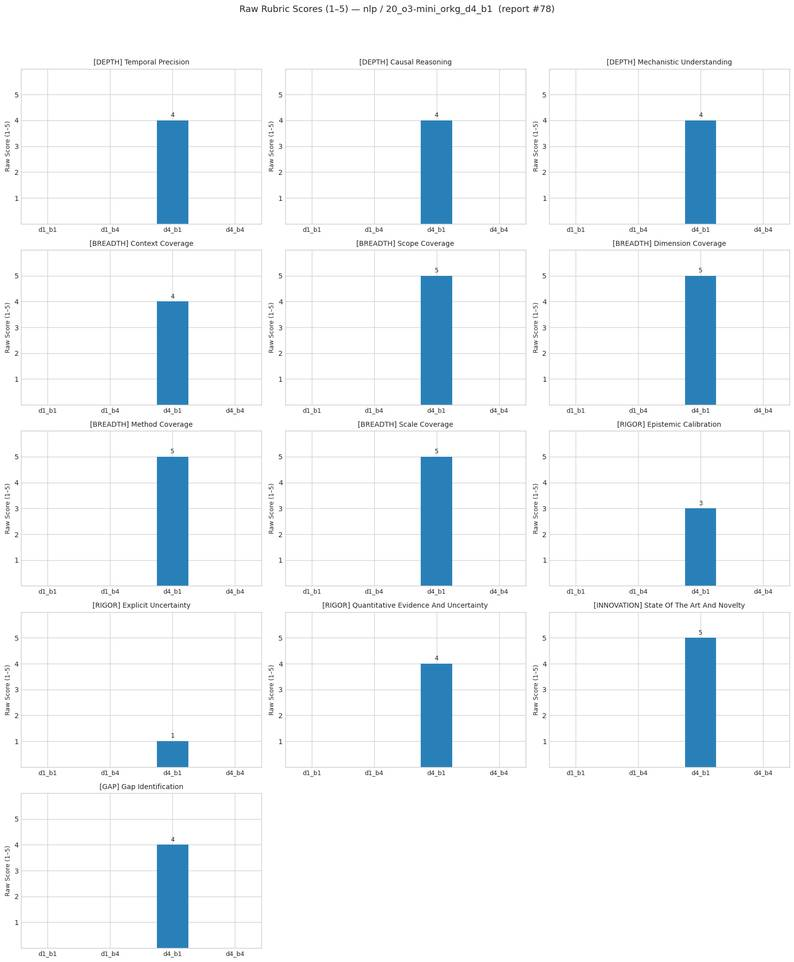

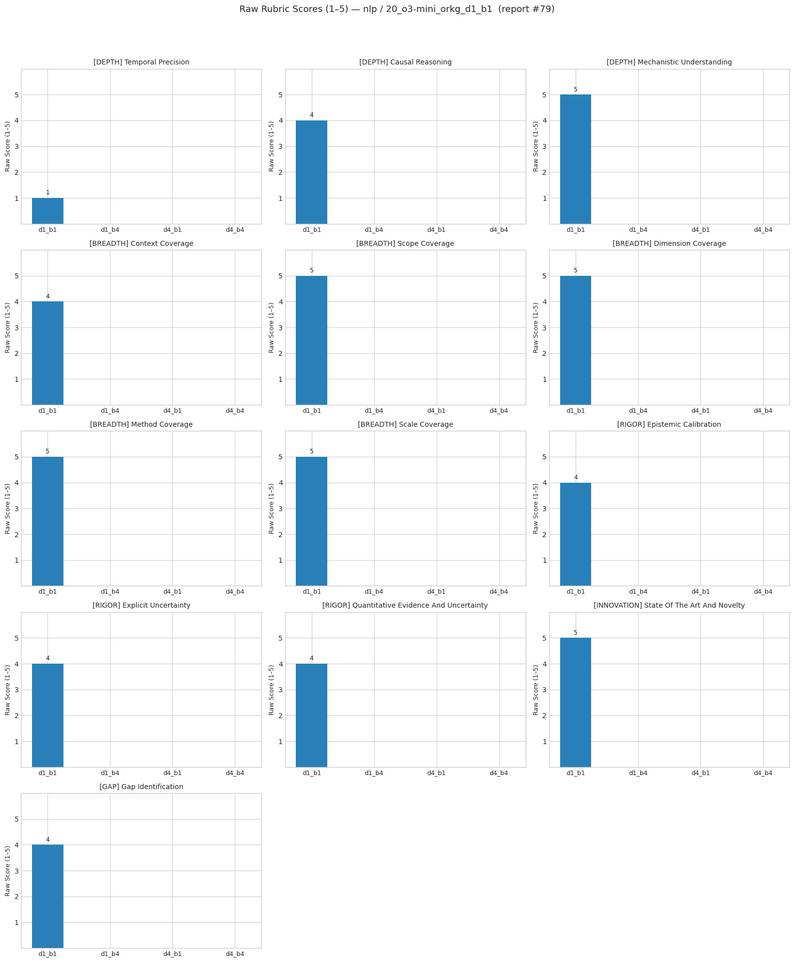

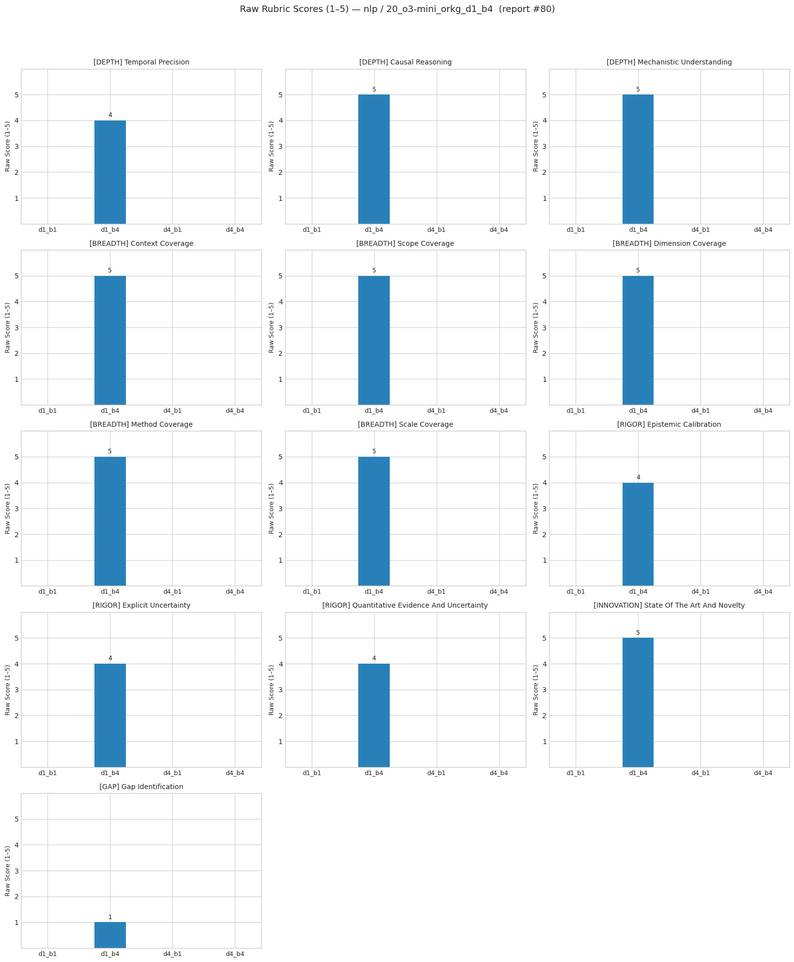

  … 80/196 reports plotted


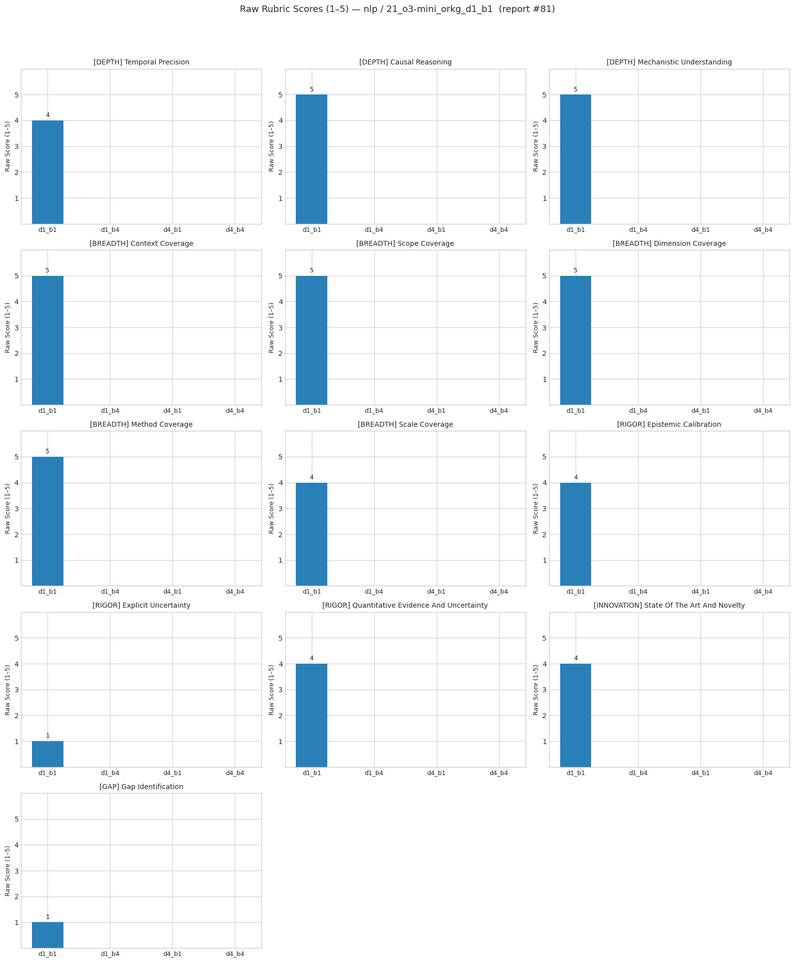

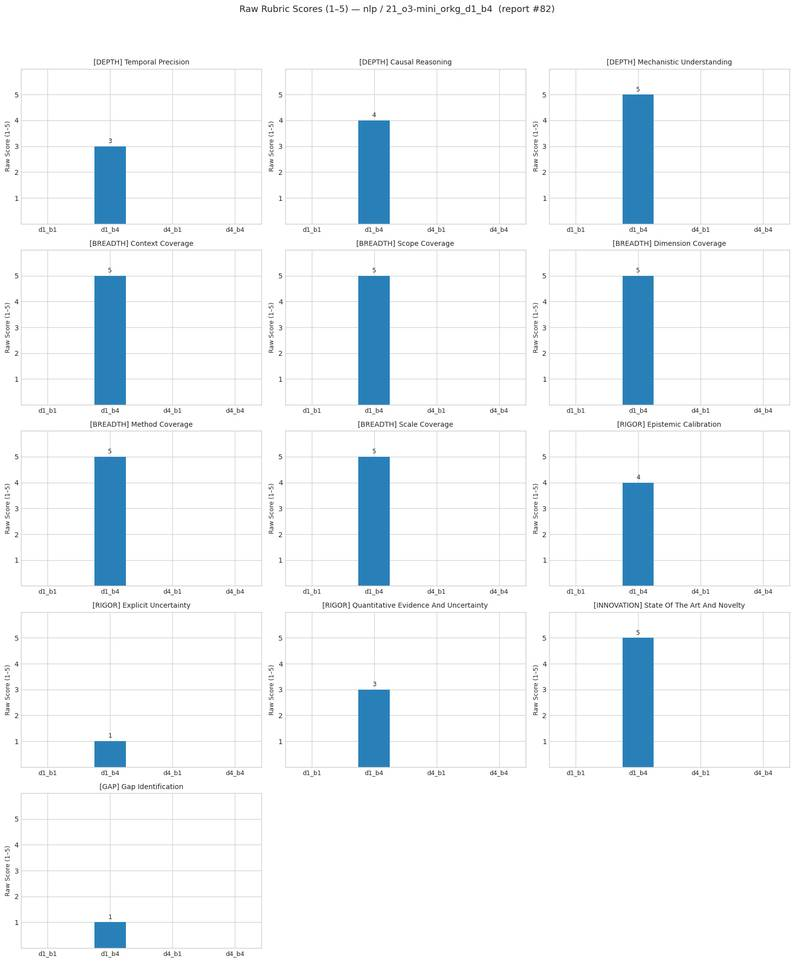

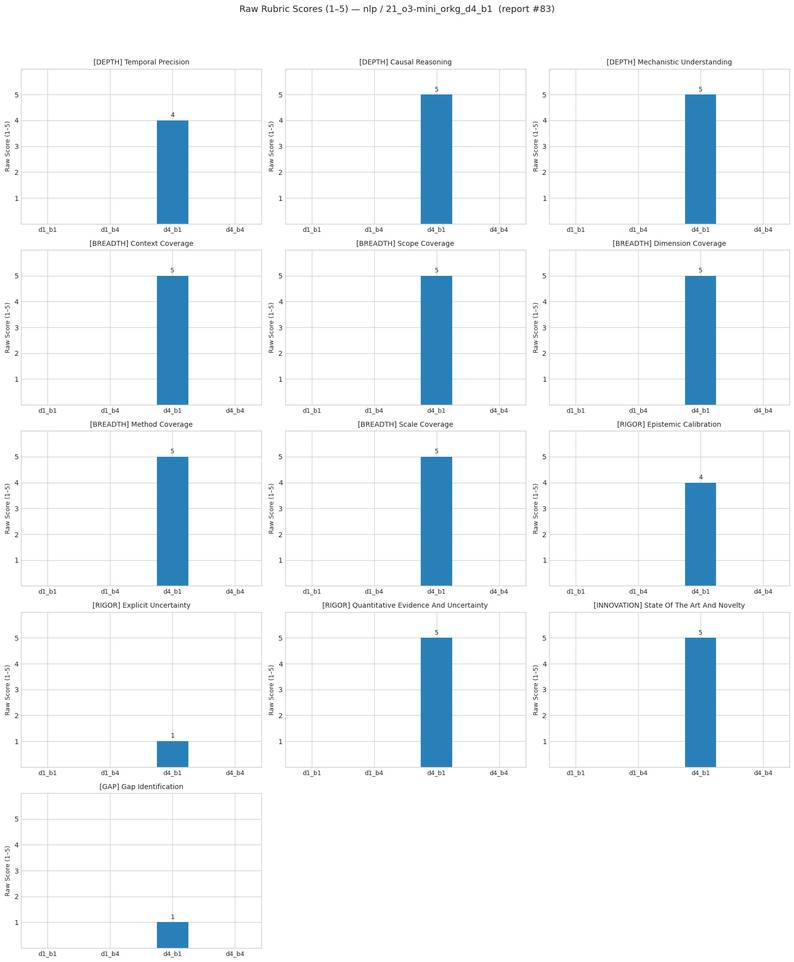

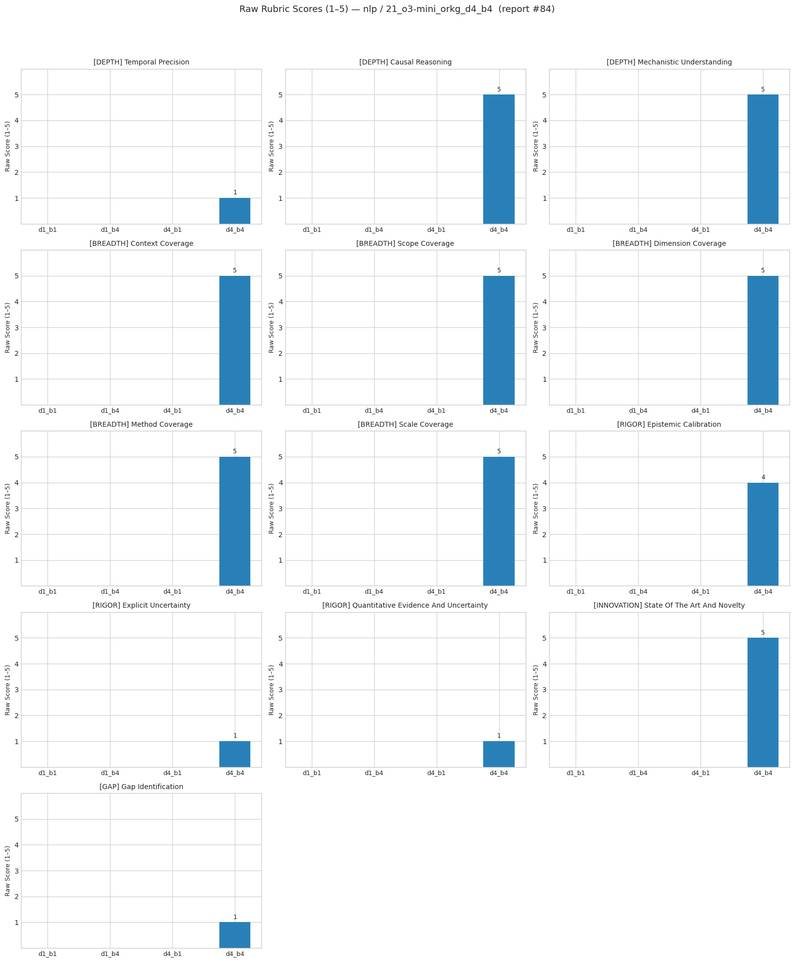

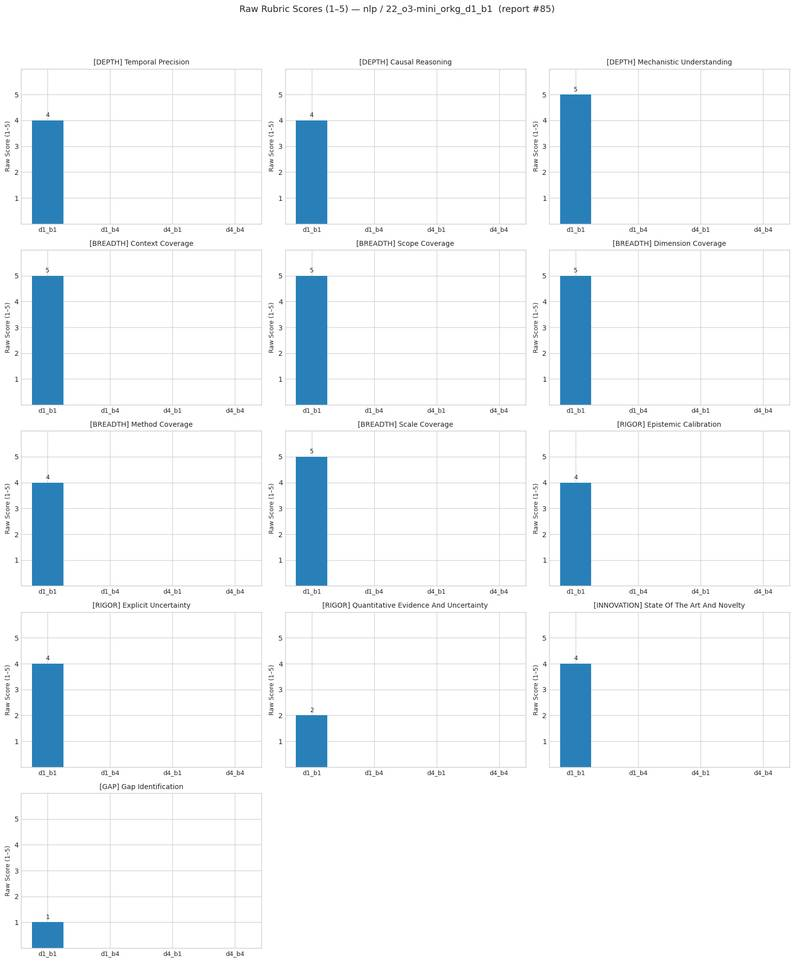

...

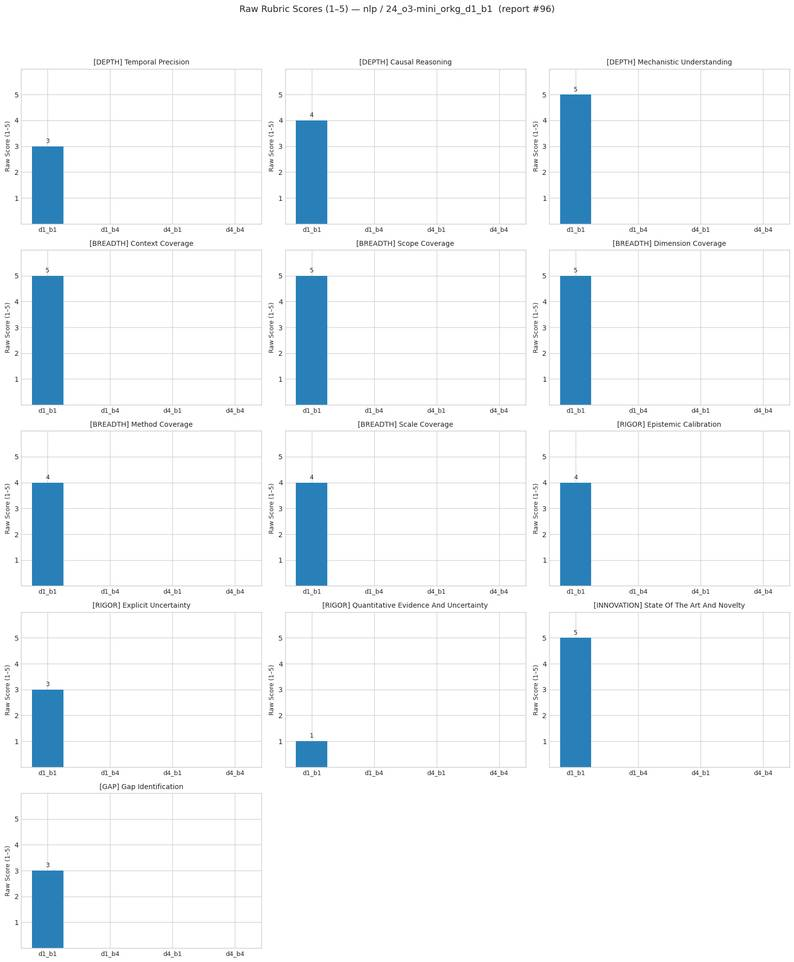

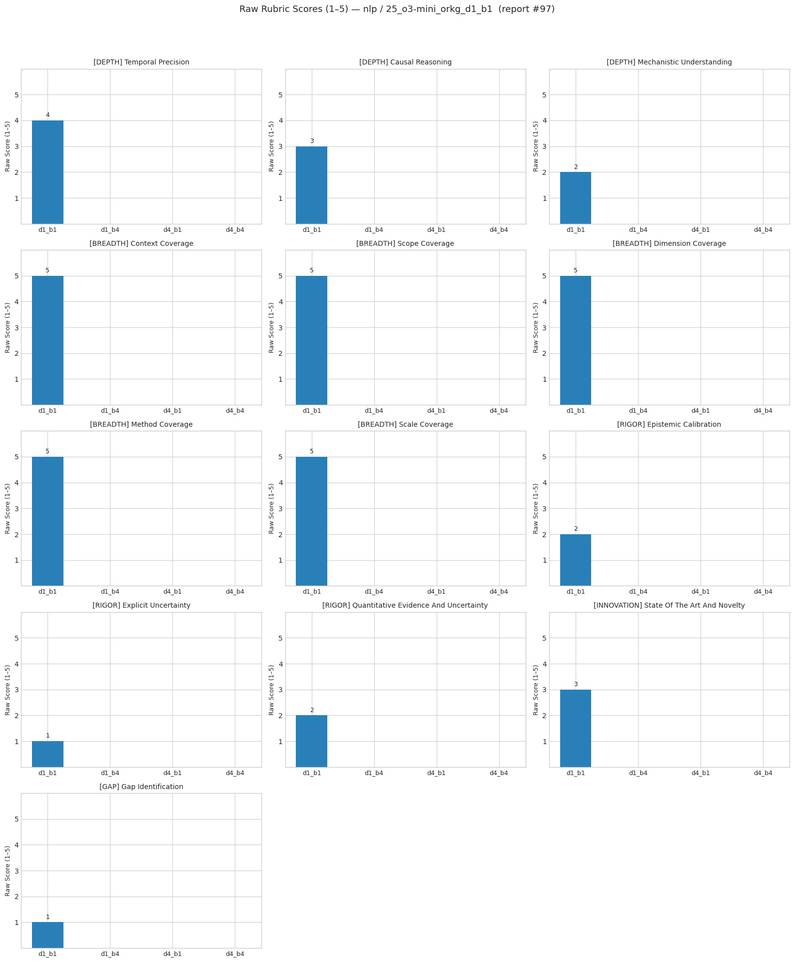

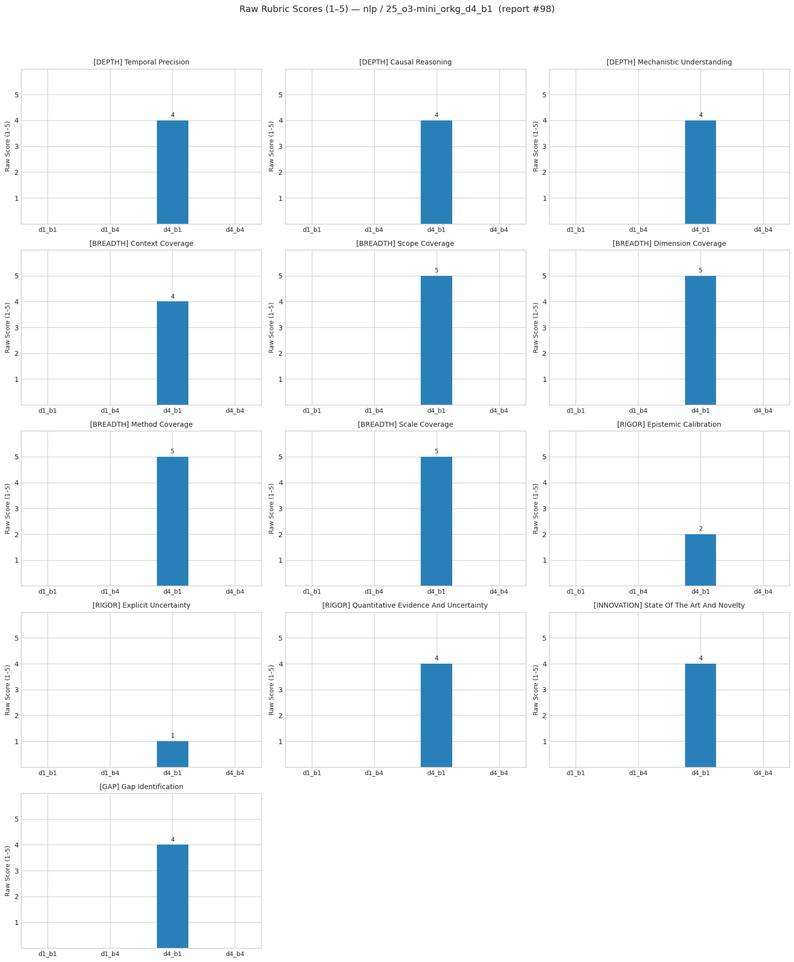

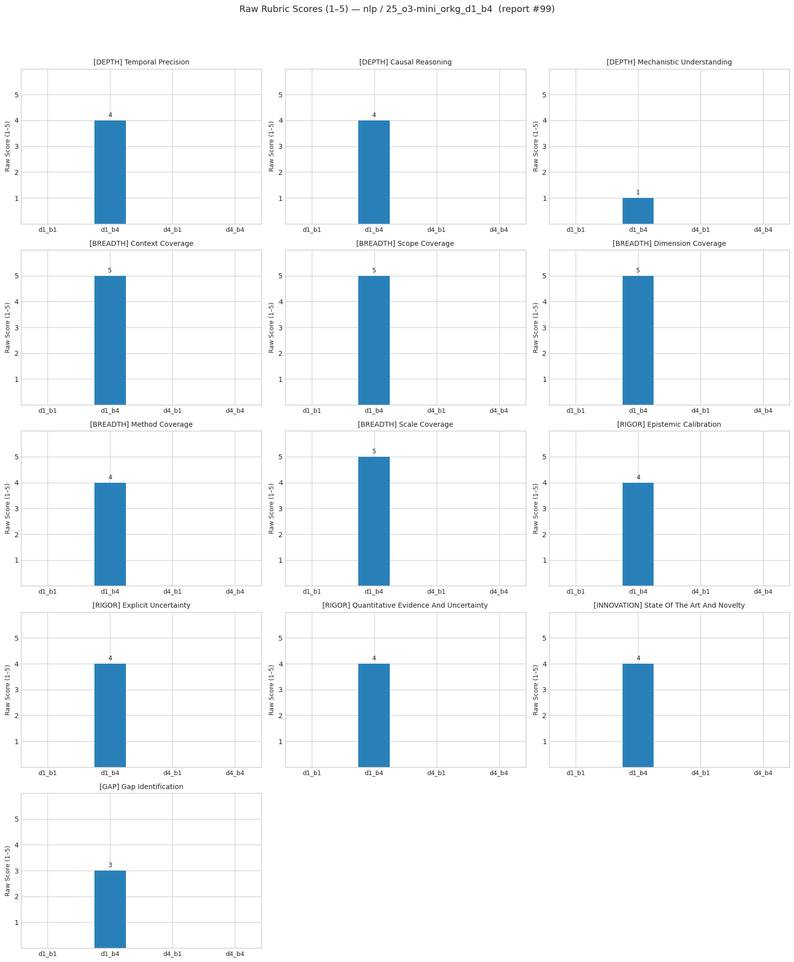

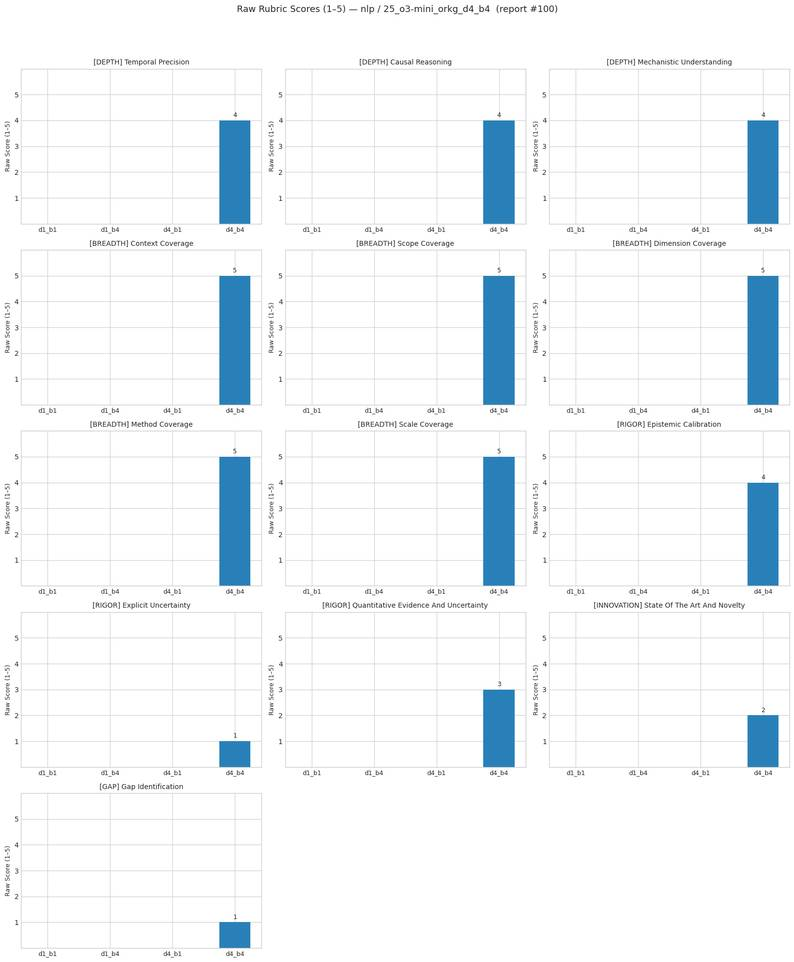

  … 100/196 reports plotted


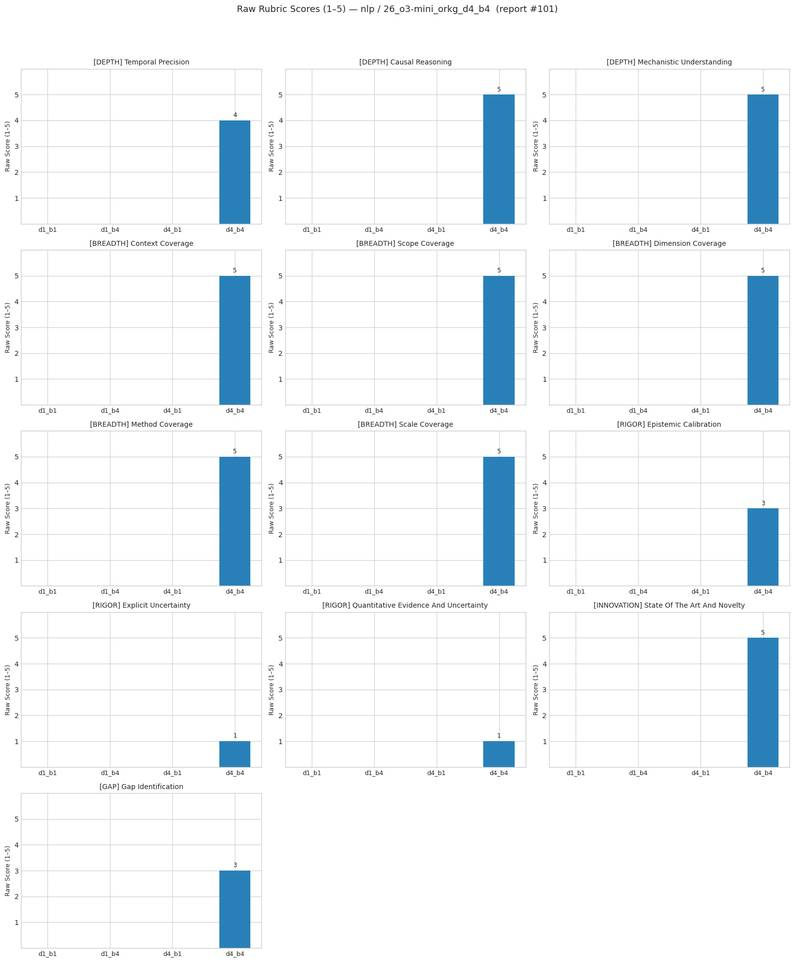

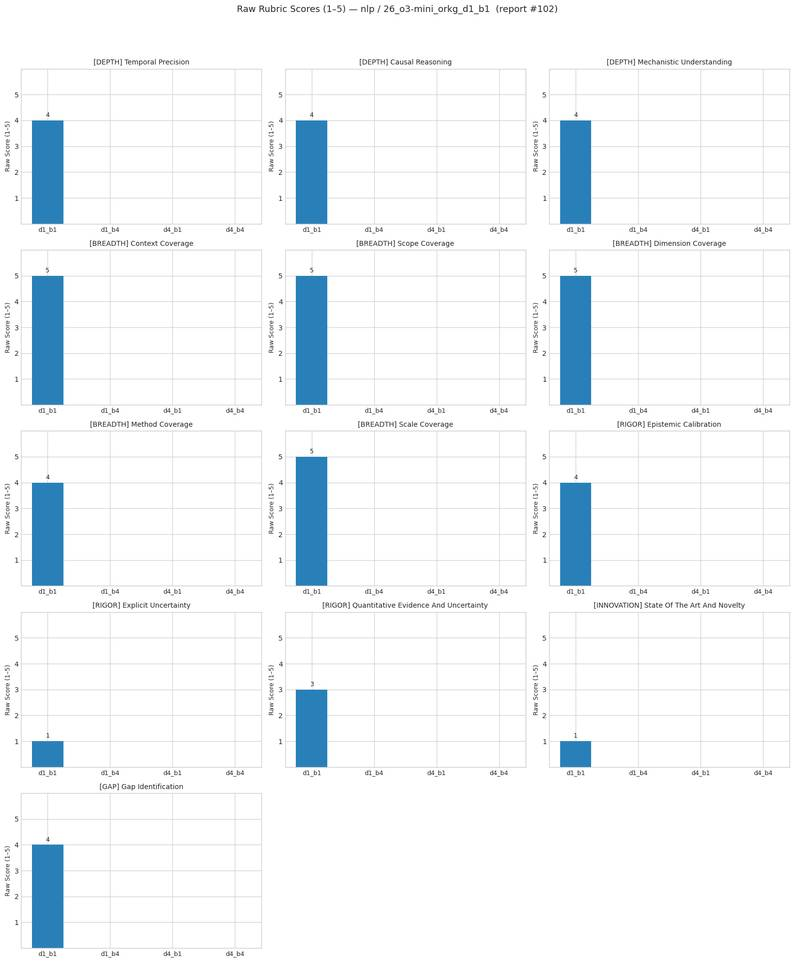

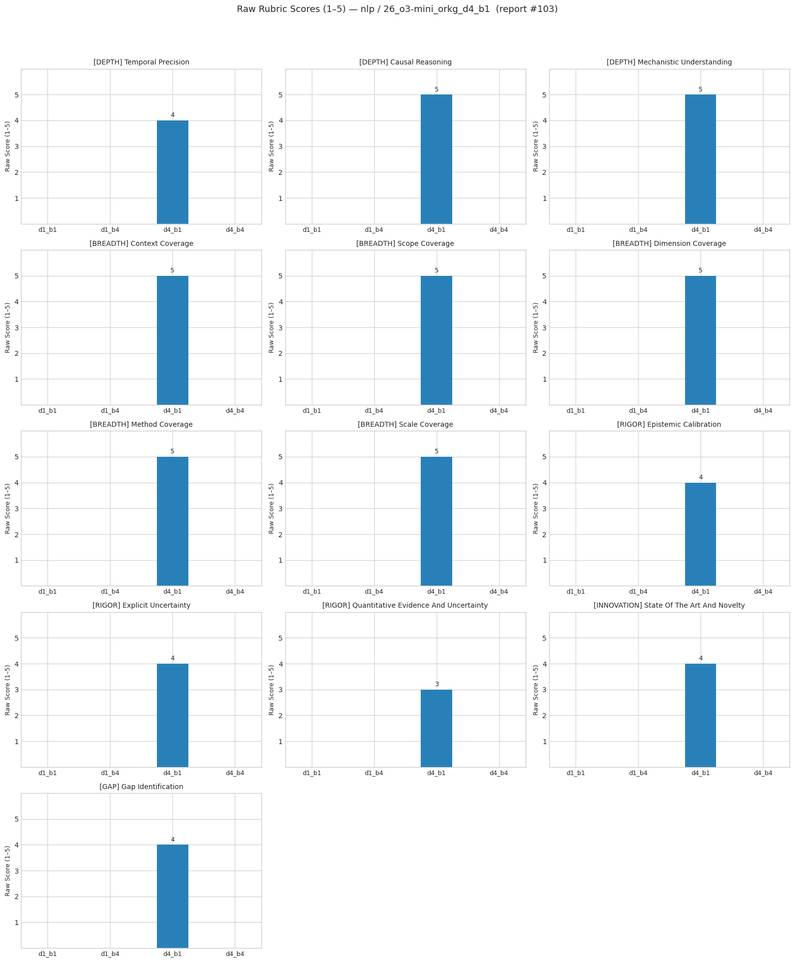

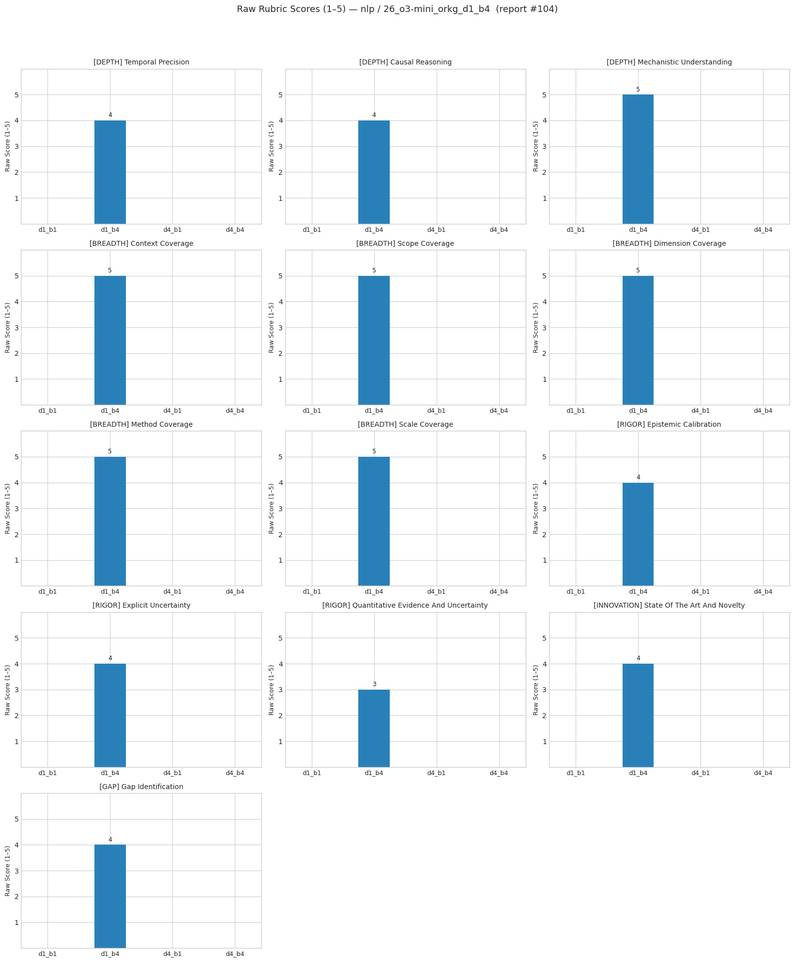

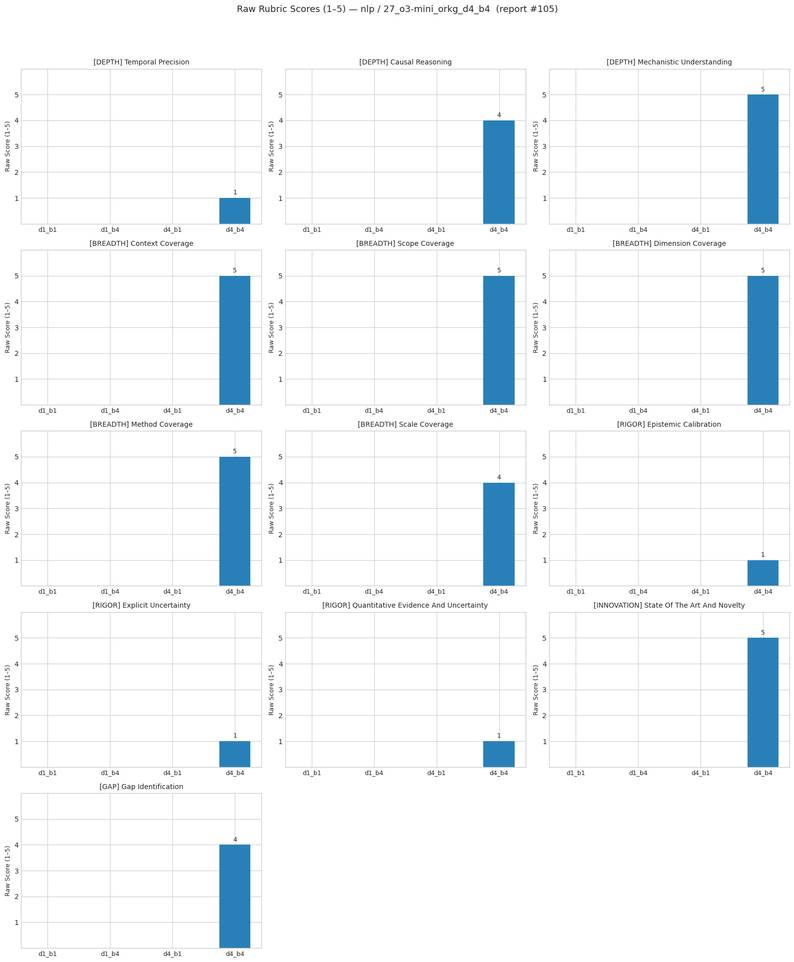

...

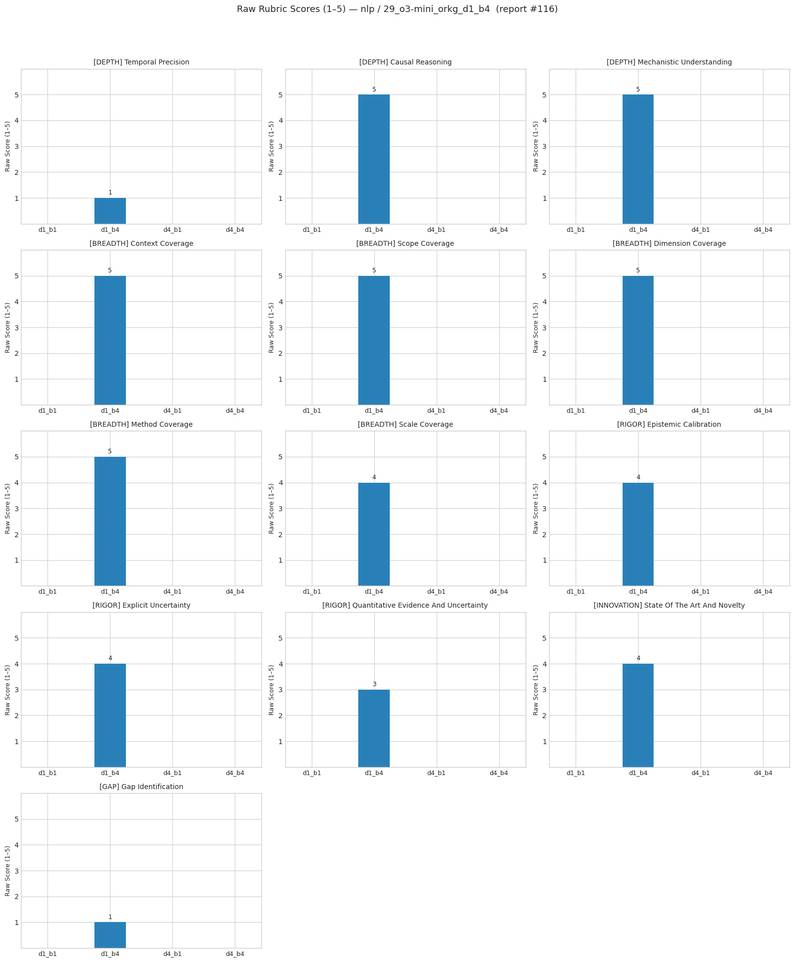

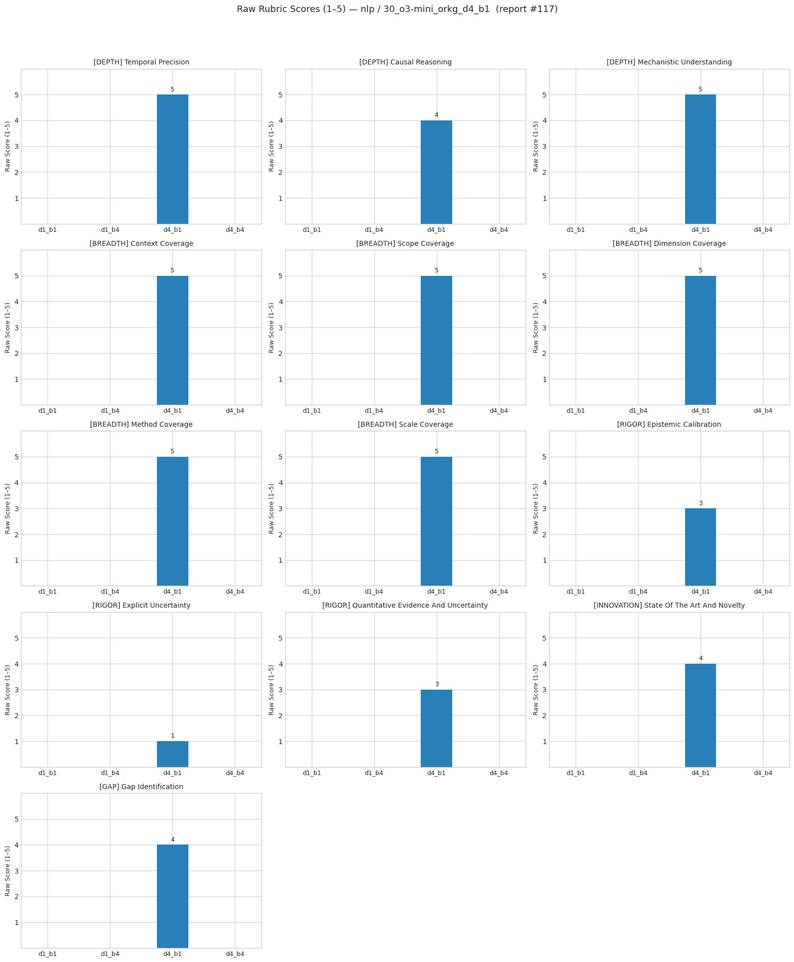

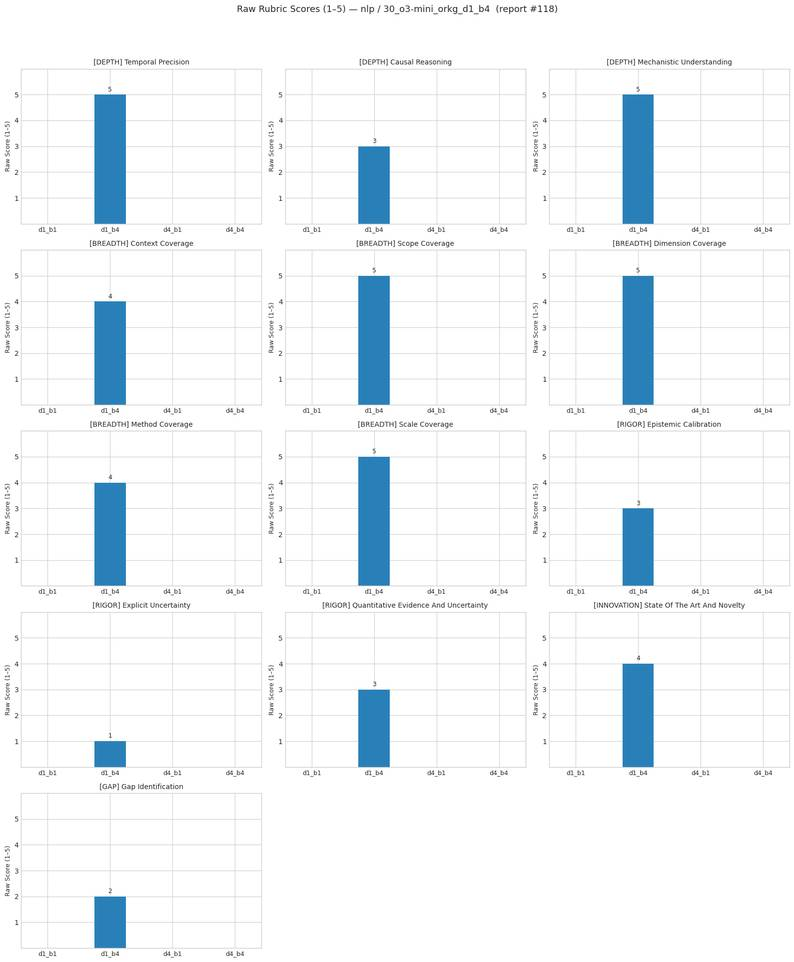

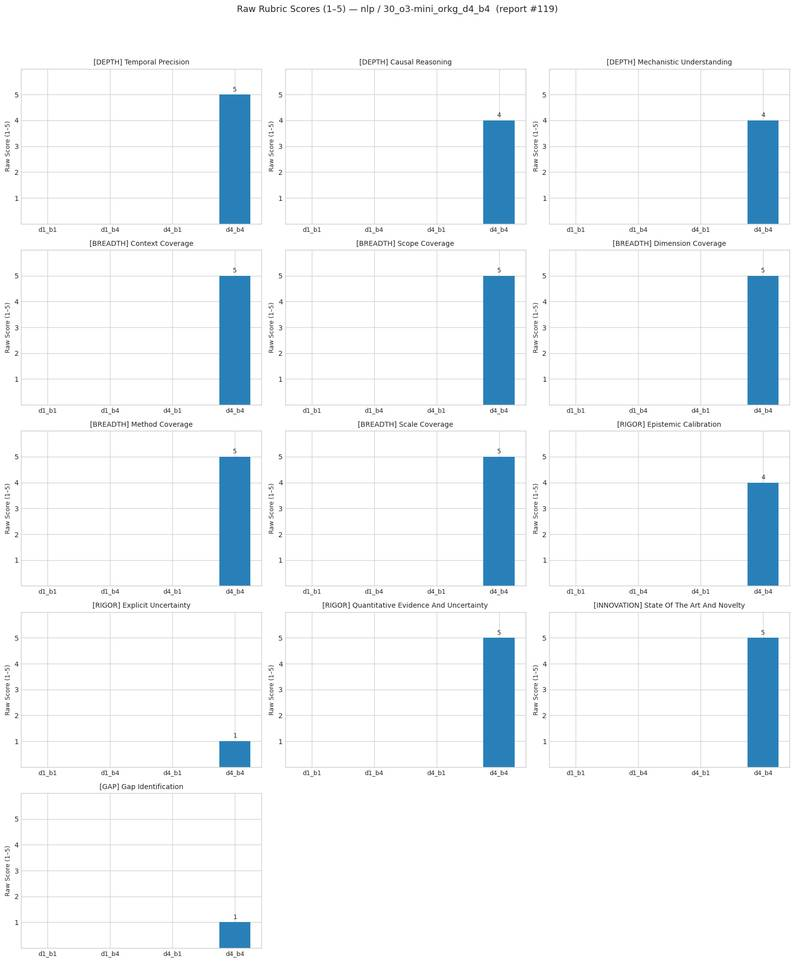

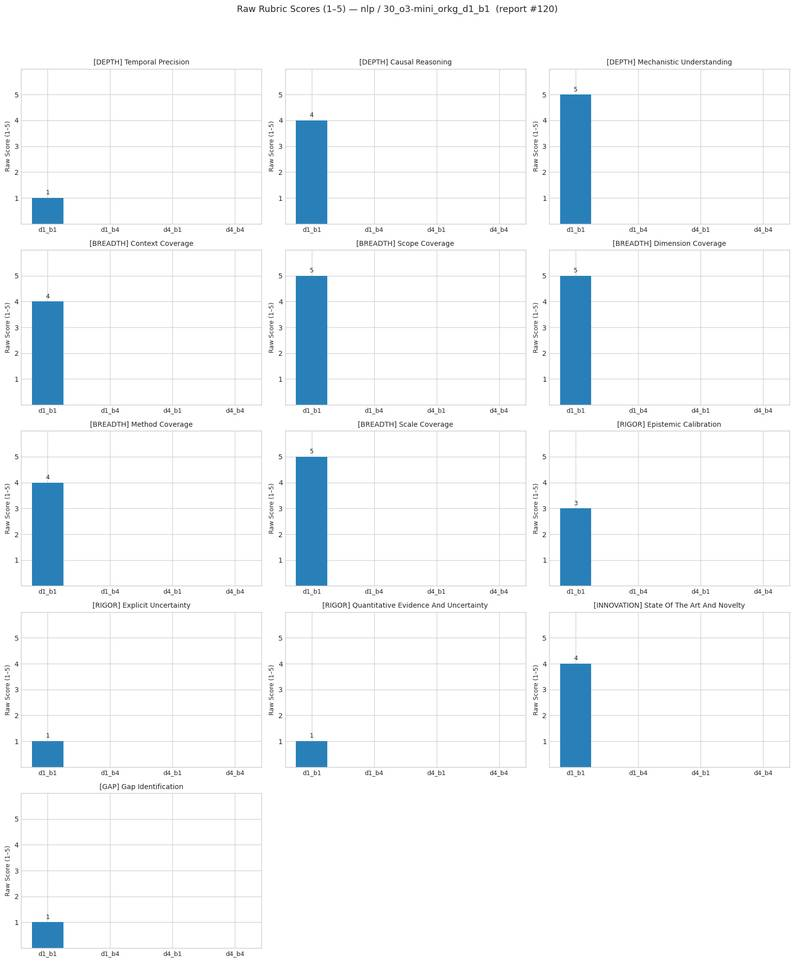

  … 120/196 reports plotted


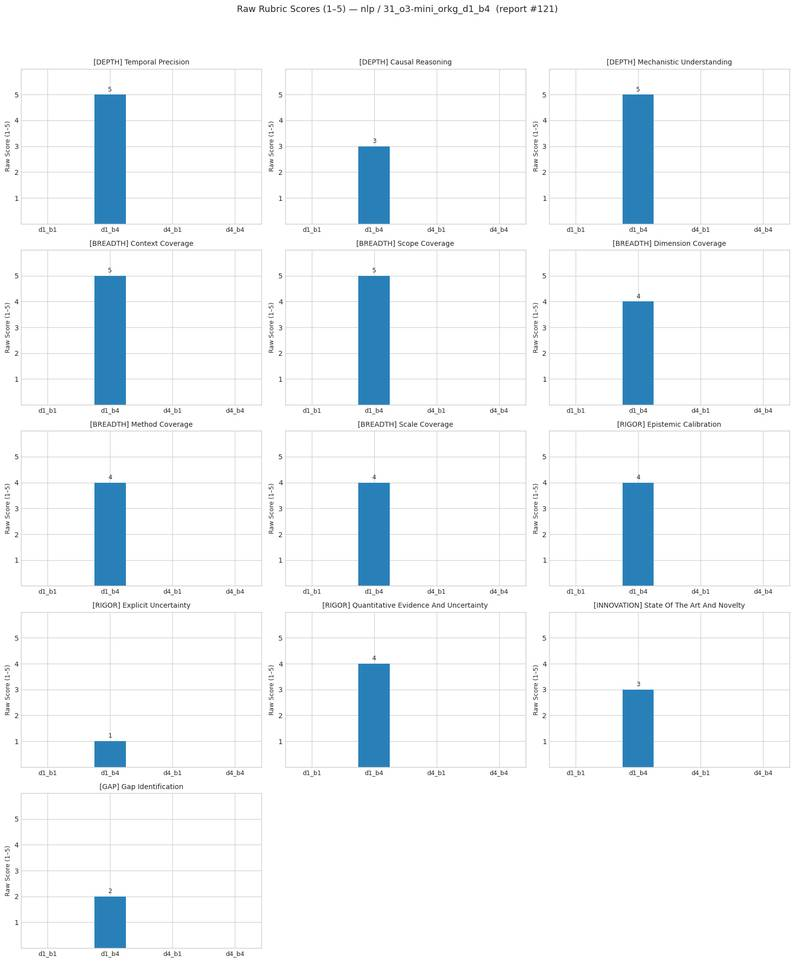

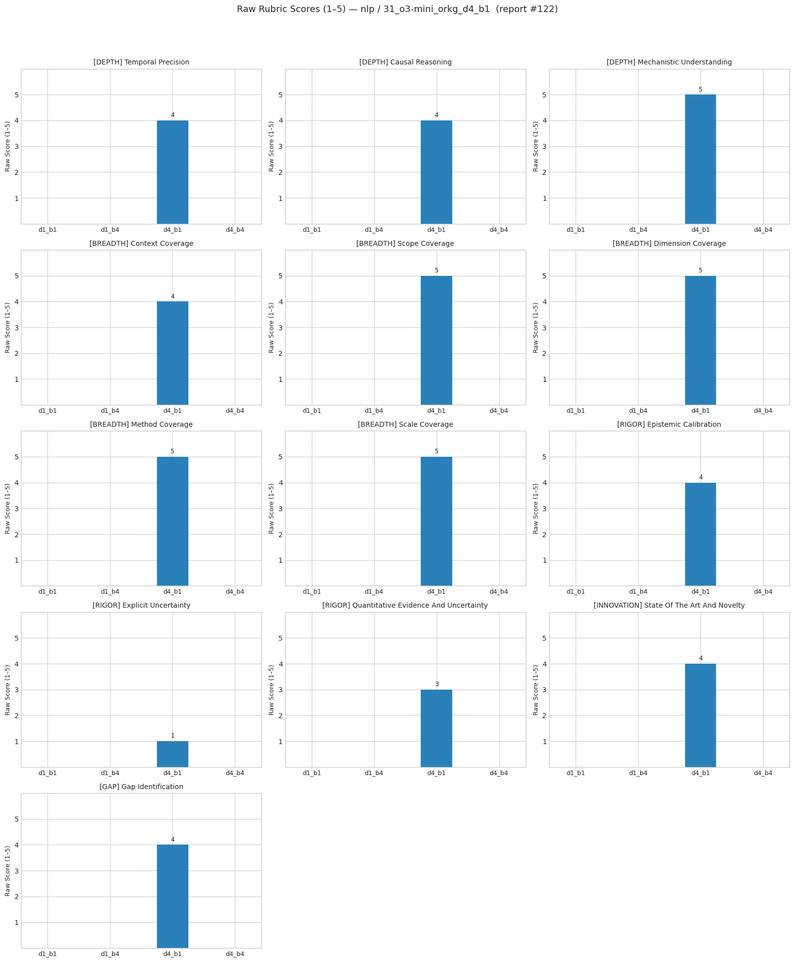

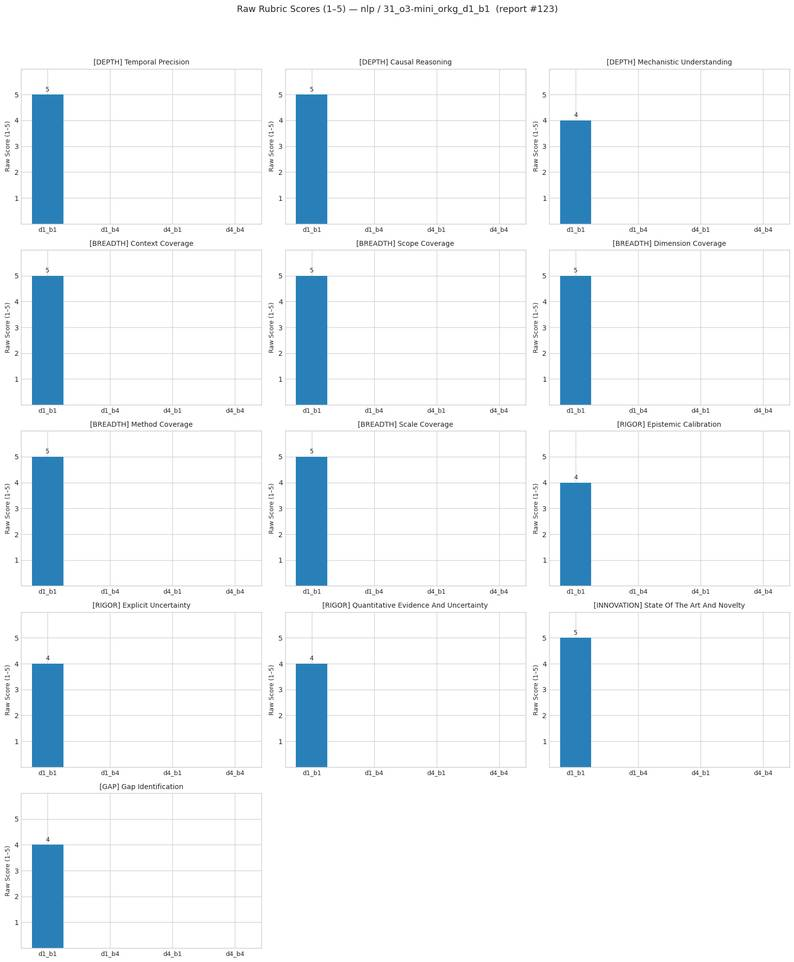

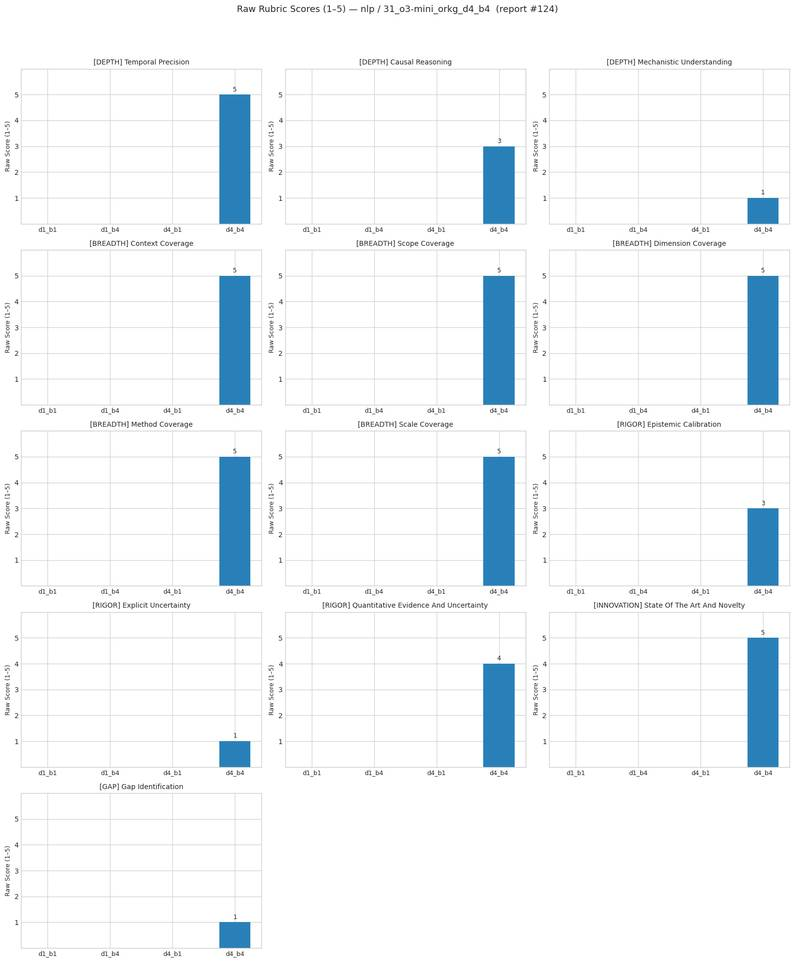

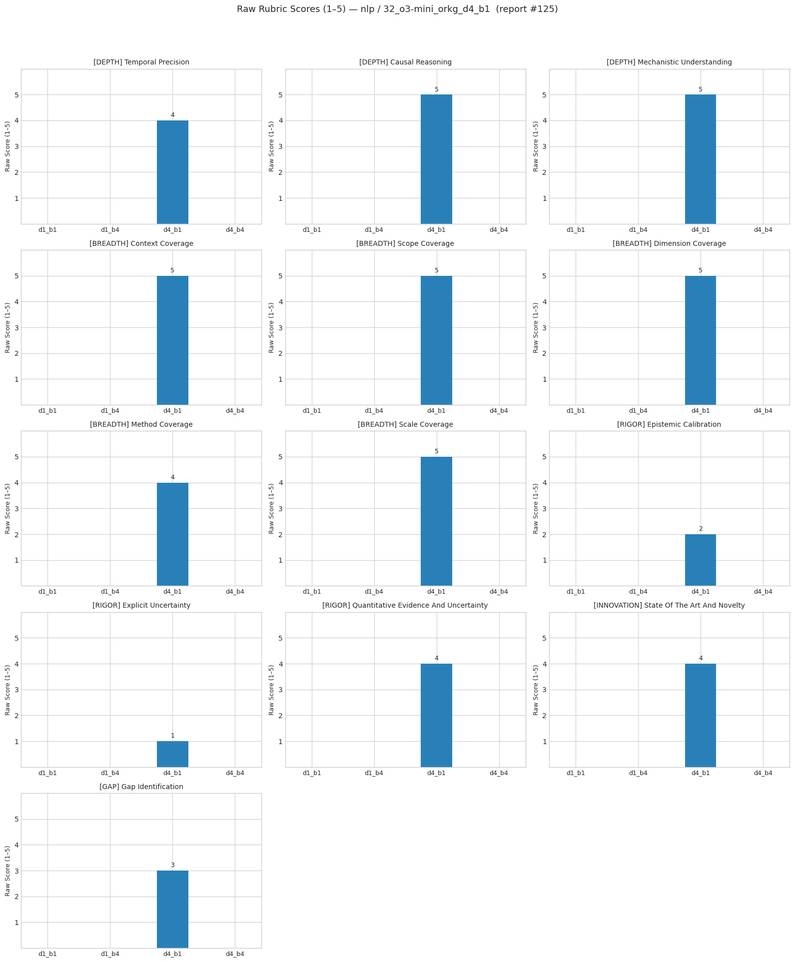

...

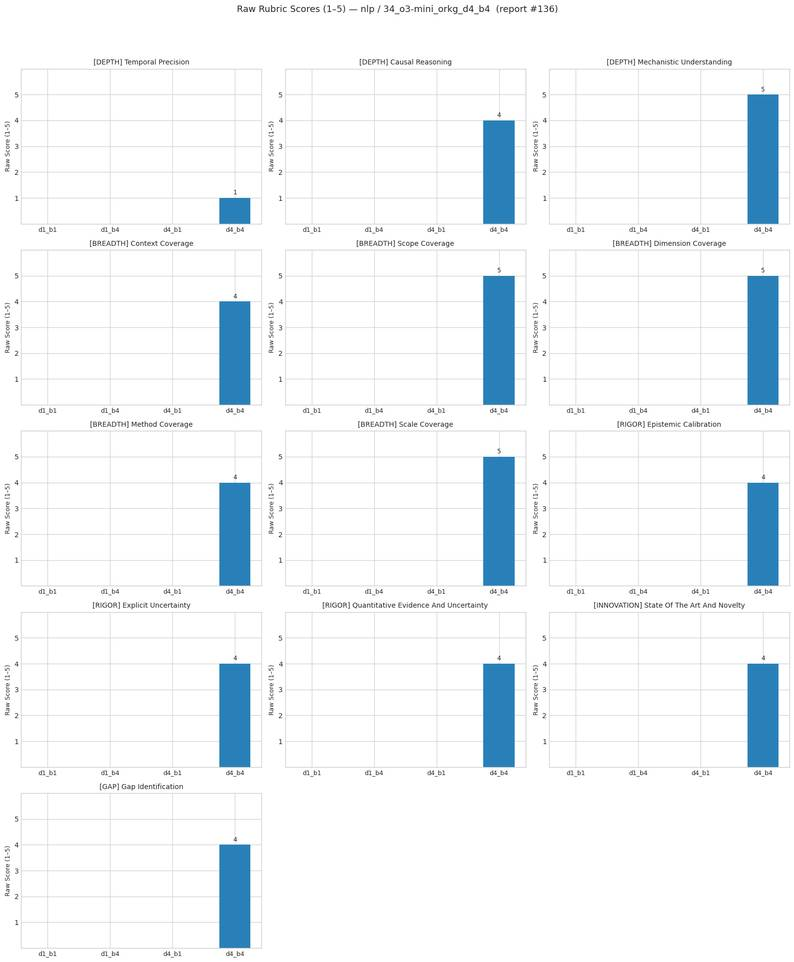

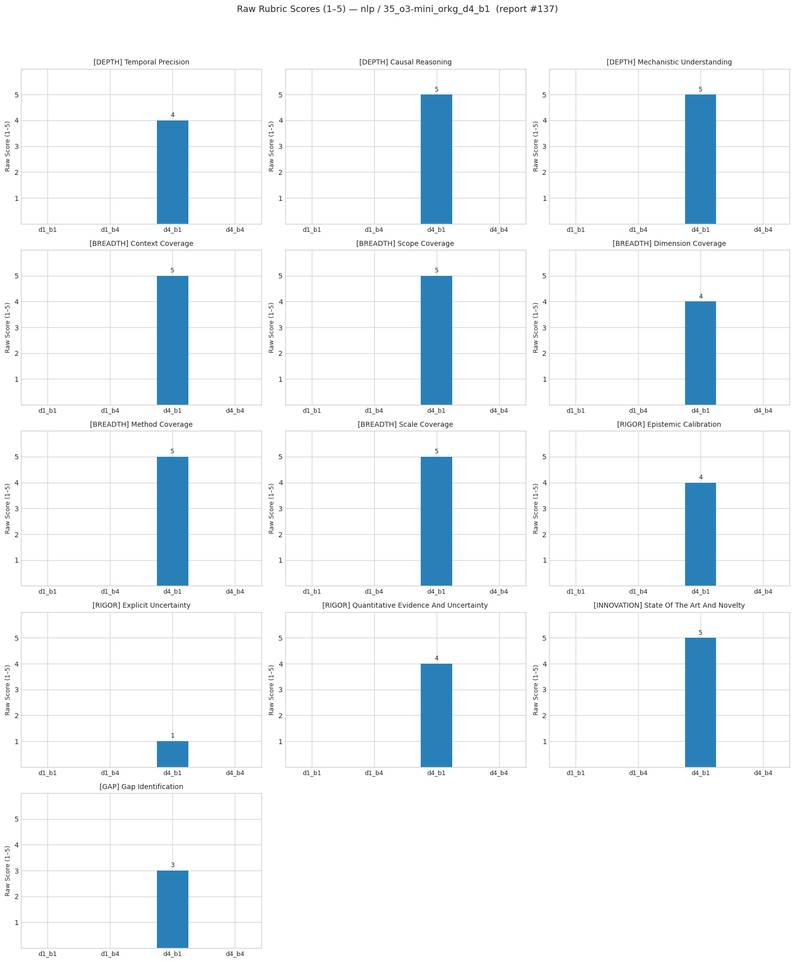

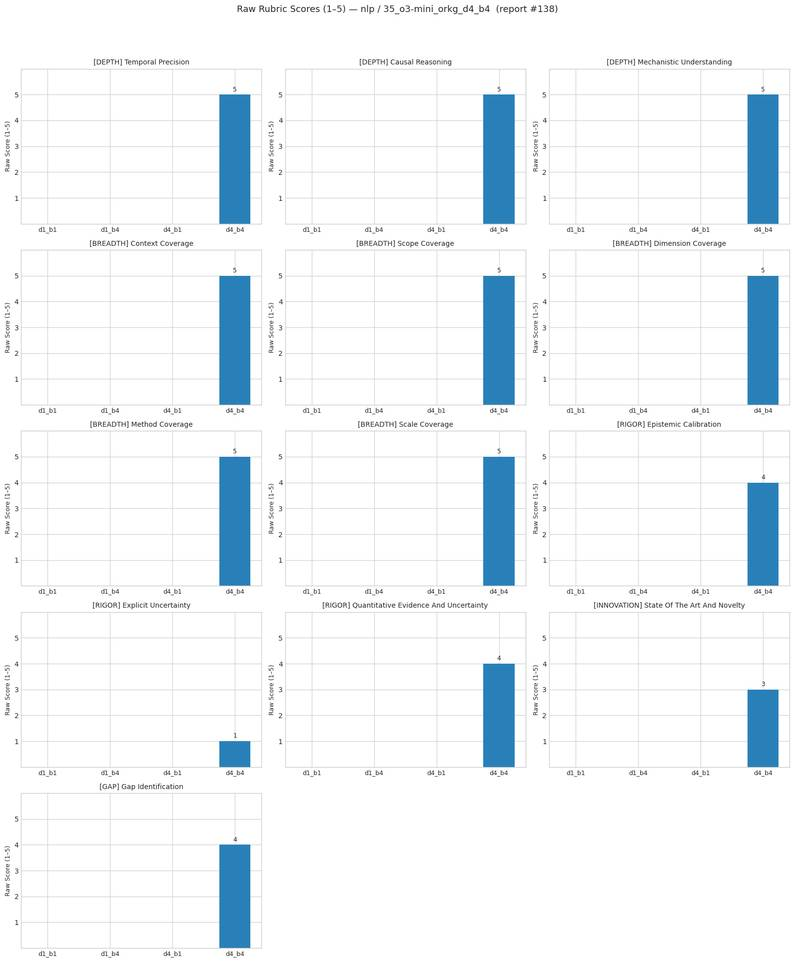

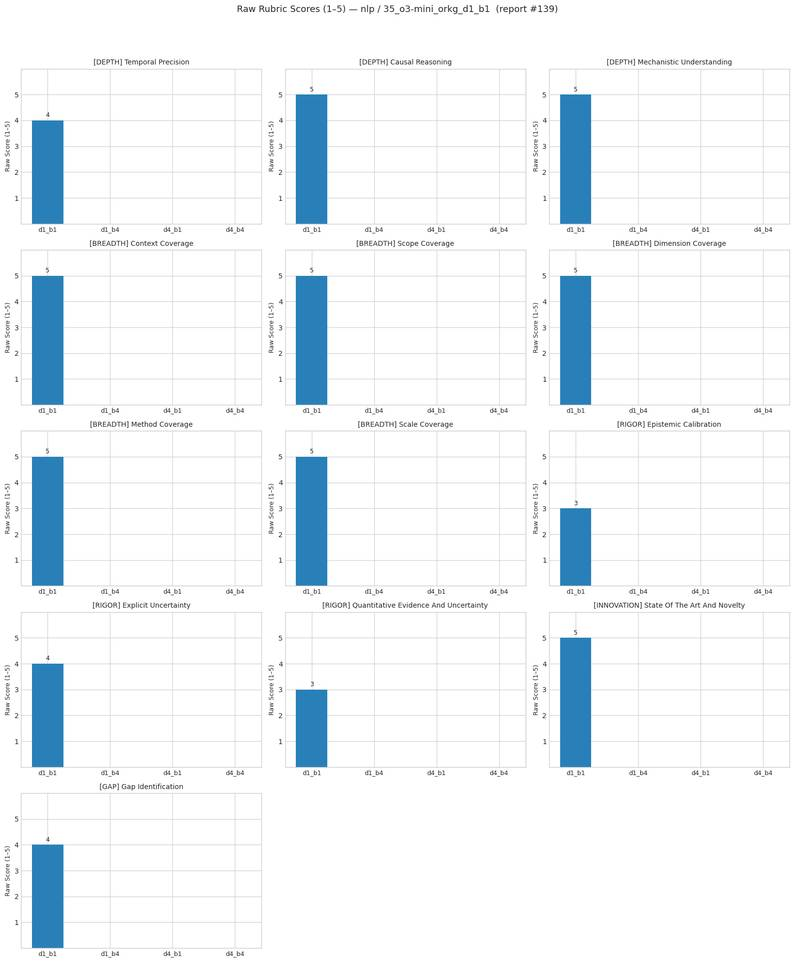

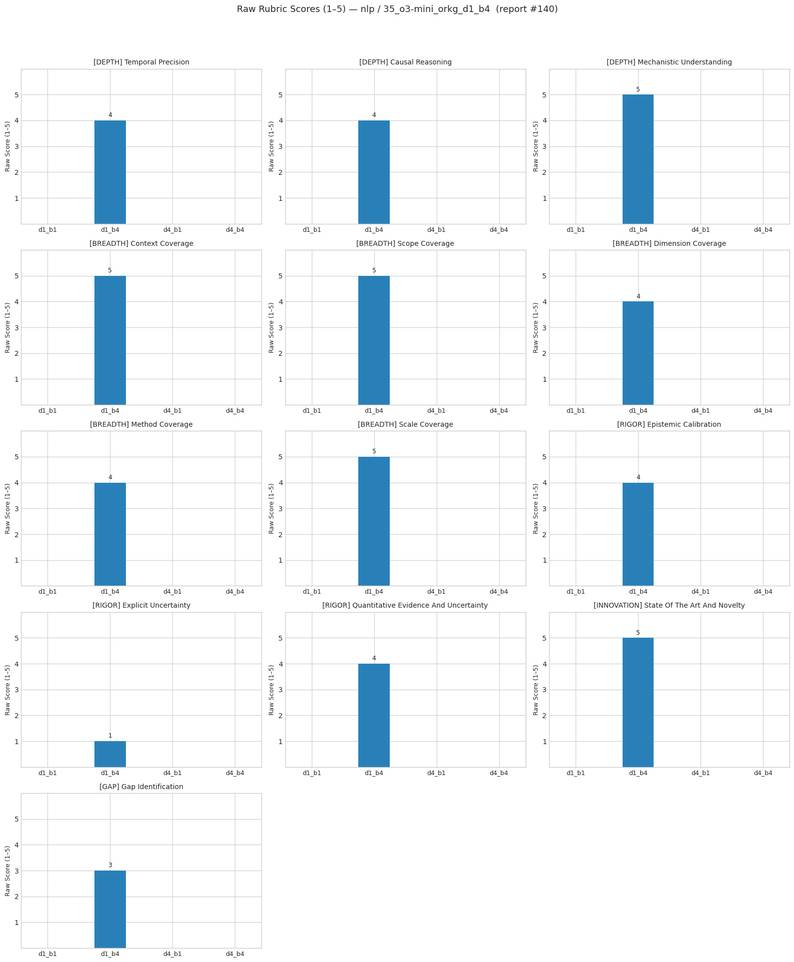

  … 140/196 reports plotted


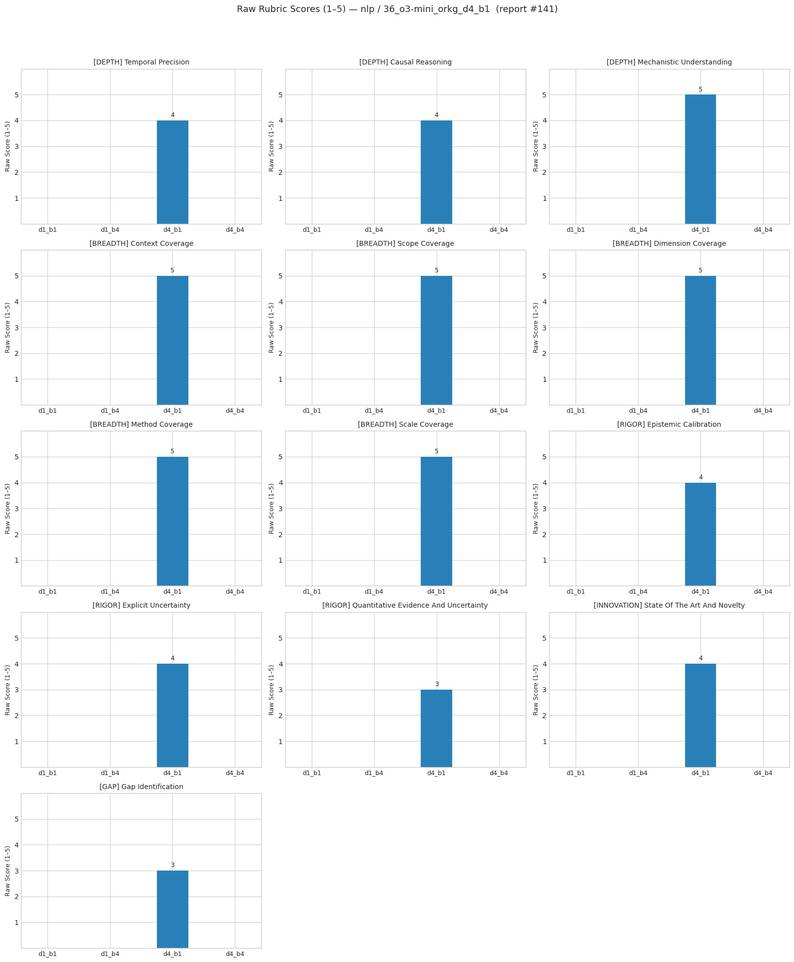

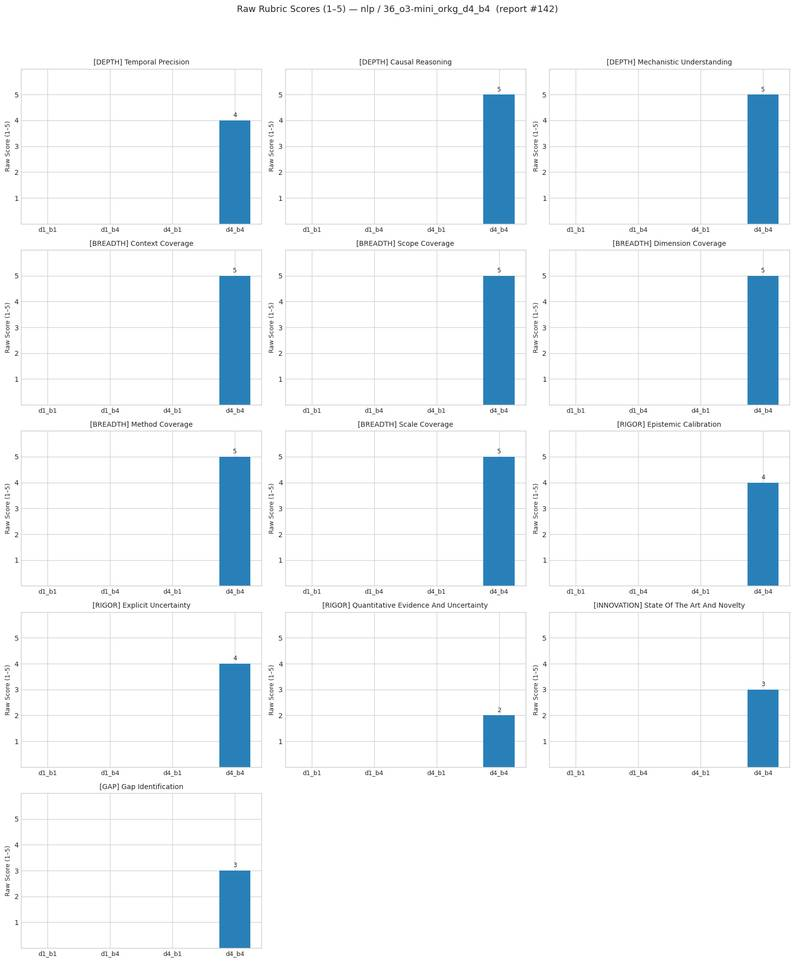

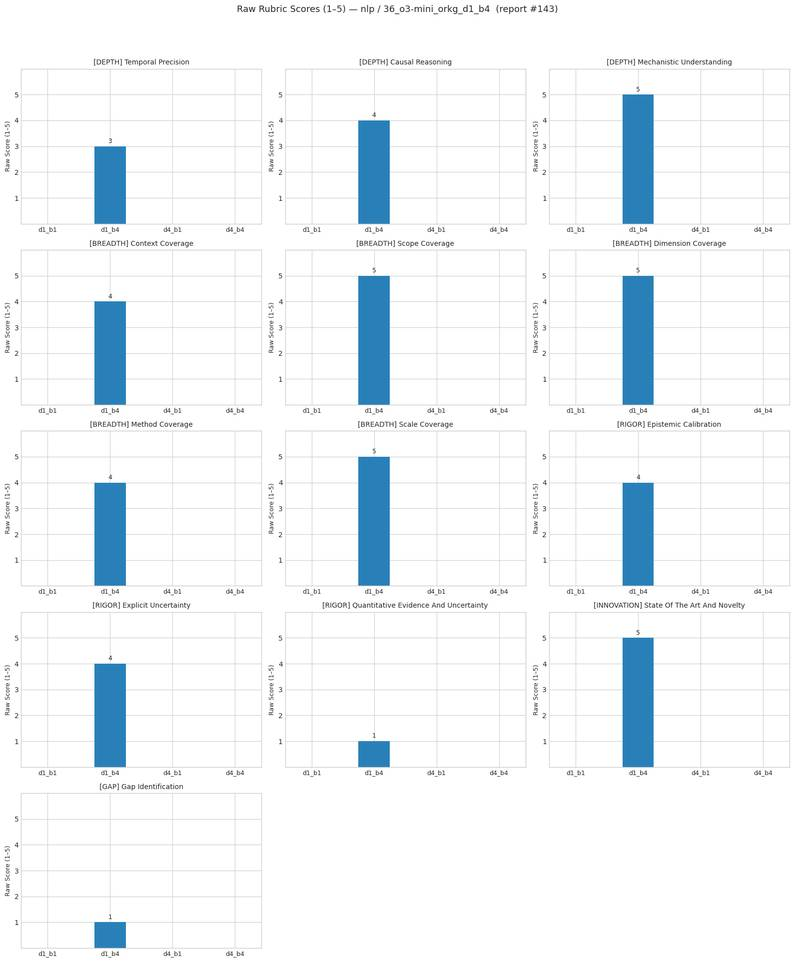

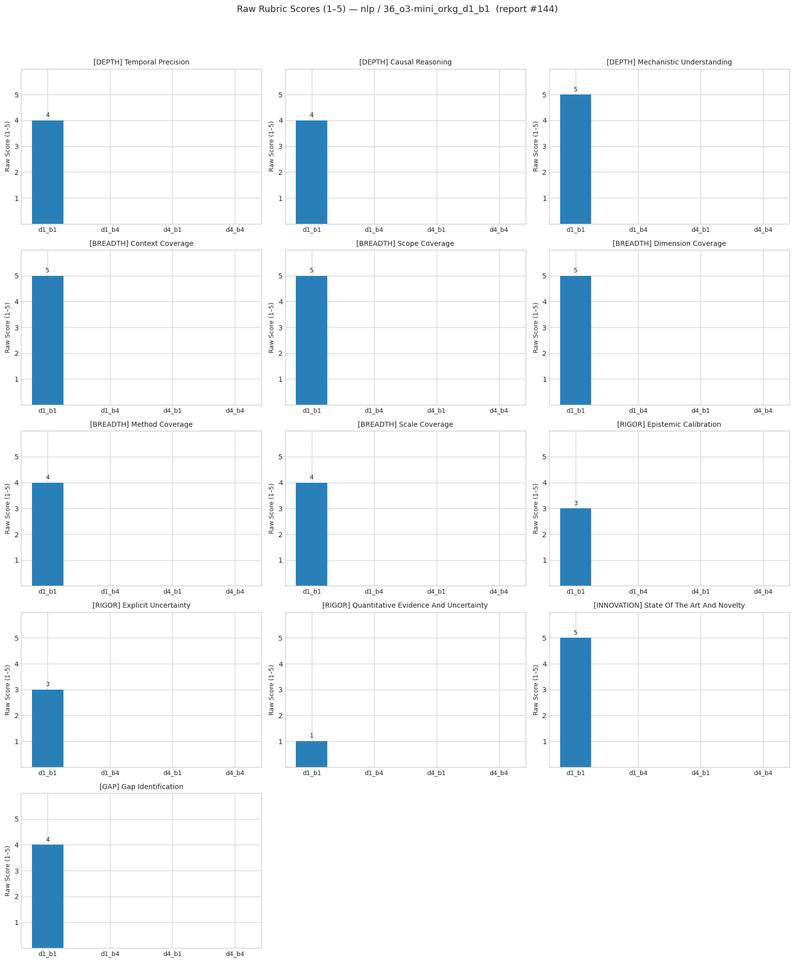

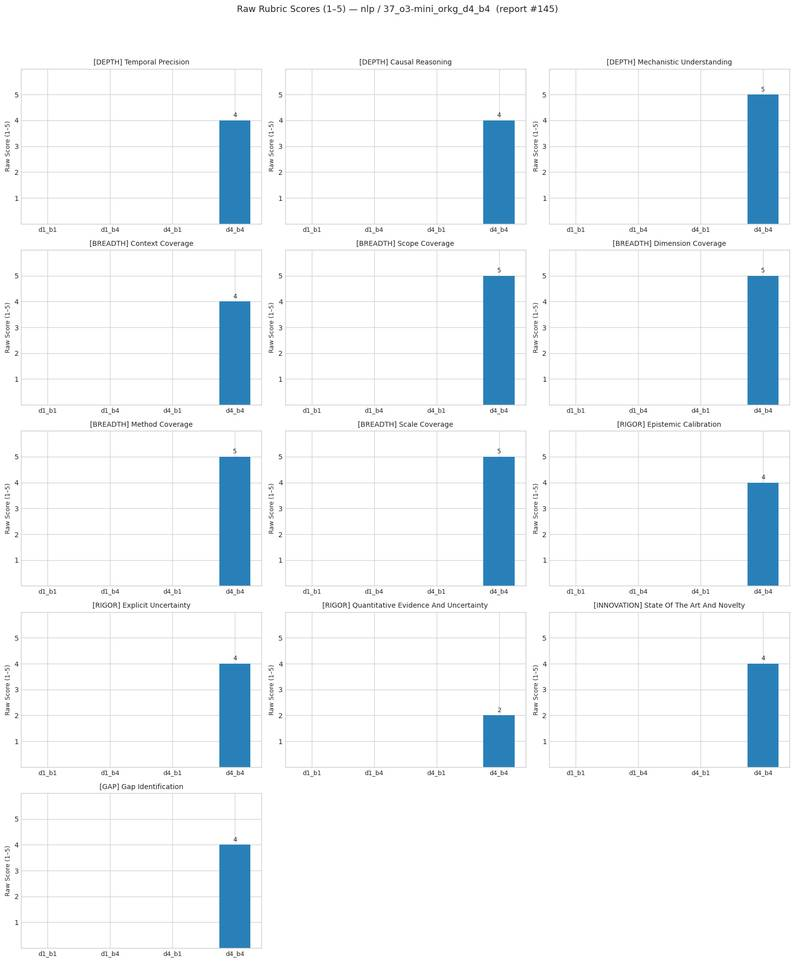

...

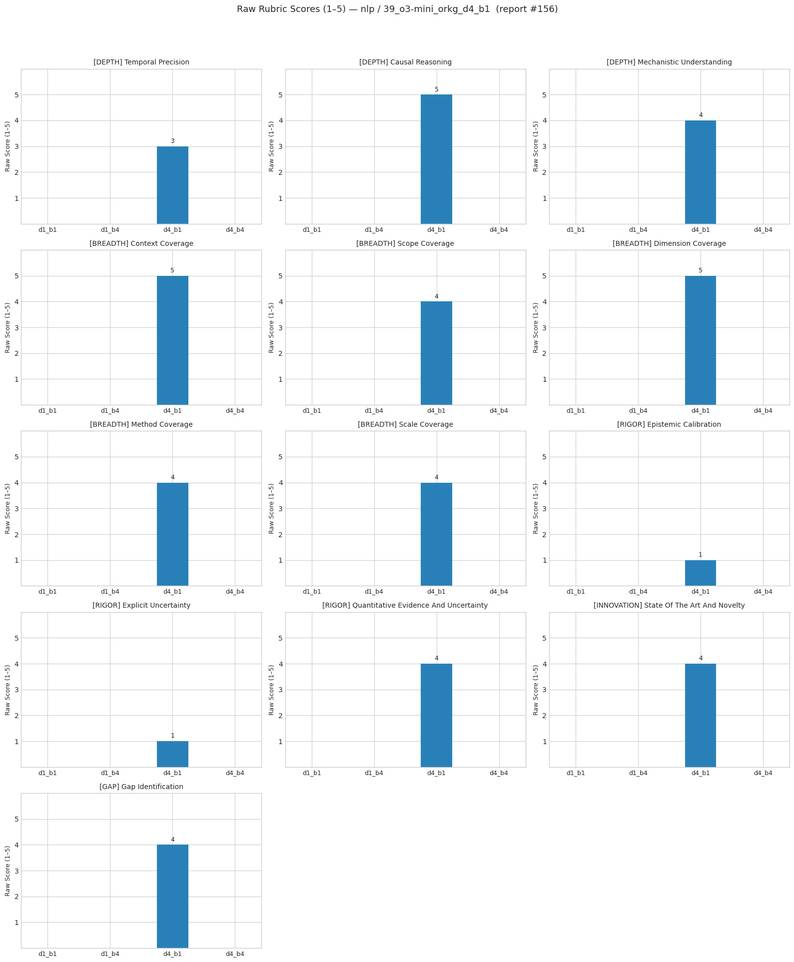

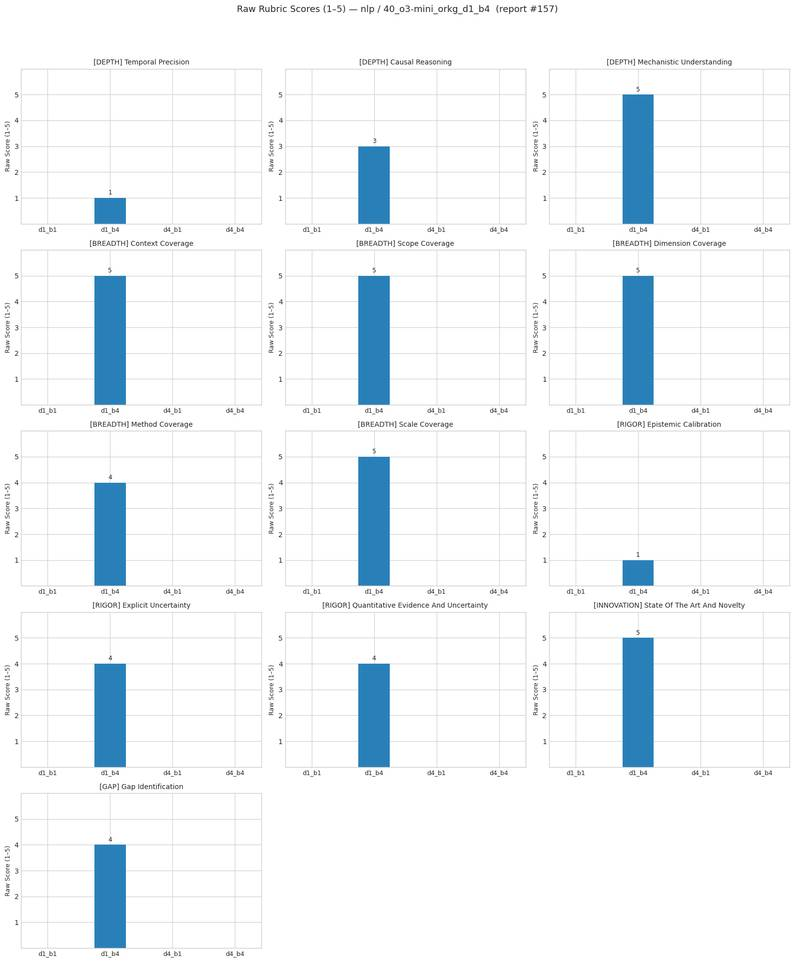

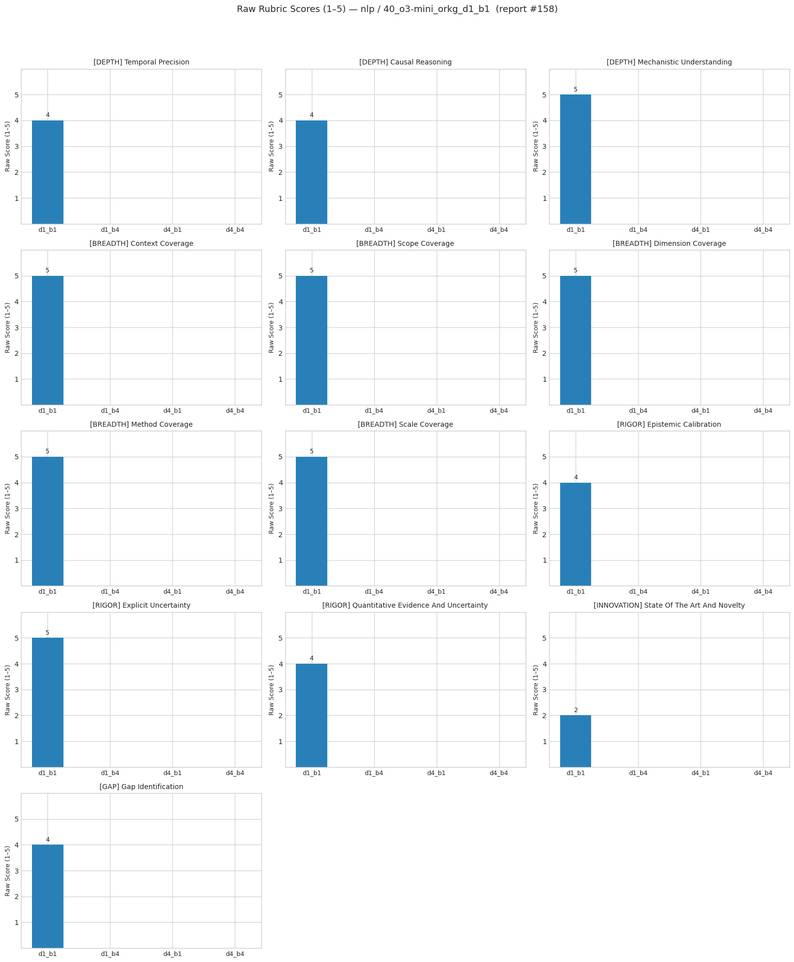

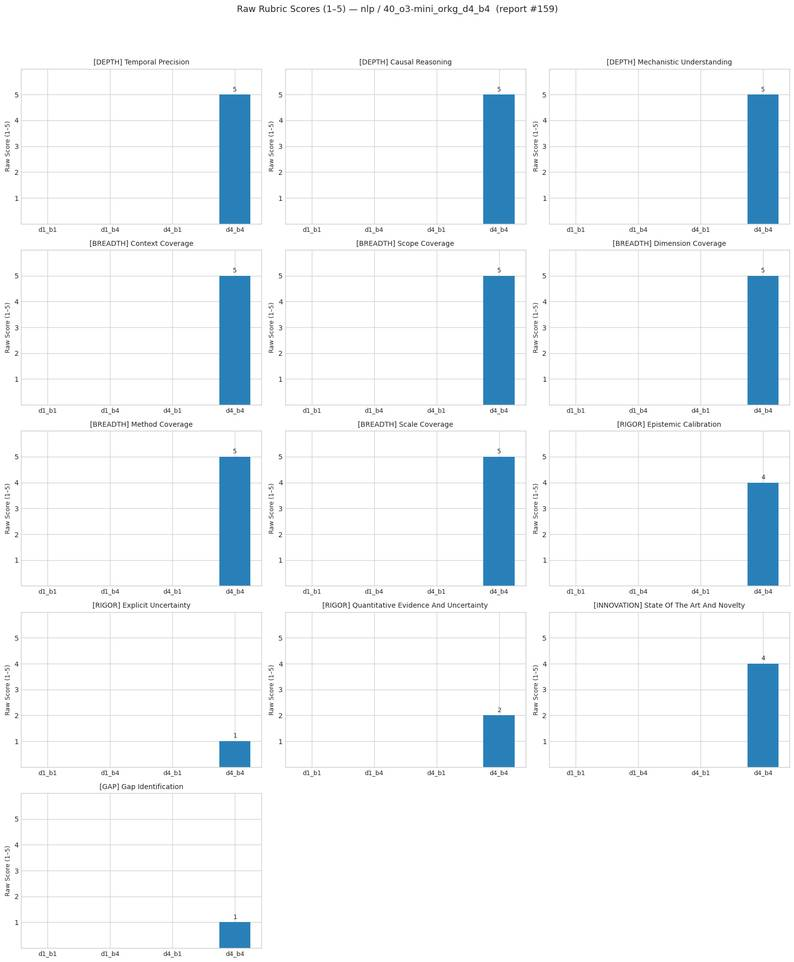

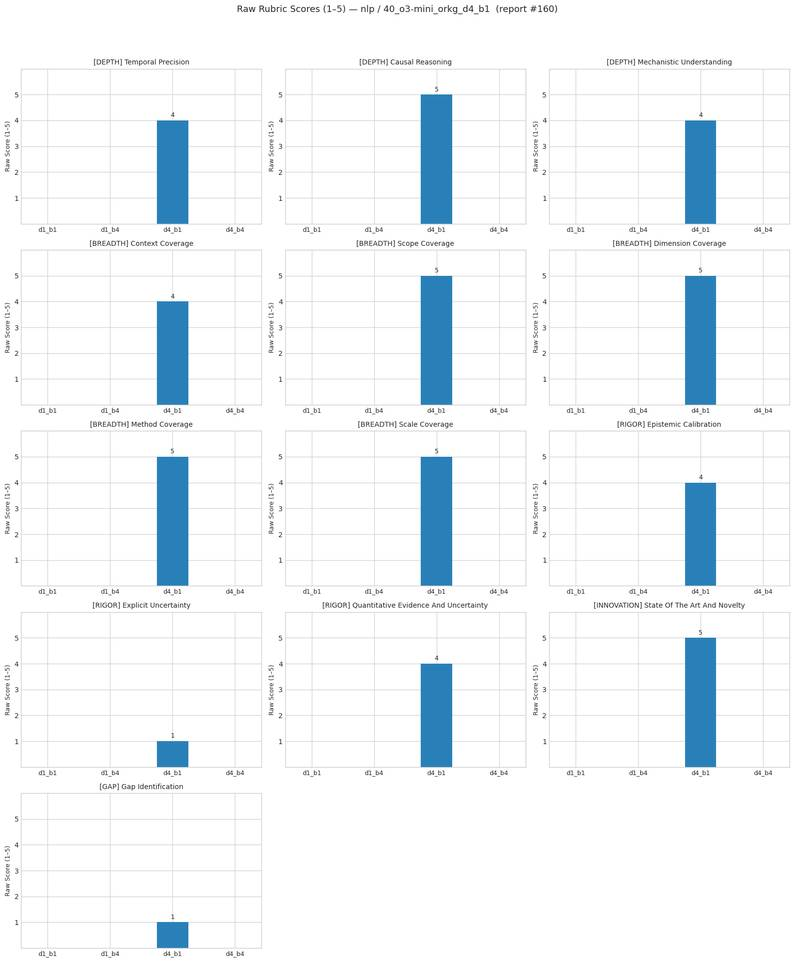

  … 160/196 reports plotted


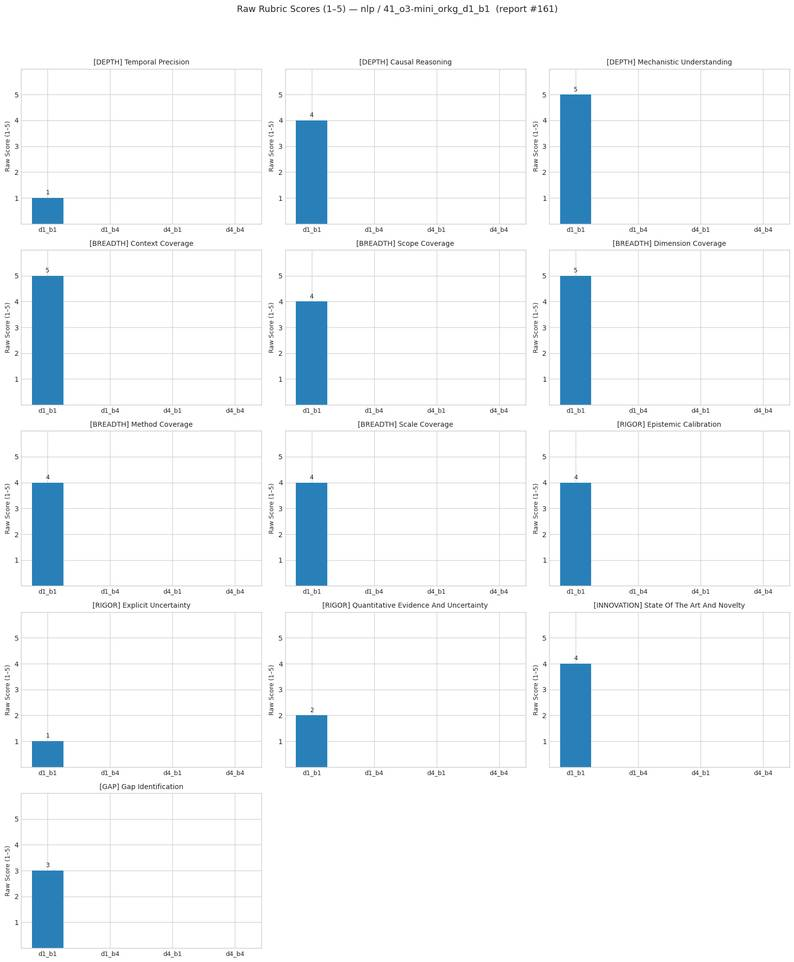

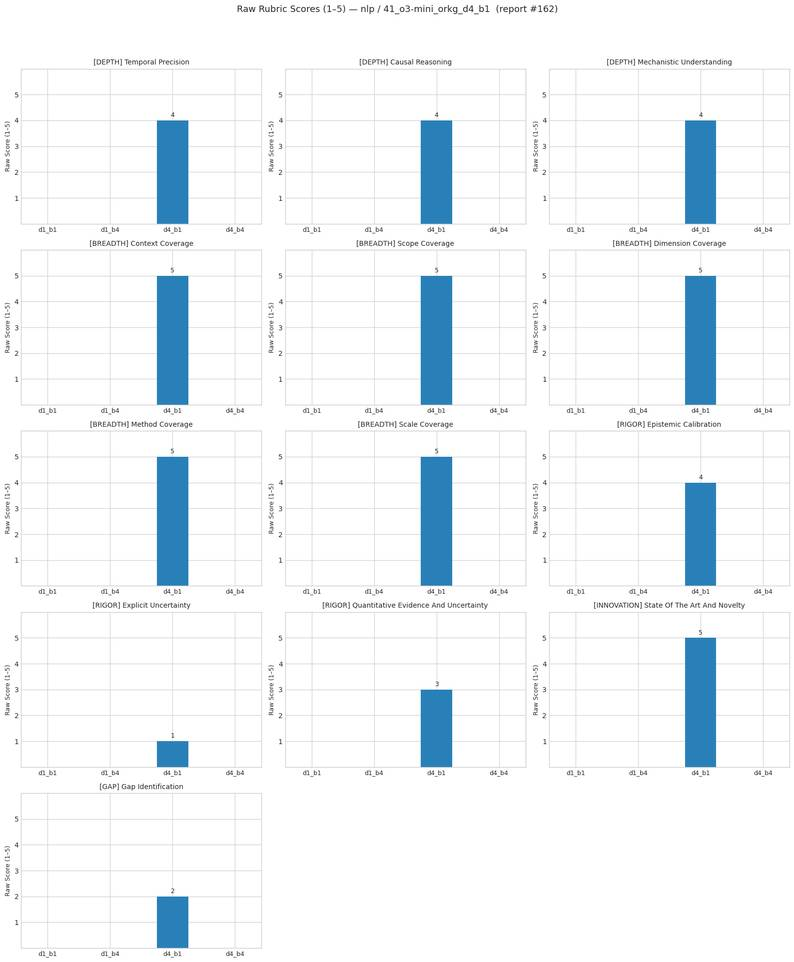

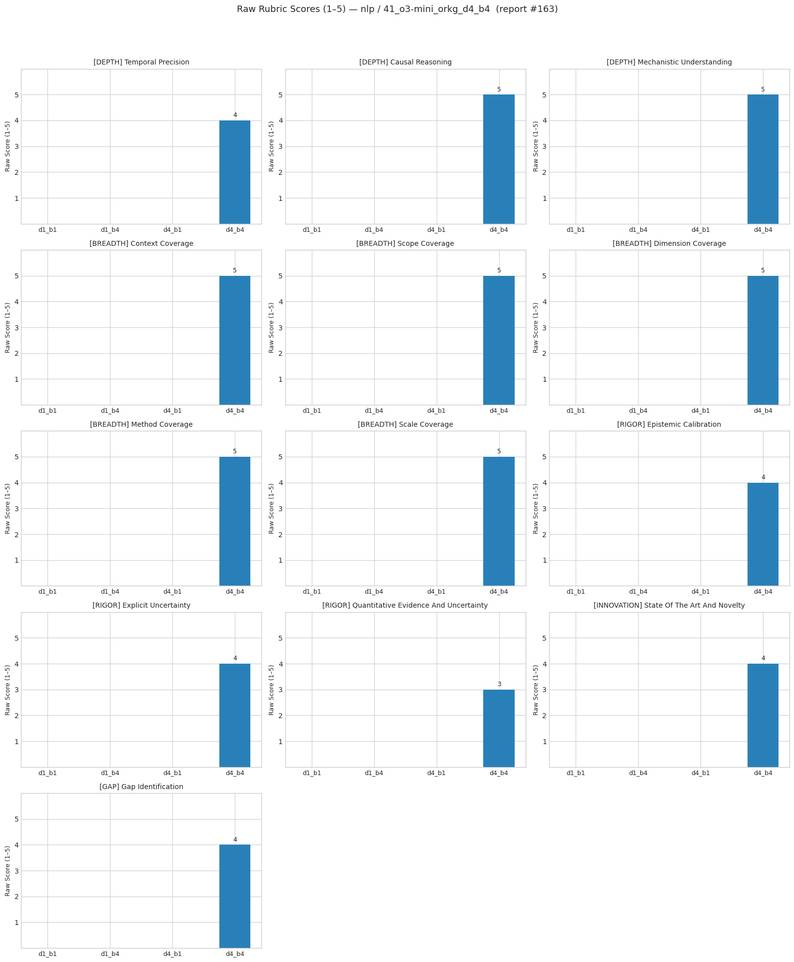

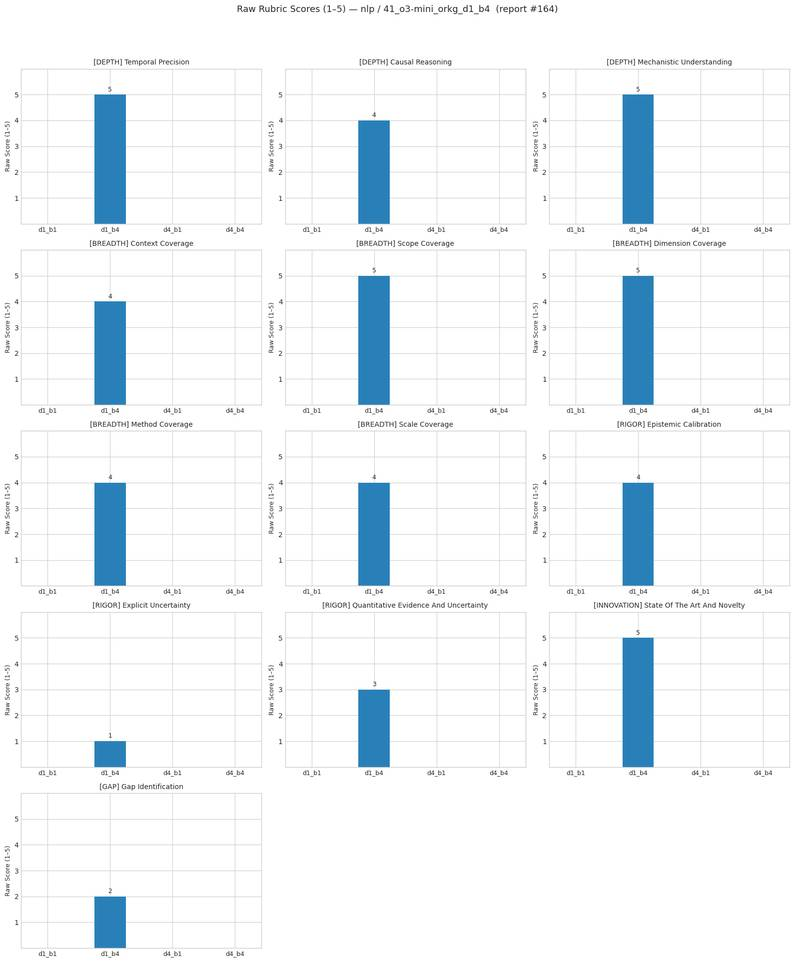

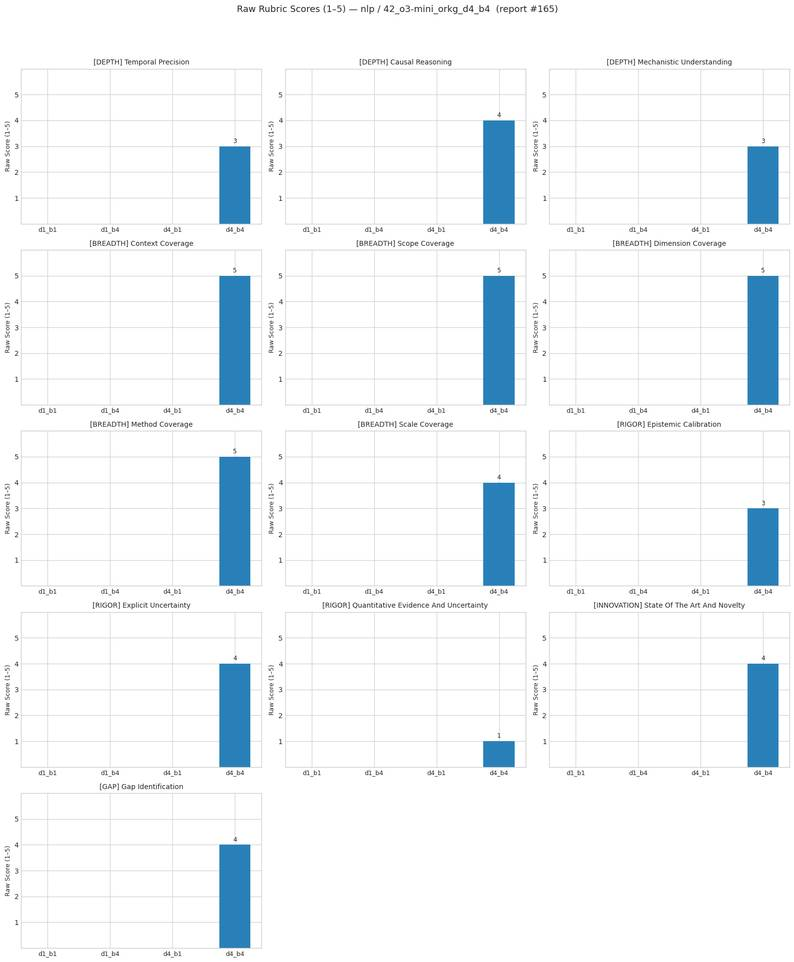

...

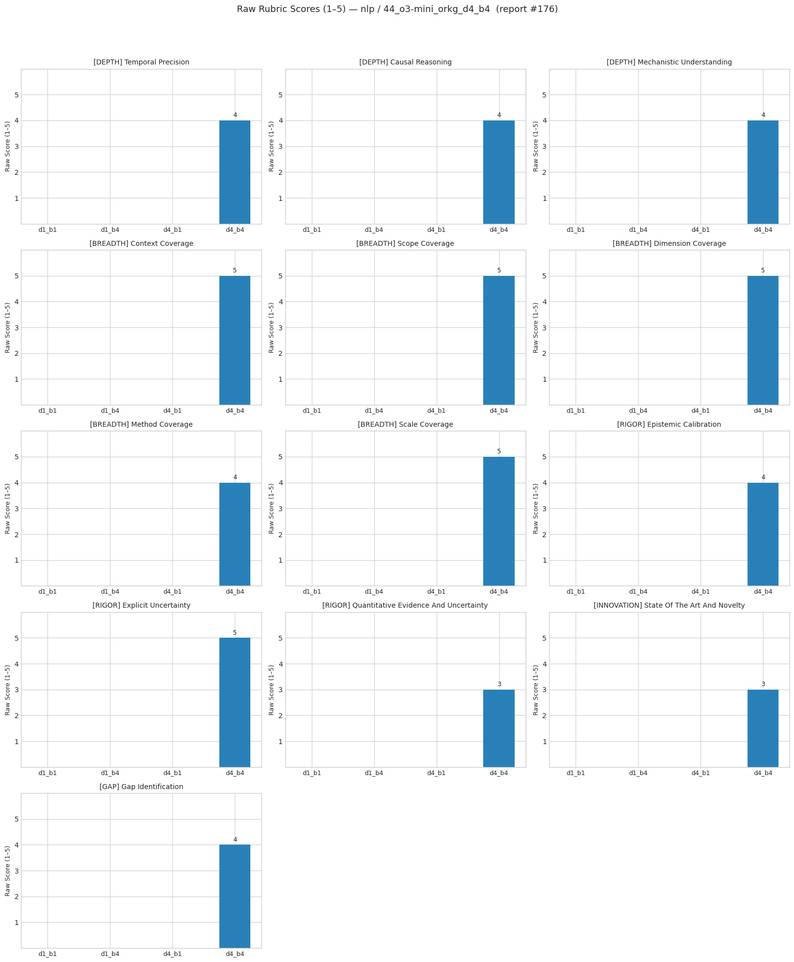

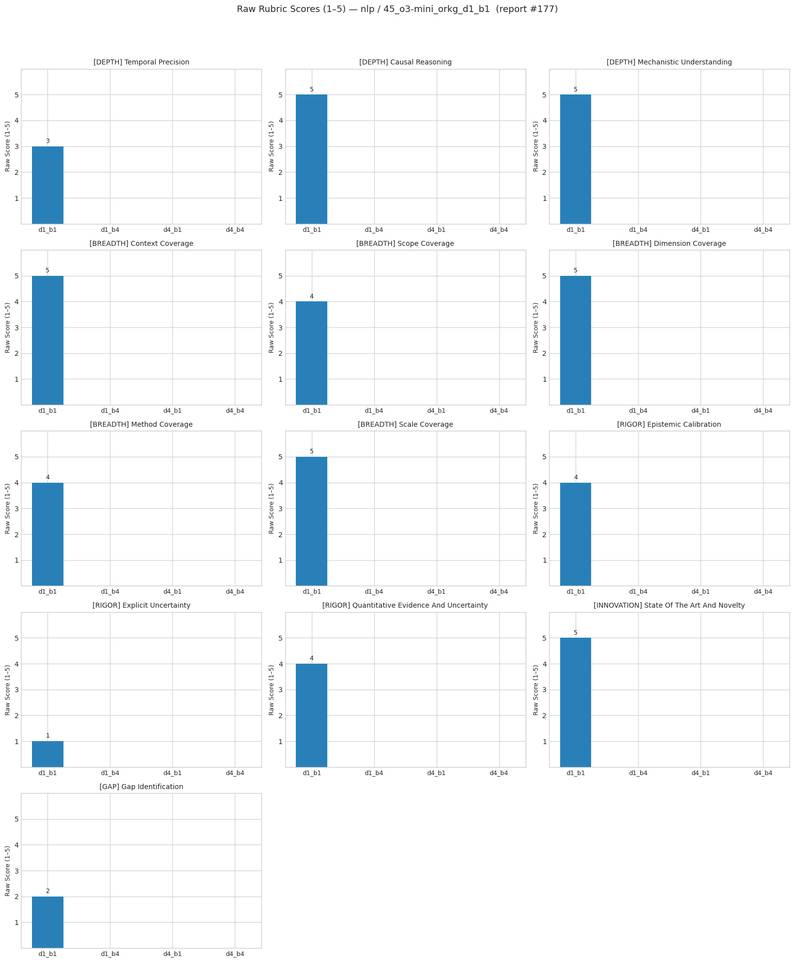

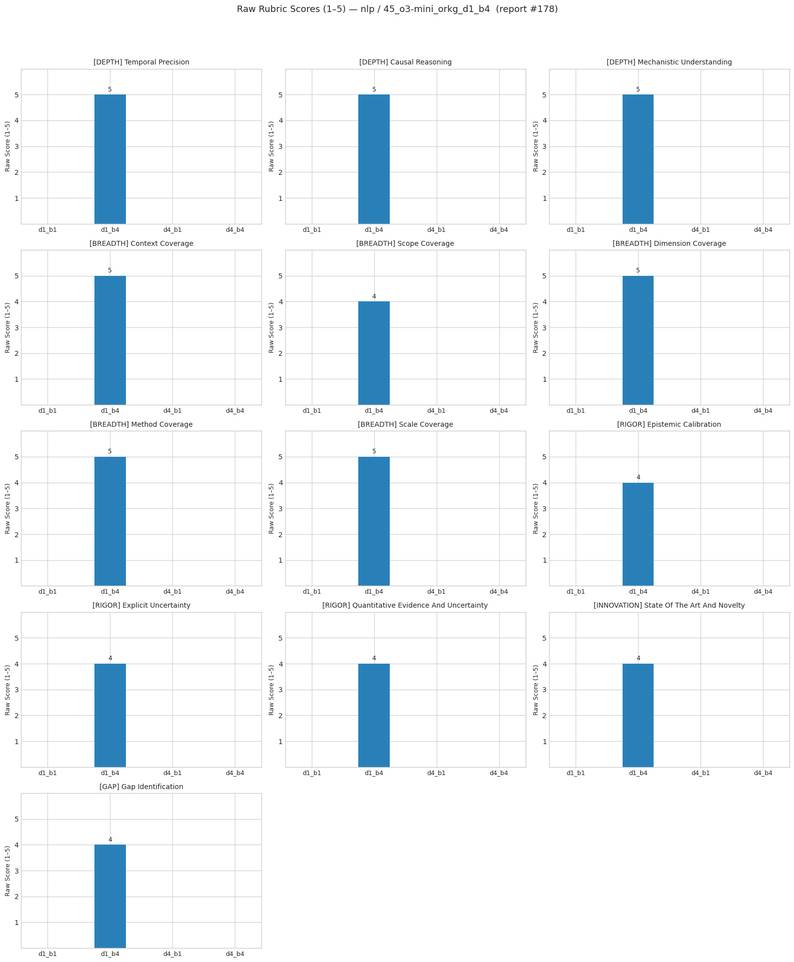

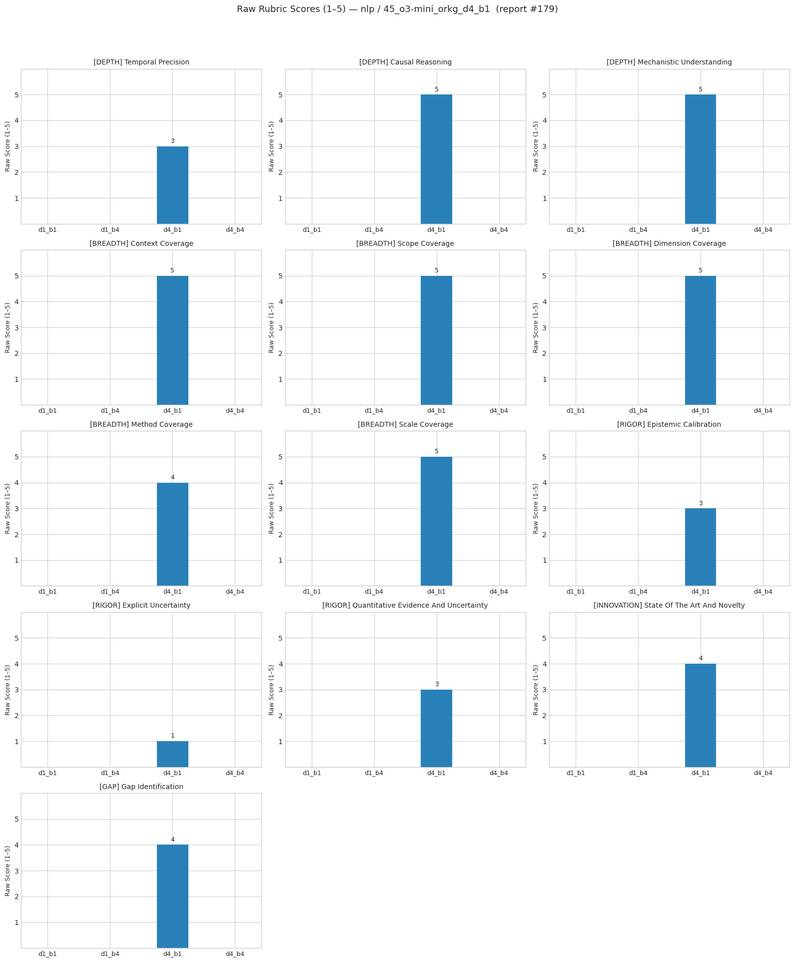

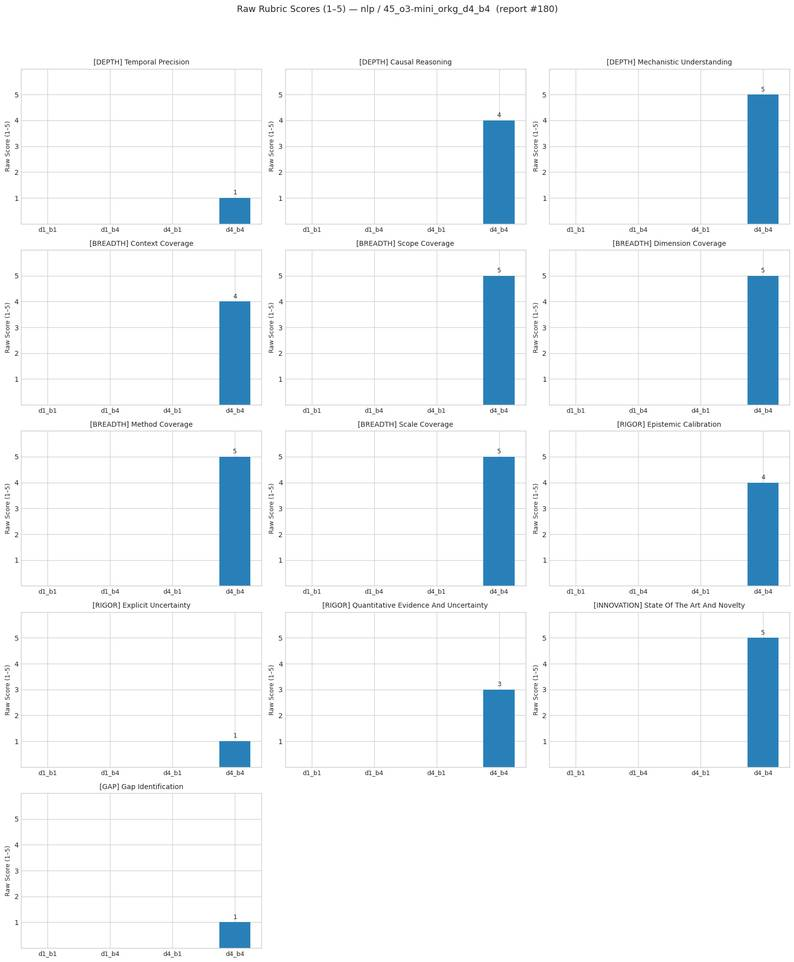

  … 180/196 reports plotted


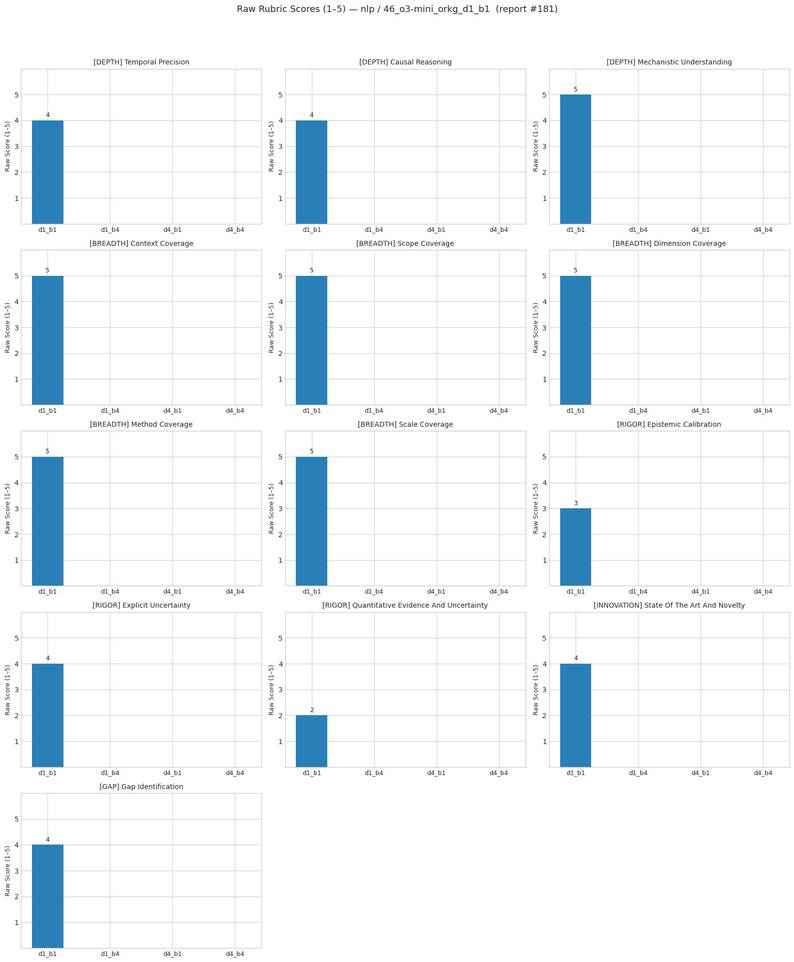

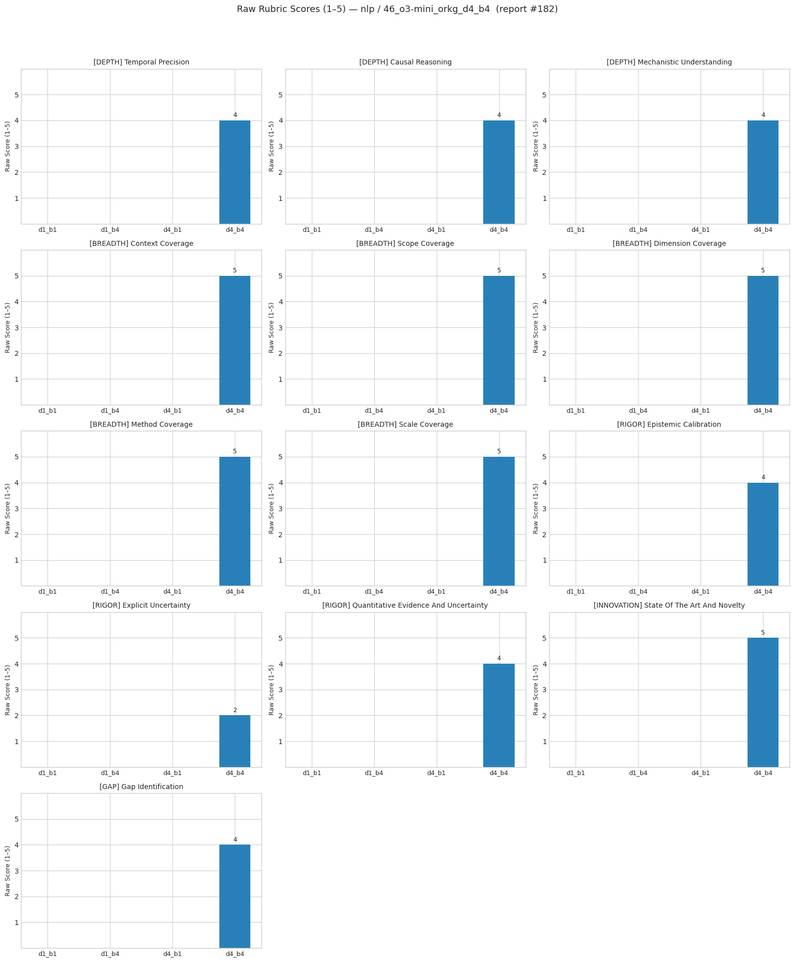

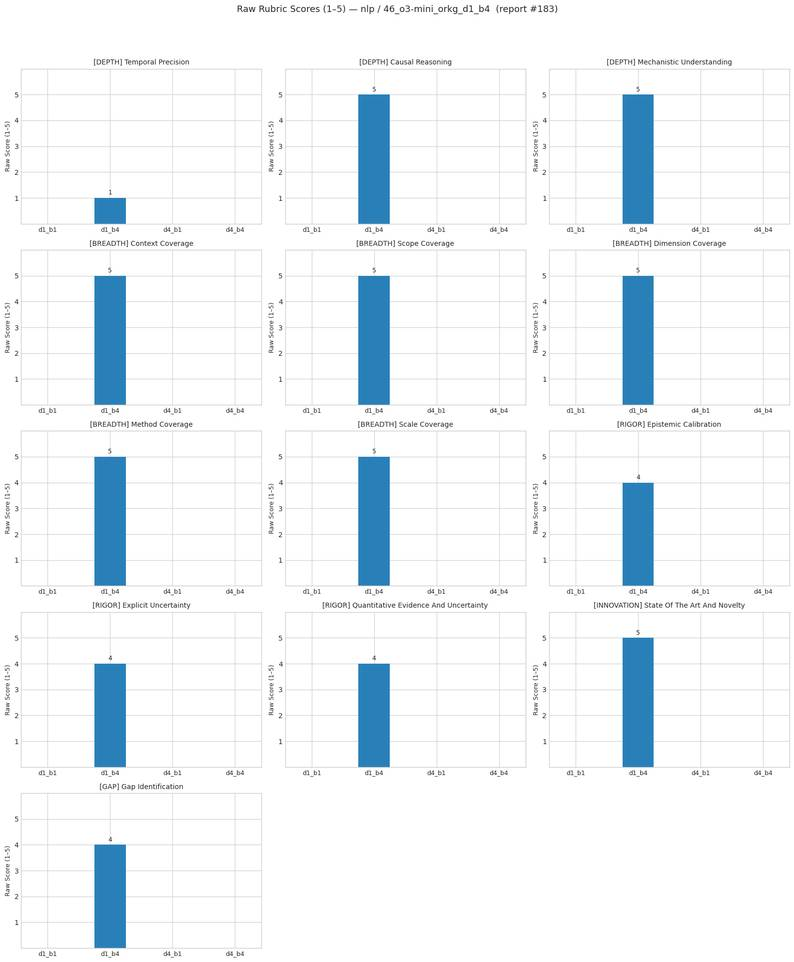

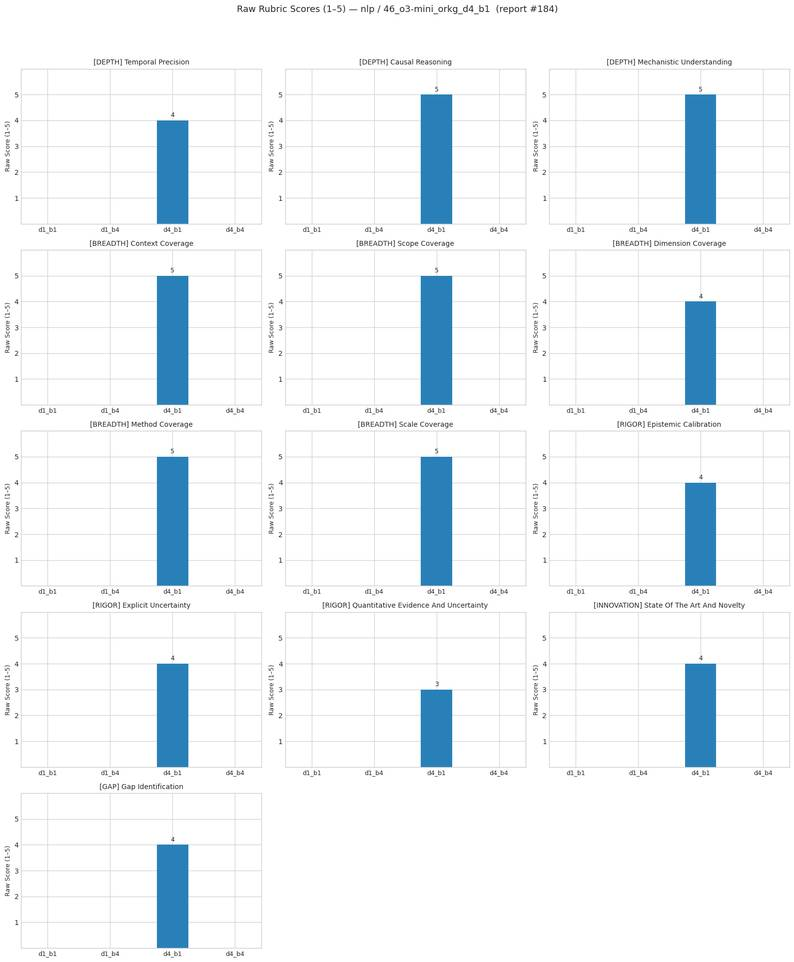

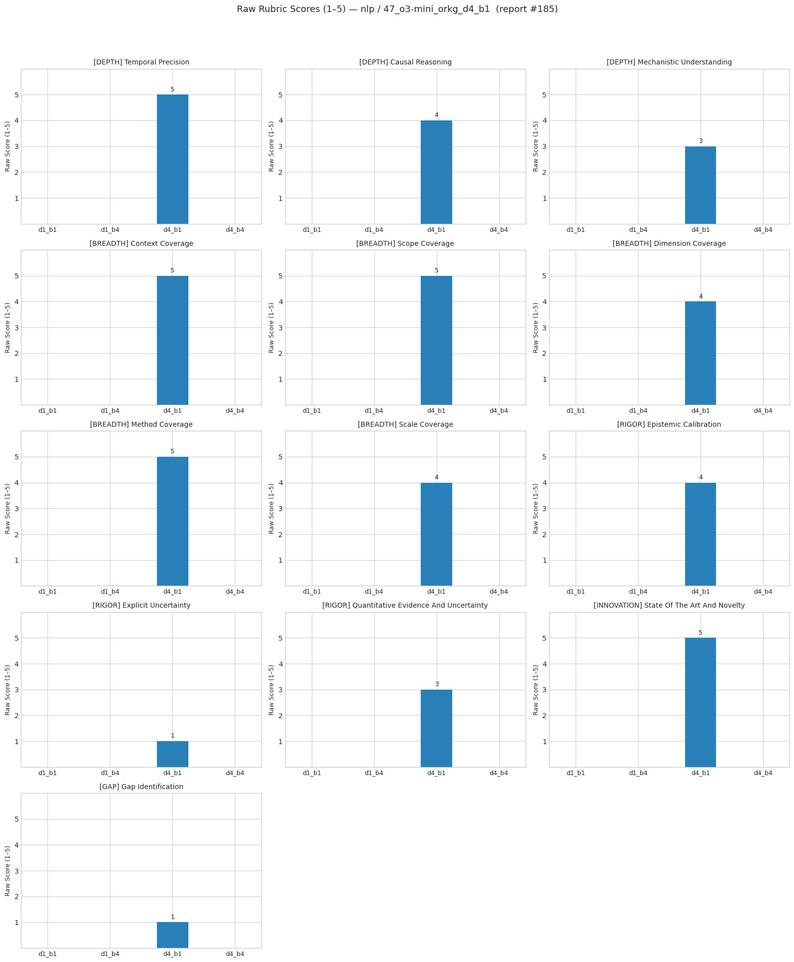

...

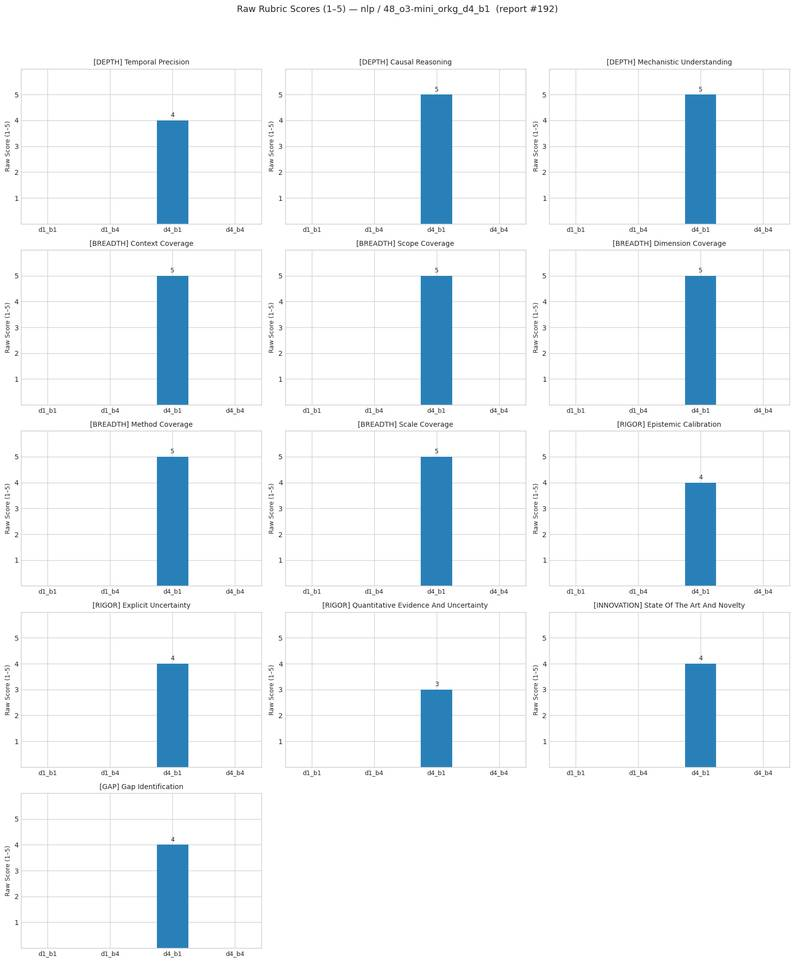

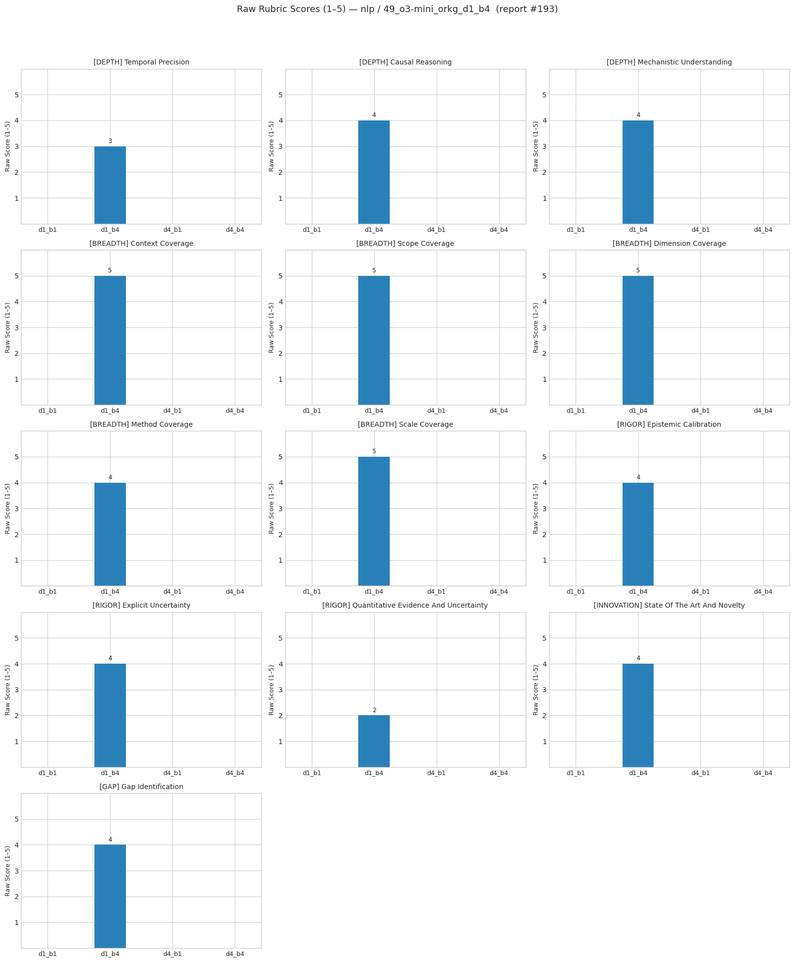

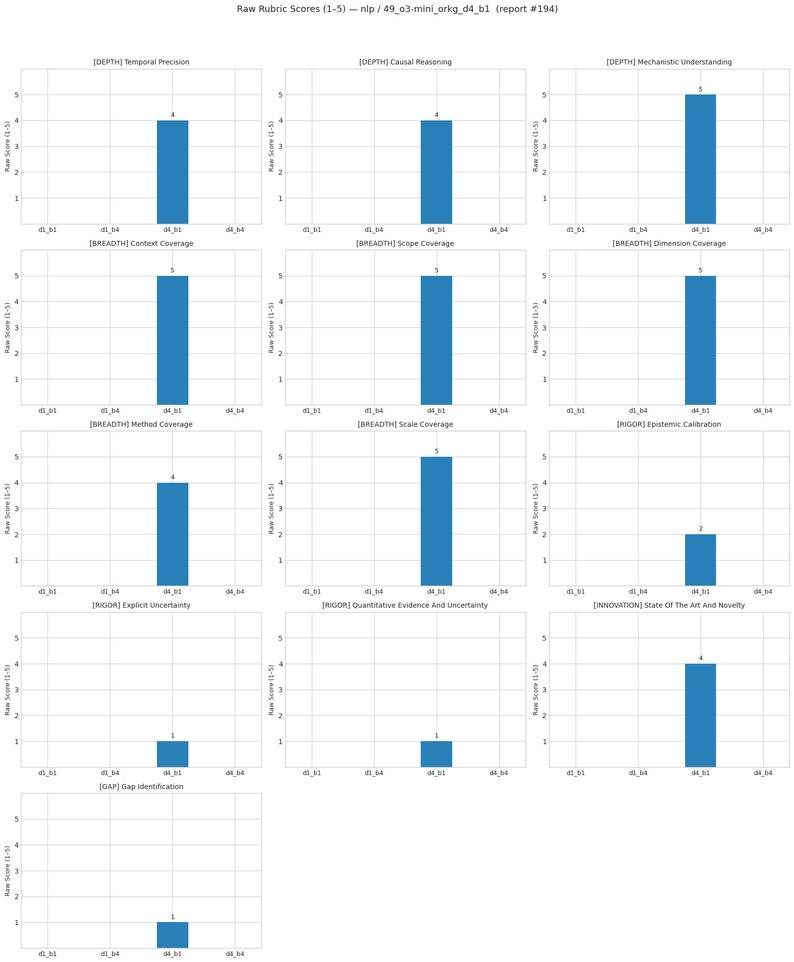

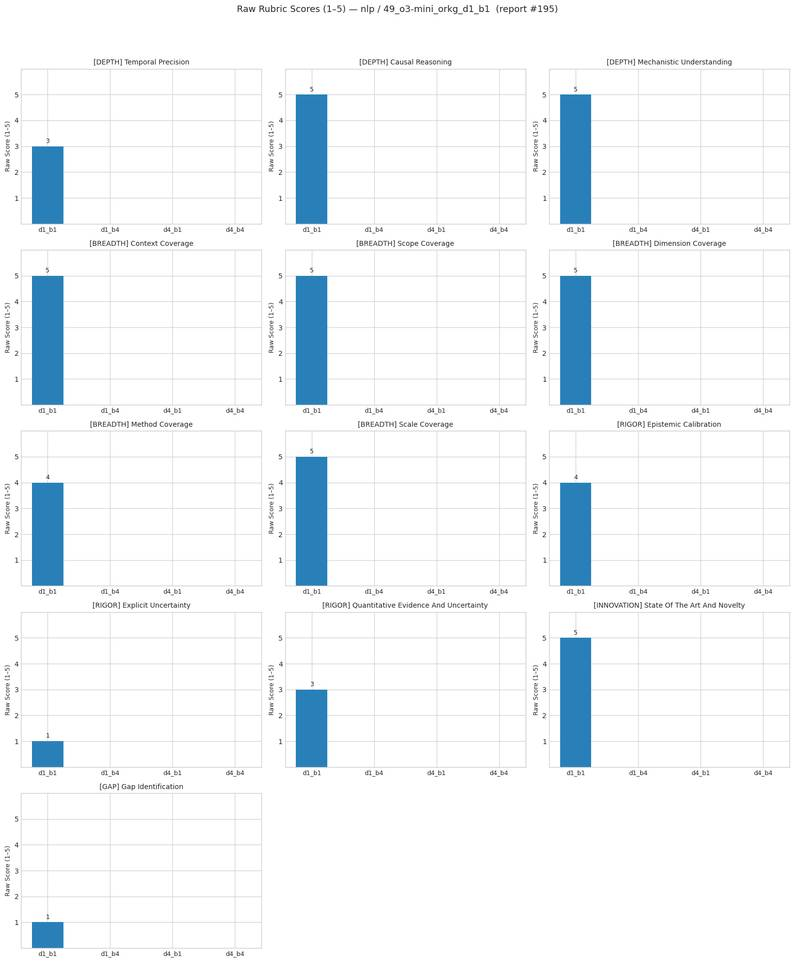

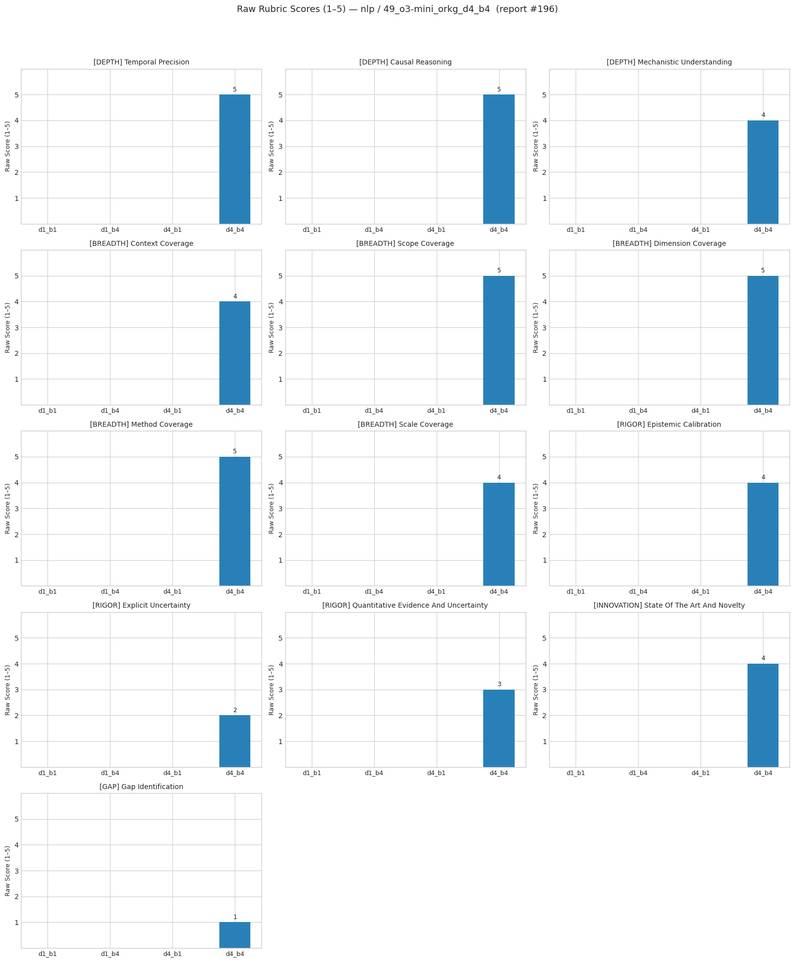

📊 §7b complete — 196 figures rendered (13 rubric panels each)


In [14]:
# ── 8 — Raw Rubric Scores: one figure per report (196 total) ───────────────
RUBRIC_ORDER = {
    'depth':      ['TemporalPrecision', 'CausalReasoning', 'MechanisticUnderstanding'],
    'breadth':    ['ContextCoverage', 'ScopeCoverage', 'DimensionCoverage',
                   'MethodCoverage', 'ScaleCoverage'],
    'rigor':      ['EpistemicCalibration', 'ExplicitUncertainty',
                   'QuantitativeEvidenceAndUncertainty'],
    'innovation': ['StateOfTheArtAndNovelty'],
    'gap':        ['GapIdentification'],
}

CATEGORY_COLORS = {
    'depth':      '#2980b9',
    'breadth':    '#2980b9',
    'rigor':      '#2980b9',
    'innovation': '#2980b9',
    'gap':        '#2980b9',
}

ALL_RUBRICS_FLAT = [
    (cat, rname)
    for cat, rnames in RUBRIC_ORDER.items()
    for rname in rnames
]  # 13 rubrics

def rubric_title(rname):
    return re.sub(r'(?<=[a-z])(?=[A-Z])', ' ', rname)

xs      = list(range(len(ALL_CONFIGS)))   # 0,1,2,3
n_cols  = 3
n_rows  = int(np.ceil(len(ALL_RUBRICS_FLAT) / n_cols))  # 5

plt.style.use('seaborn-v0_8-whitegrid')

for report_idx, r in enumerate(all_results, 1):
    cfg        = r['config']
    cfg_xi     = ALL_CONFIGS.index(cfg) if cfg in ALL_CONFIGS else None
    report_num = r.get('report_number', report_idx)
    stem       = r.get('report_stem', f'report_{report_idx}')

    fig, axes = plt.subplots(n_rows, n_cols,
                             figsize=(16, n_rows * 4),
                             squeeze=False)
    axes_flat = axes.ravel()

    for pi, (cat, rname) in enumerate(ALL_RUBRICS_FLAT):
        ax    = axes_flat[pi]
        color = CATEGORY_COLORS[cat]

        # Bar heights: only the report's own config position gets its score
        rdata  = r.get('rubric_scores', {}).get(rname, {})
        rating = float(rdata.get('rating', 0)) if rdata else 0.0

        heights = [0.0] * len(ALL_CONFIGS)
        if cfg_xi is not None and rating:
            heights[cfg_xi] = rating

        ax.bar(xs, heights, color=color, width=0.5)

        # Value label above the bar
        if cfg_xi is not None and rating:
            ax.text(cfg_xi, rating + 0.07, f'{rating:.0f}',
                    ha='center', va='bottom', fontsize=9)

        ax.set_title(f'[{cat.upper()}] {rubric_title(rname)}', fontsize=10)
        ax.set_xticks(xs)
        ax.set_xticklabels(ALL_CONFIGS, fontsize=9)
        ax.set_ylim(0, 6.0)
        ax.set_yticks([1, 2, 3, 4, 5])
        ax.set_ylabel('Raw Score (1–5)', fontsize=9)

    # Hide unused panels
    for j in range(pi + 1, len(axes_flat)):
        axes_flat[j].set_visible(False)

    fig.suptitle(
    f'Raw Rubric Scores (1–5) — {DOMAIN} / {stem}  (report #{report_idx})',
    fontsize=13,
    )
    fig.tight_layout(rect=[0, 0.02, 1, 0.95])
    plt.show()

    if report_idx % 20 == 0:
        print(f'  … {report_idx}/{len(all_results)} reports plotted')

# Keep fig_rub pointing at the last figure for §11
fig_rub = fig
print(f'📊 §8 complete — {len(all_results)} figures rendered ({len(ALL_RUBRICS_FLAT)} rubric panels each)')

## 9 — Batch Quality Plot

6-panel bar chart:
- X-axis: all 4 configs (`d1_b1`, `d1_b4`, `d4_b1`, `d4_b4`)
- Bar height: config-mean score (0–1)

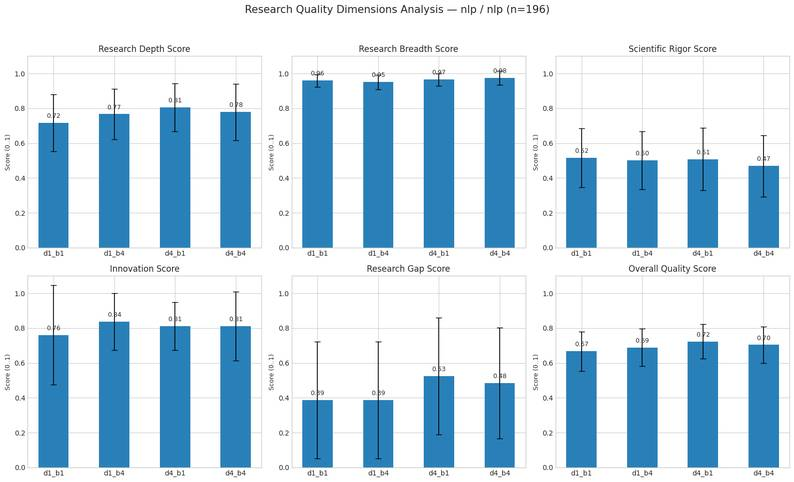

Batch plot rendered


In [15]:
PANEL_TITLES = {
    'depth':      'Research Depth Score',
    'breadth':    'Research Breadth Score',
    'rigor':      'Scientific Rigor Score',
    'innovation': 'Innovation Score',
    'gap':        'Research Gap Score',
    'overall':    'Overall Quality Score',
}

cfg_stats: Dict[str, Dict] = {}
for row in config_summary_rows:
    cfg = row['config']
    cfg_stats[cfg] = {
        panel_key: (row.get(f'{panel_key}_mean', 0.0),
                    row.get(f'{panel_key}_std',  0.0),
                    row['n_docs'])
        for panel_key in PANEL_TITLES
    }

xs = list(range(len(ALL_CONFIGS)))

plt.style.use('seaborn-v0_8-whitegrid')
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
axes = axes.ravel()

for i, (cat, panel_title) in enumerate(PANEL_TITLES.items()):
    ax = axes[i]

    means = [cfg_stats[cfg][cat][0] for cfg in ALL_CONFIGS]
    stds  = [cfg_stats[cfg][cat][1] for cfg in ALL_CONFIGS]
    ns    = [cfg_stats[cfg][cat][2] for cfg in ALL_CONFIGS]

    # Show error bars only when n > 1 (i.e. real variance exists)
    yerr = [s if n > 1 else 0 for s, n in zip(stds, ns)]

    ax.bar(
        xs, means, color='#2980b9', width=0.5,
        yerr=yerr, capsize=4,
        error_kw={'elinewidth': 1.2, 'ecolor': 'black'},
    )
    ax.set_title(panel_title, fontsize=12)
    ax.set_xticks(xs)
    ax.set_xticklabels(ALL_CONFIGS, fontsize=10)
    ax.set_ylim(0, 1.1)
    ax.set_ylabel('Score (0..1)', fontsize=9)

    for x, v in zip(xs, means):
        ax.text(x, v + 0.02, f'{v:.2f}', ha='center', va='bottom', fontsize=9)

n_total = len(all_results)
fig.suptitle(
    f'Research Quality Dimensions Analysis — {DOMAIN} / {DOMAIN} (n={n_total})',
    fontsize=15
)
fig.tight_layout(rect=[0, 0.02, 1, 0.95])
plt.show()
print("Batch plot rendered")

## 10 — Save Raw Model Outputs to Disk

Saves a single timestamped JSON file with **all raw rubric ratings and rationales**
for every report in the batch, plus evaluation timing and model/judge metadata.
Also saves the raw rubric score plot PNG.

File name pattern: `raw_output_{DOMAIN}_{model_slug}_{timestamp}.json`


In [19]:
# ── Save raw rubric outputs (ratings + rationales) to a timestamped JSON ────

# EVAL_START_TIME captured right after judge init.
if 'EVAL_START_TIME' not in dir():
    EVAL_START_TIME = datetime.now(timezone.utc)

EVAL_END_TIME = datetime.now(timezone.utc)

model_slug    = MODEL_ID.replace('/', '--').replace(' ', '_')
judge_id      = getattr(judge, 'model_id', MODEL_ID)
timestamp_str = EVAL_END_TIME.strftime('%Y%m%d_%H%M%S')

raw_output_doc = {
    'meta': {
        'domain':          DOMAIN,
        'model':           MODEL_ID,
        'eval_start_utc':  EVAL_START_TIME.isoformat(),
        'eval_end_utc':    EVAL_END_TIME.isoformat(),
        'eval_duration_s': round((EVAL_END_TIME - EVAL_START_TIME).total_seconds(), 1),
        'n_reports':       len(all_results)
    },
    'reports': [
        {
            'report_stem':   r['report_stem'],
            'config':        r['config'],
            'report_number': r['report_number'],
            'question':      r['question'],
            'raw_rubric_outputs': {
                rname: {
                    'rating':    rdata['rating'],
                    'rationale': rdata['rationale'],
                }
                for rname, rdata in r.get('rubric_scores', {}).items()
            },
        }
        for r in all_results
    ],
}

out_dir = Path(OUTPUT_DIR)
out_dir.mkdir(parents=True, exist_ok=True)

# Save JSON
raw_out_path = out_dir / f'raw_output_{DOMAIN}_{model_slug}_{timestamp_str}.json'
raw_out_path.write_text(
    json.dumps(raw_output_doc, indent=2, ensure_ascii=False),
    encoding='utf-8',
)

# Save rubric raw score plot
rub_fig_path = out_dir / f'batch_raw_rubric_scores_{DOMAIN}_{model_slug}.png'
fig_rub.savefig(rub_fig_path, dpi=200, bbox_inches='tight')

print(f'💾 Raw output JSON  → {raw_out_path}')
print(f'💾 Rubric plot      → {rub_fig_path}')
print(f'   Model   : {MODEL_ID}')
print(f'   Judge   : {judge_id}')
print(f'   Start   : {EVAL_START_TIME.isoformat()}')
print(f'   End     : {EVAL_END_TIME.isoformat()}')
print(f'   Duration: {raw_output_doc["meta"]["eval_duration_s"]} s')
print(f'   Reports : {len(all_results)}')
print()
display(Markdown('---\n### 🗂️ Raw Output Meta Preview\n---'))
print(json.dumps(raw_output_doc['meta'], indent=2))


💾 Raw output JSON  → /nfs/home/gillm/deep-research/scripts/LLMJ-Out-Batch/nlp/raw_output_nlp_Qwen--Qwen3-1.7B_20260511_192906.json
💾 Rubric plot      → /nfs/home/gillm/deep-research/scripts/LLMJ-Out-Batch/nlp/batch_raw_rubric_scores_nlp_Qwen--Qwen3-1.7B.png
   Model   : Qwen/Qwen3-1.7B
   Judge   : Qwen/Qwen3-1.7B
   Start   : 2026-05-11T12:00:22.280200+00:00
   End     : 2026-05-11T19:29:06.879982+00:00
   Duration: 26924.6 s
   Reports : 196



---
### 🗂️ Raw Output Meta Preview
---

{
  "domain": "nlp",
  "model": "Qwen/Qwen3-1.7B",
  "eval_start_utc": "2026-05-11T12:00:22.280200+00:00",
  "eval_end_utc": "2026-05-11T19:29:06.879982+00:00",
  "eval_duration_s": 26924.6,
  "n_reports": 196
}
